In [1]:
import os
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import pandas as pd
import keras
import pickle
import latex

from IPython.display import Markdown, display

from keras import backend as K
from keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
from keras.initializers import Ones, Zeros, Constant, RandomNormal
from keras.models import Model, load_model
from keras.layers import Dense, Input, Lambda, concatenate, SimpleRNN, Reshape, RepeatVector, PReLU, BatchNormalization, LeakyReLU
from keras.losses import mse
from keras.constraints import non_neg

/anaconda3/lib/python3.6/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters
Using TensorFlow backend.


In [2]:
# Change presentation settings

%matplotlib inline

matplotlib.rcParams["figure.figsize"] = (16.0, 10.0)

#matplotlib.rcParams['font.family'] = 'sans-serif'
#matplotlib.rcParams['font.sans-serif'] = ['Liberation Sans']

matplotlib.rcParams["axes.spines.left"] = True
matplotlib.rcParams["axes.spines.top"] = True
matplotlib.rcParams["axes.spines.right"] = True
matplotlib.rcParams["axes.spines.bottom"] = True
matplotlib.rcParams["axes.labelsize"] = 14
matplotlib.rcParams["axes.titlesize"] = 18

matplotlib.rcParams["xtick.top"] = True
matplotlib.rcParams["ytick.right"] = True
matplotlib.rcParams["xtick.direction"] = "in"
matplotlib.rcParams["ytick.direction"] = "in"
matplotlib.rcParams["xtick.labelsize"] = 10
matplotlib.rcParams["ytick.labelsize"] = 10
matplotlib.rcParams["xtick.major.size"] = 10
matplotlib.rcParams["ytick.major.size"] = 10
matplotlib.rcParams["xtick.minor.size"] = 5
matplotlib.rcParams["ytick.minor.size"] = 5
matplotlib.rcParams["xtick.minor.visible"] = True

#matplotlib.rcParams["text.usetex"] = True

matplotlib.rcParams["lines.linewidth"] = 2

matplotlib.rcParams["legend.fontsize"] = 14

color_palette = {"Indigo": {
                    50: "#E8EAF6",
                    100: "#C5CAE9",
                    200: "#9FA8DA",
                    300: "#7986CB",
                    400: "#5C6BC0",
                    500: "#3F51B5",
                    600: "#3949AB",
                    700: "#303F9F",
                    800: "#283593",
                    900: "#1A237E"},
                 "Orange": {      
                    50: "#FFF3E0",
                    100: "#FFE0B2",
                    200: "#FFCC80",
                    300: "#FFB74D",
                    400: "#FFA726",
                    500: "#FF9800",
                    600: "#FB8C00",
                    700: "#F57C00",
                    800: "#EF6C00",
                    900: "#E65100"}
                }

line_styles = [(0, ()), (0, (1, 2)), (0, (3, 2))]

In [3]:
def plot_inputs(samples,lumi,pileup):
    inputs = []
    for s in range(len(samples)):
        for r in range(len(samples[s])):
            if s == 0:
                inputs.append([])
            inputs[r].append(samples[s][r])

    display(Markdown("<h2>Displaying Inputs</h2>"))
            
    plt.figure()
    fig,ax=plt.subplots()
    for r in range(len(inputs)):
        ax.scatter(lumi,inputs[r],label=labels[r])
    ax.legend(loc='lower left', bbox_to_anchor= (1.01, 0), ncol=1, 
                  borderaxespad=0, frameon=False)
    plt.xlabel('lumi id')
    plt.ylabel('rate/pileup')

    plt.figure()
    fig,ax=plt.subplots()
    for r in range(len(inputs)):
        ax.scatter(pileup,inputs[r],label=labels[r])
    ax.legend(loc='lower left', bbox_to_anchor= (1.01, 0), ncol=1, 
                  borderaxespad=0, frameon=False)
    plt.xlabel('pileup')
    plt.ylabel('rate/pileup')
    plt.show()

In [4]:
def plot_relerror(num_rates,x,lumi,reconstructed,error):
    error_reformat = []
    max_error = []
    inp = []
    outp = []
    for i in range(num_rates):
        error_reformat.append([])
        inp.append([])
        outp.append([])
        
    display(Markdown("<h2>Plotting Errors</h2>"))

    for i in range(len(error)):
        max_error.append(max(error[i]))
        for j in range(num_rates):
            error_reformat[j].append(error[i][j])
            outp[j].append(reconstructed[i][j])
            inp[j].append(x[i][j])
            
    plt.figure(figsize=[15,10])
    for i in range(len(error_reformat)):
        plt.subplot(2,3,i+1)
        minimum = min(error_reformat[i])
        maximum = max(error_reformat[i])
        bin_width = .02
        if minimum != maximum:
            bins = np.linspace(minimum,maximum,int((maximum-minimum)/bin_width))
        else:
            bins = np.linspace(-1,1,20)
        plt.hist(error_reformat[i],bins=bins,label=labels[i],alpha=.5)
        plt.title(labels[i])
        plt.xlim(-1.1,1.1)
        plt.xlabel(relativeerror)
    plt.tight_layout()

    plt.figure(figsize=[15,10])
    mins = []
    maxes = []
    for err in error_reformat:
        mins.append(min(err))
        maxes.append(max(err))
    bins = np.linspace(min(mins),max(maxes),50)
    for i in range(len(error_reformat)):
        plt.hist(error_reformat[i],bins=bins,label=labels[i],alpha=.5)
    plt.title('Relative Error Per HLT Part')
    plt.xlabel(relativeerror)
    plt.legend()
    plt.tight_layout()

    #lumi = np.linspace(0,len(error_reformat0]),len(error_reformat0]))
    plt.figure(figsize=[15,10])
    for i in range(num_rates):
        plt.subplot(2,3,i+1)
        plt.scatter(lumi,error_reformat[i],label=labels[i],alpha=.5)
        plt.xlabel('lumi id')
        plt.ylabel('error')
        plt.title(labels[i])  
        plt.ylim(-1,1)
    plt.tight_layout()


    plt.show()

In [19]:
def plot_inputvsoutput(num_rates,x,reconstructed,error,lumi,pileup):
    inp = []
    outp = []
    for i in range(num_rates):
        inp.append([])
        outp.append([])

    for i in range(len(error)):
        for j in range(num_rates):
            outp[j].append(reconstructed[i][j])
            inp[j].append(x[i][j])
    
    display(Markdown("<h2>Plotting Inputs vs Outputs</h2>"))

    plt.figure(figsize=[15,10])
    for i in range(num_rates):
        plt.subplot(2,3,i+1)
        plt.plot(outp[i],inp[i],label=labels[i], linestyle='',marker='o', markersize=3, alpha=0.5)
        #plt.scatter(lumi,outp[i],label='output',alpha=.5)
        plt.xlabel('output')
        plt.ylabel('input')
        plt.title(labels[i])
        plt.axis('square')
        plt.xlim(0,2)
        plt.ylim(0,2)

    plt.figure(figsize=[20,10])
    for i in range(num_rates):
        plt.subplot(2,3,i+1)
        plt.plot(lumi,inp[i],label='Input', linestyle='',marker='o', markersize=5)
        plt.plot(lumi,outp[i],label='Output', linestyle='',marker='^',markersize=5,alpha=.2)
        plt.title(labels[i])
        plt.xlabel('Lumi ID')
        plt.ylabel('Rate/Pileup')
        #plt.xlim(0,.5)
        #plt.ylim(0,5)
        plt.legend()    
    plt.tight_layout()


    plt.tight_layout()
    plt.show()
    
    output_rates = []
    input_rates = []

    for r in range(num_rates):
        output_rates.append([])
        input_rates.append([])

    for r in range(len(reconstructed)):
        for o in range(num_rates):
            output_rates[o].append(reconstructed[r][o]*pileup[r])
            input_rates[o].append(x[r][o]*pileup[r])

    plt.figure(figsize=[15,10])

    for i in range(num_rates):
        plt.subplot(2,3,i+1)
        plt.scatter(pileup,input_rates[i],label='Input',alpha=.1)
        plt.scatter(pileup,output_rates[i],label='Output',alpha=.5)
        plt.xlabel('pileup')
        plt.ylabel('rate')
        plt.title(labels[i])
        plt.legend()
        #plt.ylim(0,45)

    plt.tight_layout()

    plt.show()

In [24]:
def analyze_run(model_name,runnum):
    
    display(Markdown("<h1>" + runnum + "</h1>"))
    
    model = load_model("%s.h5" % (model_name))
    
    samples = np.array(good_data[runnum]['samples'])
    lumi = good_data[runnum]['lumiid']
    pileup = good_data[runnum]['pileup'][0]

    # Look at inputs
    plot_inputs(samples,lumi,pileup)
    
    # Generate predictions
    reconstructed = model.predict(np.array(samples))
    error = (samples-reconstructed)/(abs(samples)+abs(reconstructed))
    
    # Plot errors
    plot_relerror(num_rates,samples,lumi,reconstructed,error)
    
    # Look at Input vs Output
    plot_inputvsoutput(num_rates,samples,reconstructed,error,lumi,pileup)

In [7]:
def plot_loss(data, save_name=False):
    """Plots the training and validation loss"""
    fig, ax = plt.subplots()

    plt.xlabel("Epoch", horizontalalignment='right', x=1.0)
    plt.ylabel("Cross-entropy", horizontalalignment='right', y=1.0)

    plt.plot(data["loss"], linestyle=line_styles[0], color=color_palette["Indigo"][800])
    plt.plot(data["val_loss"], linestyle=line_styles[2], color=color_palette["Orange"][400])
    plt.legend(["Training data set", "Validation data set"], loc="upper right", frameon=False)
    plt.yscale("log")
    
    if save_name:
        fig.savefig("%s/%s.eps" % (figure_export_directory, save_name), bbox_inches="tight")

    plt.show();

In [8]:
def train_nn(model, x, y, batch_size, loss, name, xval):

    adam = keras.optimizers.Adam(lr=0.003,
                                 beta_1=0.9,
                                 beta_2=0.999,
                                 epsilon=None,
                                 decay=0.0,
                                 amsgrad=False)

    early_stopper = EarlyStopping(monitor="val_loss",
                                  patience=32,
                                  verbose=True,
                                  mode="auto")

    reduce_lr = ReduceLROnPlateau(monitor="val_loss",
                                  factor=0.1,
                                  patience=24)
    
    checkpoint_callback = ModelCheckpoint(("%s.h5" % (name)),
                                          monitor="val_loss",
                                          verbose=False,
                                          save_best_only=True,
                                          mode="min")
    
    model.compile(loss=loss, optimizer=adam)
    
    history = model.fit(x, y,
                     batch_size=batch_size,
                     epochs=1000,
                     verbose=2,
                     initial_epoch=0,
                     shuffle=True,
                     validation_data=(xval,xval),
                     callbacks=[early_stopper, checkpoint_callback])
    return history

## Data

In [9]:
good_data_file = 'PileupNewData_data.pickle'
bad_data_file = 'PileupNewData_bad.pickle'

subplot_size = [2,3]
fig_size = [20,20]

with open(good_data_file, 'rb') as handle:
    good_data = pickle.load(handle)
with open(bad_data_file, 'rb') as handle:
    bad_data = pickle.load(handle)

In [10]:
runlength = []
badrunlength = []
numruns = []
eras = []
runs_by_era = []
bad_runs_by_era = []
i = -1
for era in good_data['Eras']:
    runlength.append([])
    badrunlength.append([])
    runs_by_era.append([])
    bad_runs_by_era.append([])
    eras.append(era)
    i += 1
    j = 0
    for run in good_data['Eras'][era]:
        runlength[i].append(len(good_data[run]['lumiid']))
        runs_by_era[i].append(run)
        j+=1
    for run in bad_data['Eras'][era]:
        badrunlength[i].append(len(bad_data[run]['lumiid']))
        bad_runs_by_era[i].append(run)
    numruns.append(j)
    
m = numruns.index(max(numruns))
m=9
n = runlength[m].index(max(runlength[m]))
a = badrunlength[m].index(max(badrunlength[m]))

print(eras[m],runs_by_era[m][n])
print(eras[m],runs_by_era[m][n-1])
print(eras[m],bad_runs_by_era[m][a])
print(eras[m],bad_runs_by_era[m][a+2])

x_train = np.array(good_data[runs_by_era[m][n]]['samples'])
pileup_train = np.array(good_data[runs_by_era[m][n]]['pileupInput'][0])
x_test = np.array(good_data[runs_by_era[m][n-1]]['samples'])
pileup_test = np.array(good_data[runs_by_era[m][n-1]]['pileupInput'][0])
x_val = np.array(good_data[runs_by_era[m][n+1]]['samples'])
pileup_val = np.array(good_data[runs_by_era[m][n+1]]['pileupInput'][0])
x_bad1 = np.array(bad_data["302975"]['samples'])
pileup_bad1 = np.array(bad_data["302975"]['pileupInput'][0])
x_bad2 = np.array(bad_data["302995"]['samples'])
pileup_bad2 = np.array(bad_data["302995"]['pileupInput'][0])

num_rates = len(x_train[0])
print(badrunlength[m])


eraV310 304144
eraV310 304125
eraV310 302975
eraV310 302995
[52, 23, 12, 4, 120, 27, 21, 27, 243, 56, 54, 55, 218, 0, 583, 151, 284, 0, 2, 46, 4, 9, 9, 203, 28, 79, 35, 29, 0, 0, 0, 0]


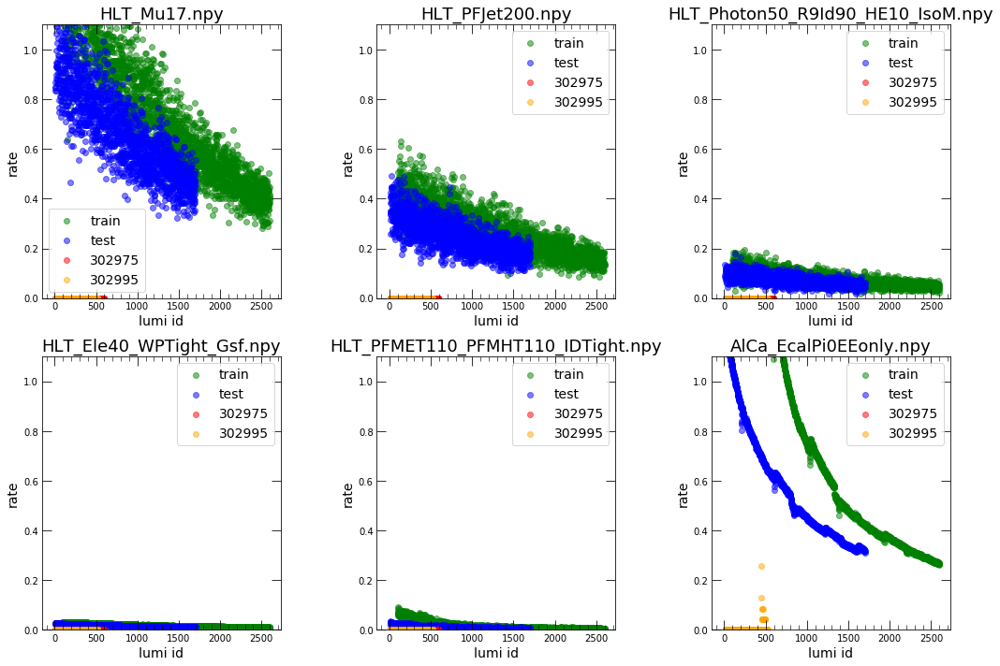

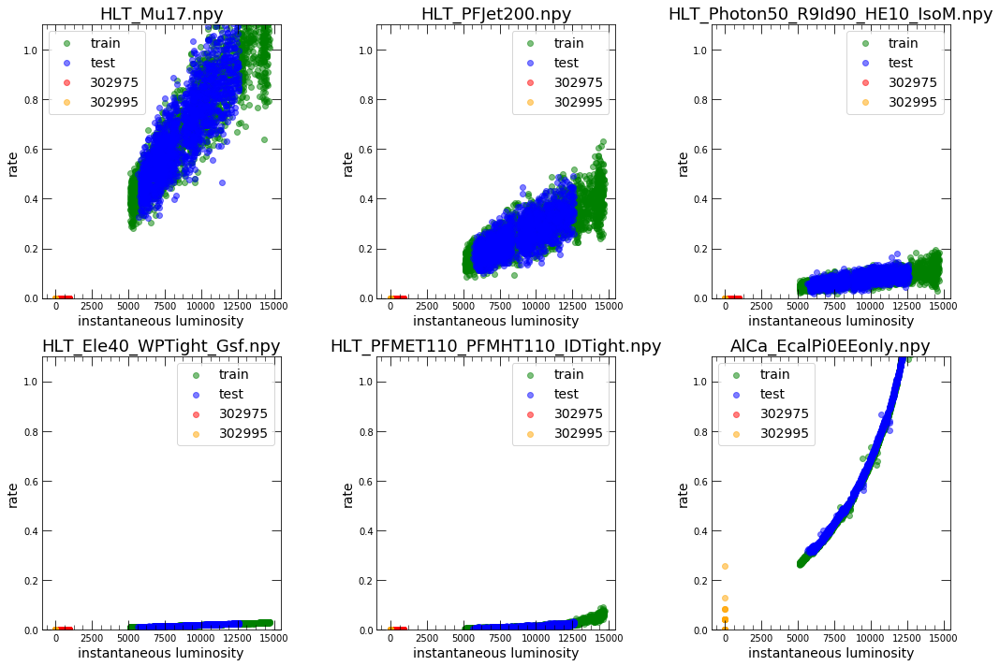

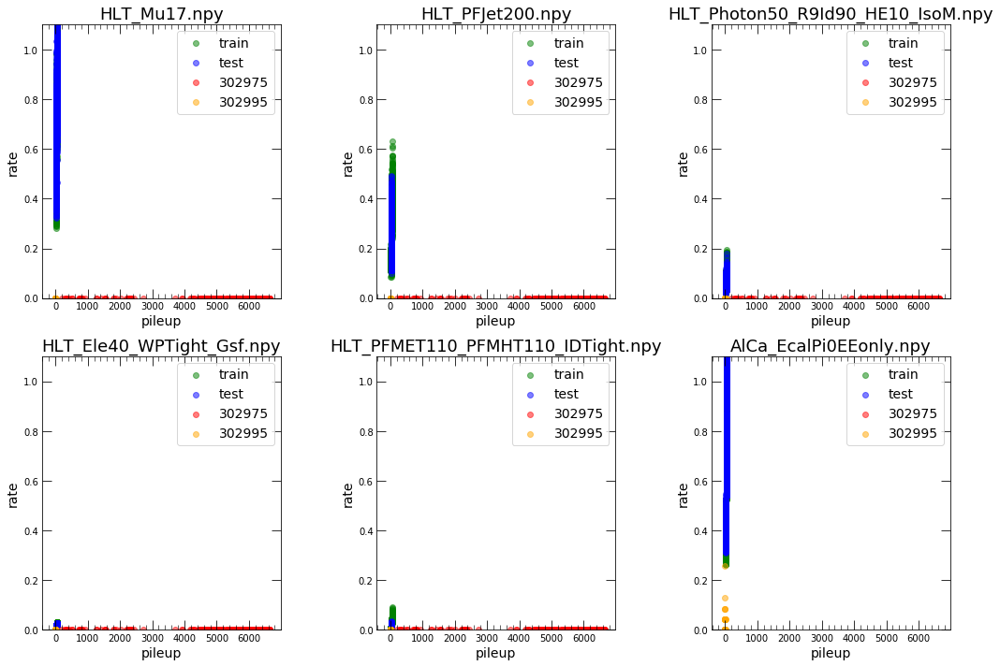

In [11]:
relativeerror = r"$\frac{input rate - output rate}{|input rate| + |output rate|}$"
sumsquareddif = r"$\sum_{i} (input rate_i-output rate_i)^2$"

plots = [x_train,x_test,x_bad1,x_bad2]
titles = ["train","test","302975","302995"]

stuff = [[],[],[],[]]
lumi = [[],[],[],[]]
inst = [[],[],[],[]]
pileup = [[],[],[],[]]
for h in range(4):
    if h == 0:
        lumi[h] = good_data["304144"]['lumiid']
        inst[h] = good_data["304144"]['instlumi']
        pileup[h] = good_data["304144"]['pileup']
        stuff[h] = good_data["304144"]['rates']
    elif h == 1:
        lumi[h] = good_data["304125"]['lumiid']
        inst[h] = good_data["304125"]['instlumi']
        pileup[h] = good_data["304125"]['pileup']
        stuff[h] = good_data["304125"]['rates']
    elif h == 2:
        lumi[h] = bad_data["302975"]['lumiid']
        inst[h] = bad_data["302975"]['instlumi']
        pileup[h] = bad_data["302975"]['pileup']
        stuff[h] = bad_data["302975"]['rates']
    else:
        lumi[h] = bad_data["302995"]['lumiid']
        inst[h] = bad_data["302995"]['instlumi']
        pileup[h] = bad_data["302995"]['pileup']
        stuff[h] = bad_data["302995"]['rates']
    
labels = good_data['HLT'] 
colors = ["g","b","r","orange"]
    
plt.figure(figsize=[15,10])
for i in range(num_rates):
    plt.subplot(2,3,i+1)
    for k in range(4):
        #print(len(i[k]),len(stuff[k][i]))
        plt.scatter(lumi[k],stuff[k][i],c=colors[k],label=titles[k],alpha=.5)
    plt.xlabel('lumi id')
    plt.ylabel('rate')
    plt.ylim(0,1.1)
    plt.title(labels[i])
    plt.legend()

plt.tight_layout()

plt.figure(figsize=[15,10])
              
for i in range(num_rates):
    plt.subplot(2,3,i+1)
    for k in range(4):
        plt.scatter(inst[k][i],stuff[k][i],c=colors[k],label=titles[k],alpha=.5)
    plt.xlabel('instantaneous luminosity')
    plt.ylabel('rate')
    plt.title(labels[i])
    plt.legend()
    plt.ylim(0,1.1)

plt.tight_layout()

plt.figure(figsize=[15,10])
              
for i in range(num_rates):
    plt.subplot(2,3,i+1)
    for k in range(4):
        plt.scatter(pileup[k][i],stuff[k][i],c=colors[k],label=titles[k],alpha=.5)
    plt.xlabel('pileup')
    plt.ylabel('rate')
    plt.title(labels[i])
    plt.legend()
    plt.ylim(0,1.1)


plt.tight_layout()

plt.show()

## Simple Autoencoder

In [12]:
model_name = "NoConstraintsRandNorm"

In [14]:
# Define the architecture

_input = Input(shape=(6,), name="input")

middle = Dense(5,
               kernel_initializer=RandomNormal(mean=0, stddev=.5/np.sqrt(6), seed=None),
               bias_initializer=Zeros(),
               #kernel_constraint=non_neg(),
               #bias_constraint=non_neg(),
               activation = 'relu',
               name="middle")(_input)

norm = BatchNormalization()(middle)

hidden = Dense(3,
               kernel_initializer=RandomNormal(mean=0, stddev=.5/np.sqrt(5), seed=None),
               bias_initializer=Zeros(),
               #kernel_constraint=non_neg(),
               #bias_constraint=non_neg(),
               activation = 'relu',
               name="encoded")(norm)

normhidden = BatchNormalization()(hidden)

middle2 = Dense(5,
               kernel_initializer=RandomNormal(mean=0, stddev=.5/np.sqrt(3), seed=None),
               bias_initializer=Zeros(),
               #kernel_constraint=non_neg(),
               #bias_constraint=non_neg(),
               activation = 'relu',
               name="middle2")(normhidden)

normmiddle = BatchNormalization()(middle2)

output = Dense(6,
               kernel_initializer=RandomNormal(mean=0, stddev=.5/np.sqrt(5), seed=None),
               bias_initializer=Zeros(),
               #kernel_constraint=non_neg(),
               #bias_constraint=non_neg(),
               activation=None,
               name="reconstructed")(normmiddle)

normout = BatchNormalization()(output)

model = Model(_input, normout)
model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input (InputLayer)           (None, 6)                 0         
_________________________________________________________________
middle (Dense)               (None, 5)                 35        
_________________________________________________________________
batch_normalization_5 (Batch (None, 5)                 20        
_________________________________________________________________
encoded (Dense)              (None, 3)                 18        
_________________________________________________________________
batch_normalization_6 (Batch (None, 3)                 12        
_________________________________________________________________
middle2 (Dense)              (None, 5)                 20        
_________________________________________________________________
batch_normalization_7 (Batch (None, 5)                 20        
__________

Train on 2437 samples, validate on 1763 samples
Epoch 1/1000
 - 7s - loss: 1.1432 - val_loss: 1.0692
Epoch 2/1000
 - 0s - loss: 1.0962 - val_loss: 1.0302
Epoch 3/1000
 - 0s - loss: 1.0608 - val_loss: 0.9753
Epoch 4/1000
 - 0s - loss: 1.0295 - val_loss: 0.9464
Epoch 5/1000
 - 0s - loss: 0.9918 - val_loss: 0.9424
Epoch 6/1000
 - 0s - loss: 0.9518 - val_loss: 0.9292
Epoch 7/1000
 - 0s - loss: 0.9092 - val_loss: 0.9536
Epoch 8/1000
 - 0s - loss: 0.8571 - val_loss: 0.8514
Epoch 9/1000
 - 0s - loss: 0.8031 - val_loss: 0.7600
Epoch 10/1000
 - 0s - loss: 0.7668 - val_loss: 0.6921
Epoch 11/1000
 - 0s - loss: 0.7257 - val_loss: 0.6165
Epoch 12/1000
 - 0s - loss: 0.6874 - val_loss: 0.5631
Epoch 13/1000
 - 0s - loss: 0.6268 - val_loss: 0.5332
Epoch 14/1000
 - 0s - loss: 0.5688 - val_loss: 0.4875
Epoch 15/1000
 - 0s - loss: 0.5541 - val_loss: 0.4480
Epoch 16/1000
 - 0s - loss: 0.5255 - val_loss: 0.4300
Epoch 17/1000
 - 0s - loss: 0.4870 - val_loss: 0.4076
Epoch 18/1000
 - 0s - loss: 0.4529 - val_lo

Epoch 152/1000
 - 0s - loss: 0.0043 - val_loss: 0.0046
Epoch 153/1000
 - 0s - loss: 0.0041 - val_loss: 0.0051
Epoch 154/1000
 - 0s - loss: 0.0047 - val_loss: 0.0048
Epoch 155/1000
 - 0s - loss: 0.0049 - val_loss: 0.0045
Epoch 156/1000
 - 0s - loss: 0.0044 - val_loss: 0.0053
Epoch 157/1000
 - 0s - loss: 0.0041 - val_loss: 0.0052
Epoch 158/1000
 - 0s - loss: 0.0040 - val_loss: 0.0059
Epoch 159/1000
 - 0s - loss: 0.0039 - val_loss: 0.0057
Epoch 160/1000
 - 0s - loss: 0.0039 - val_loss: 0.0062
Epoch 161/1000
 - 0s - loss: 0.0038 - val_loss: 0.0067
Epoch 162/1000
 - 0s - loss: 0.0039 - val_loss: 0.0063
Epoch 163/1000
 - 0s - loss: 0.0038 - val_loss: 0.0065
Epoch 164/1000
 - 0s - loss: 0.0038 - val_loss: 0.0063
Epoch 165/1000
 - 0s - loss: 0.0039 - val_loss: 0.0069
Epoch 166/1000
 - 0s - loss: 0.0038 - val_loss: 0.0064
Epoch 167/1000
 - 0s - loss: 0.0038 - val_loss: 0.0069
Epoch 168/1000
 - 0s - loss: 0.0038 - val_loss: 0.0061
Epoch 169/1000
 - 0s - loss: 0.0040 - val_loss: 0.0069
Epoch 170/

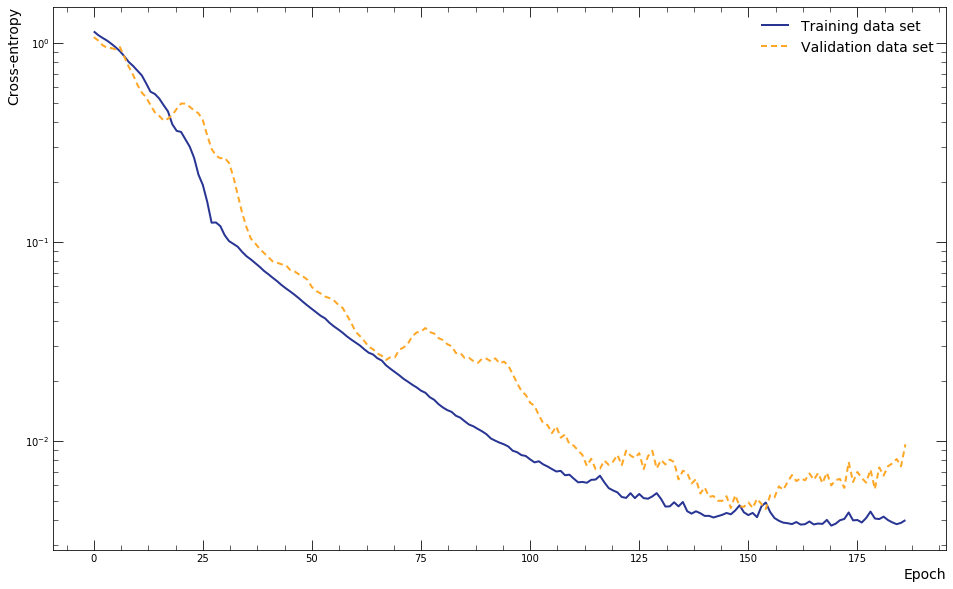

In [15]:
# Train neural networks
history = train_nn(model, x_train, x_train, 1024, "mse", model_name, x_val).history
plot_loss(history)

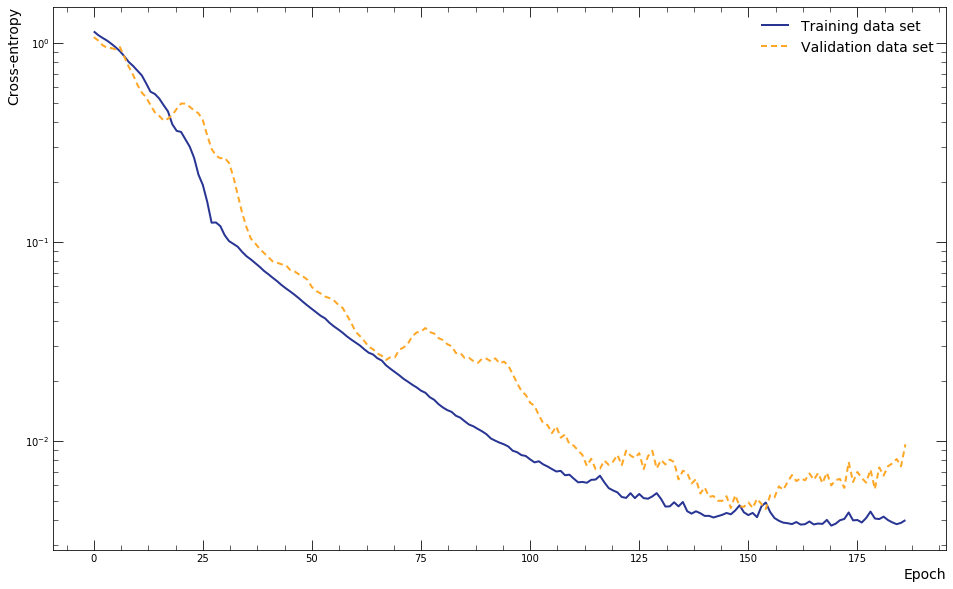

In [16]:
plot_loss(history)

In [17]:
for l in model.layers:
    print(l.name)
    print(l.get_weights())

input
[]
middle
[array([[-0.23288397, -0.04448497, -0.2707286 , -0.12113576, -0.01365684],
       [-0.3352282 , -0.08756319,  0.13384548,  0.03158211, -0.01658541],
       [-0.12894003,  0.4283733 , -0.40483394,  0.08617461, -0.06453048],
       [-0.02916178, -0.29897162,  0.19509067, -0.12899993, -0.05213949],
       [ 0.16737698,  0.01365776, -0.17059287, -0.29056266,  0.04560051],
       [ 0.13487032, -0.15184544,  0.06821589, -0.01805933,  0.43164784]],
      dtype=float32), array([-0.03252759, -0.06520457, -0.04175593,  0.        ,  0.00938349],
      dtype=float32)]
batch_normalization_5
[array([0.9744458 , 0.9409805 , 0.9540631 , 1.        , 0.98587275],
      dtype=float32), array([ 0.02760078, -0.12156107,  0.1058574 ,  0.02298268, -0.17082882],
      dtype=float32), array([7.7282003e-08, 6.3972402e-05, 1.4257321e-06, 0.0000000e+00,
       2.2020692e-01], dtype=float32), array([2.9637932e-09, 2.3485061e-06, 5.2979289e-08, 0.0000000e+00,
       1.0739579e-02], dtype=float32)]
e

## Training Set

<h1>304144</h1>

<h2>Displaying Inputs</h2>

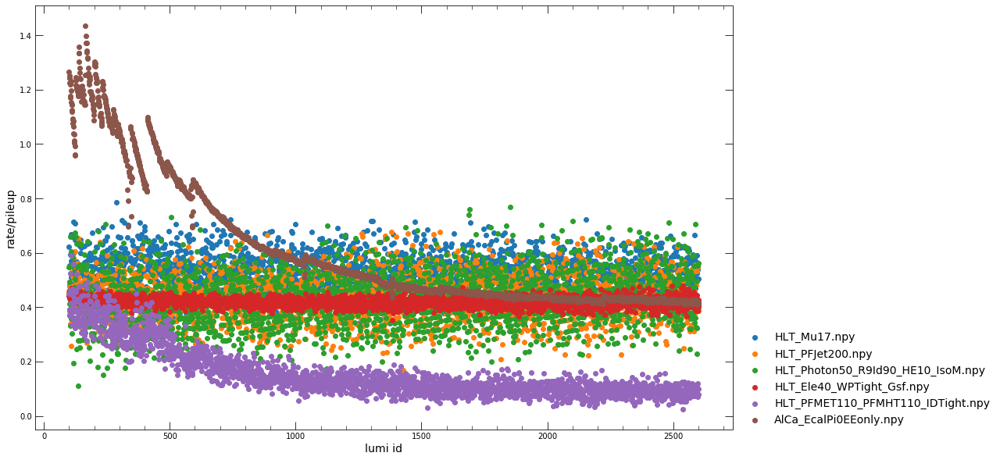

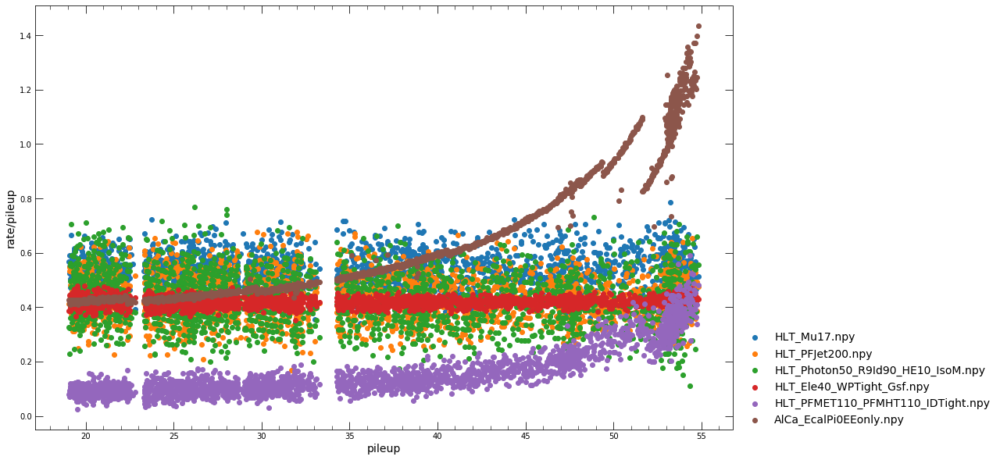

<h2>Plotting Errors</h2>

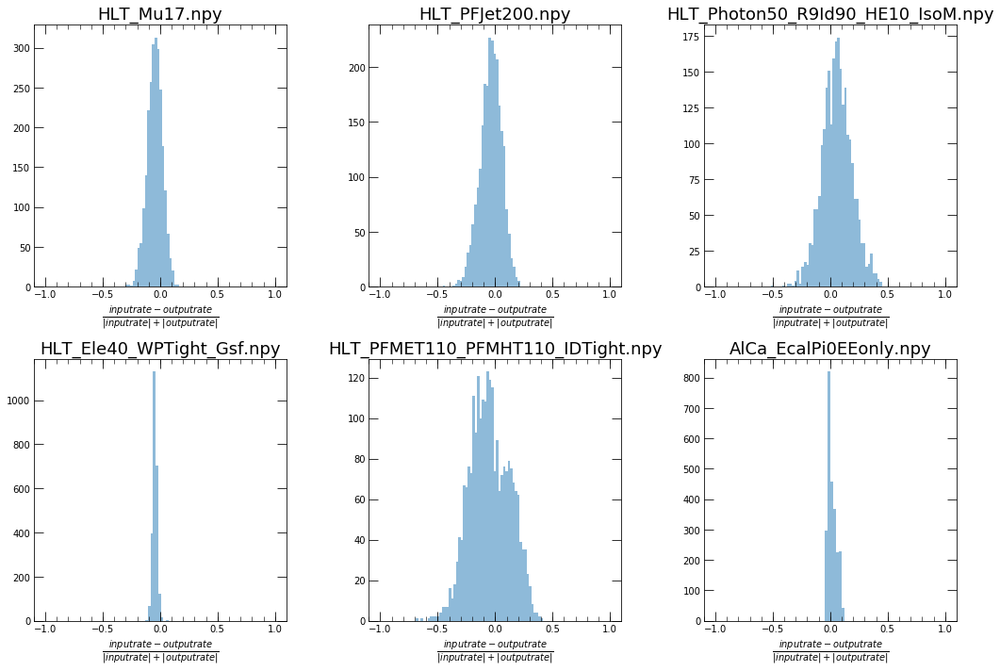

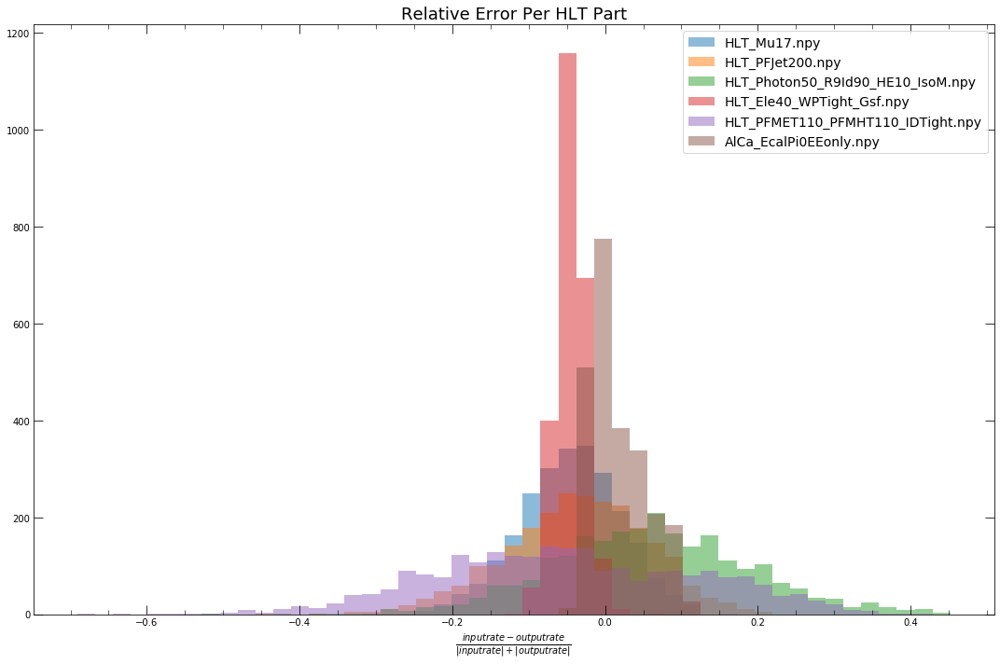

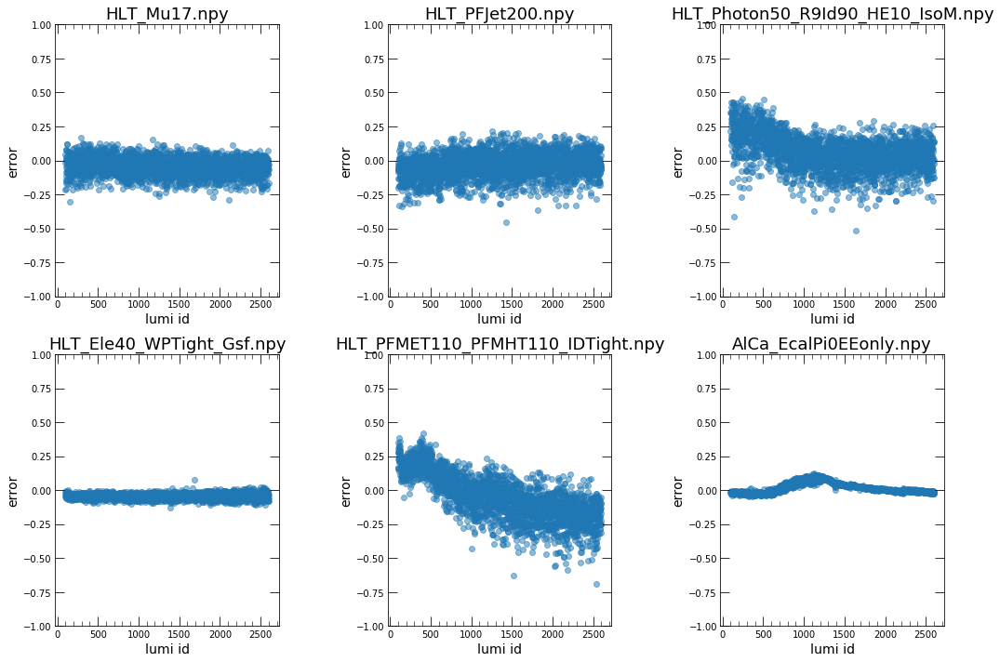

<h2>Plotting Inputs vs Outputs</h2>

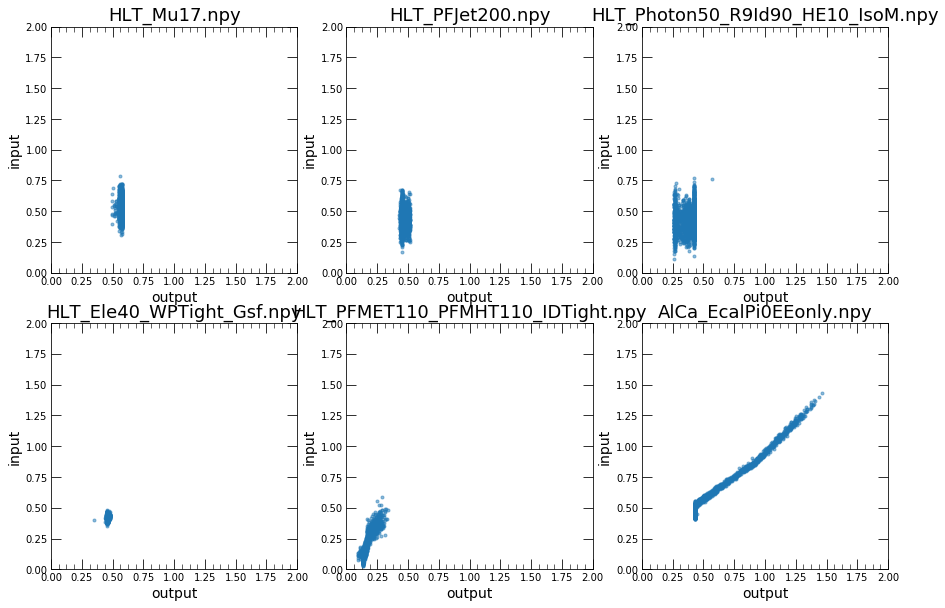

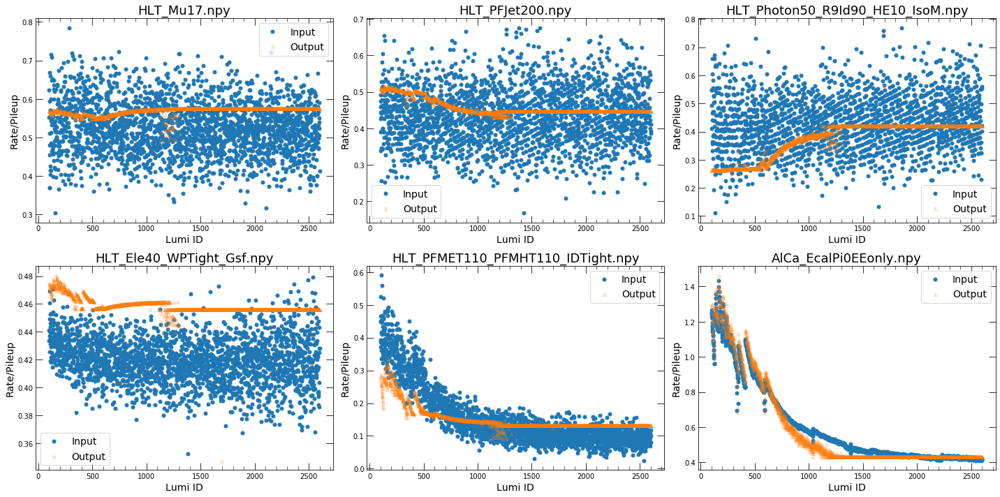

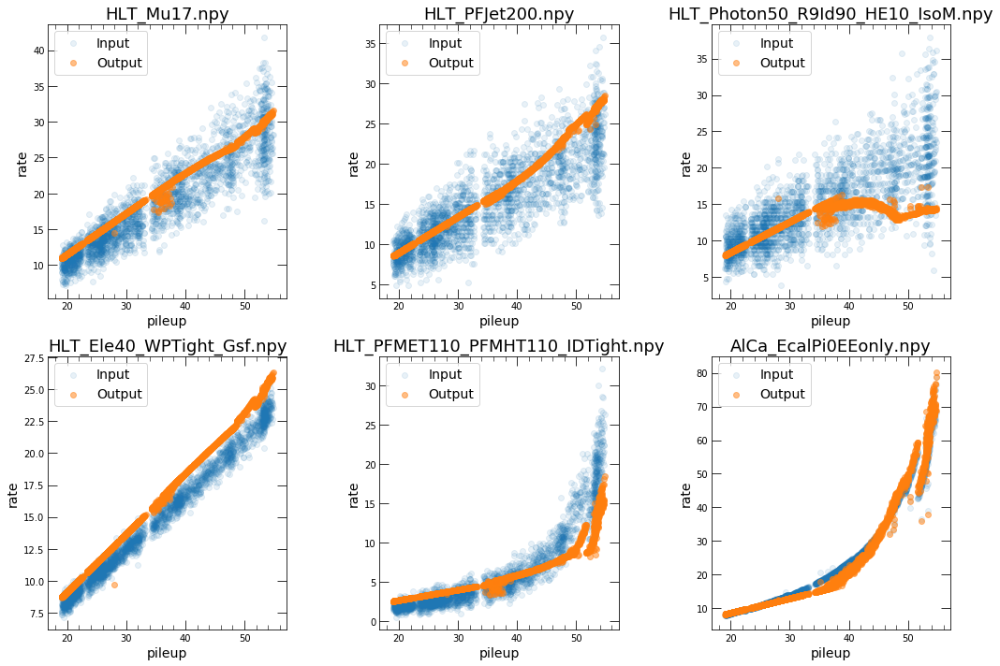

In [25]:
analyze_run(model_name,runs_by_era[m][n])

<h1>304125</h1>

<h2>Displaying Inputs</h2>

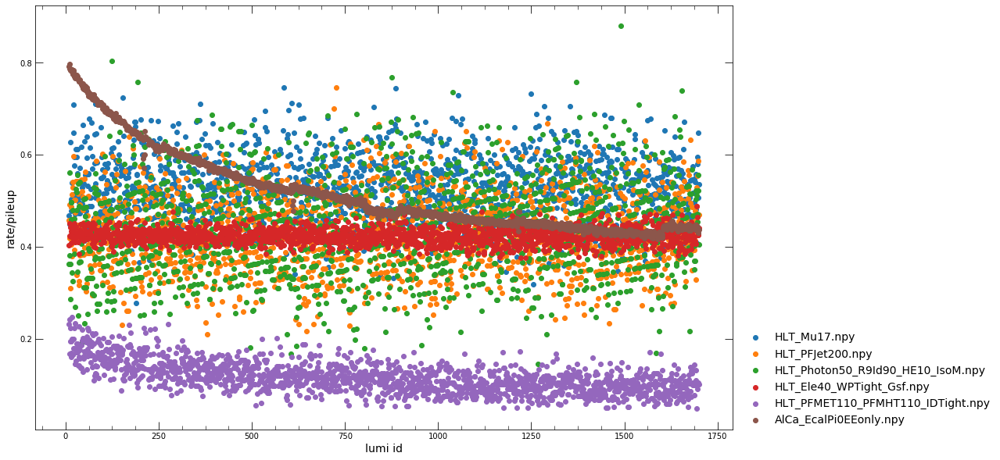

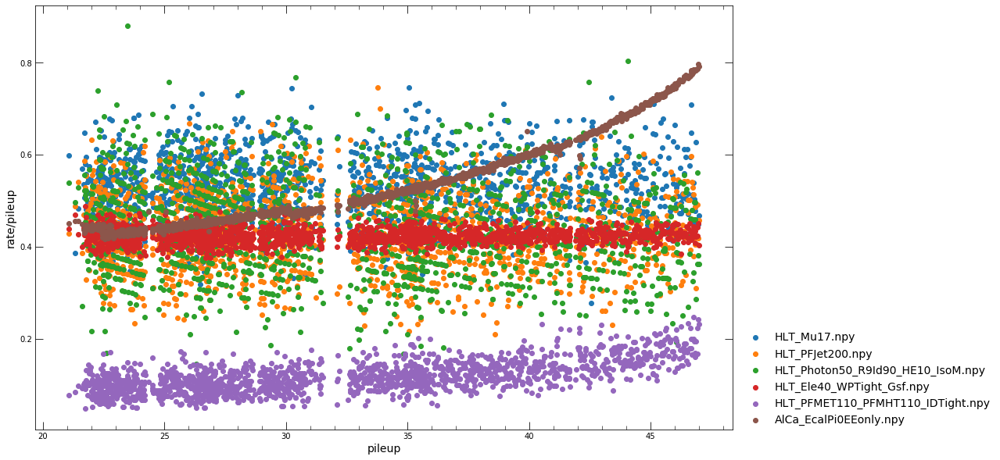

<h2>Plotting Errors</h2>

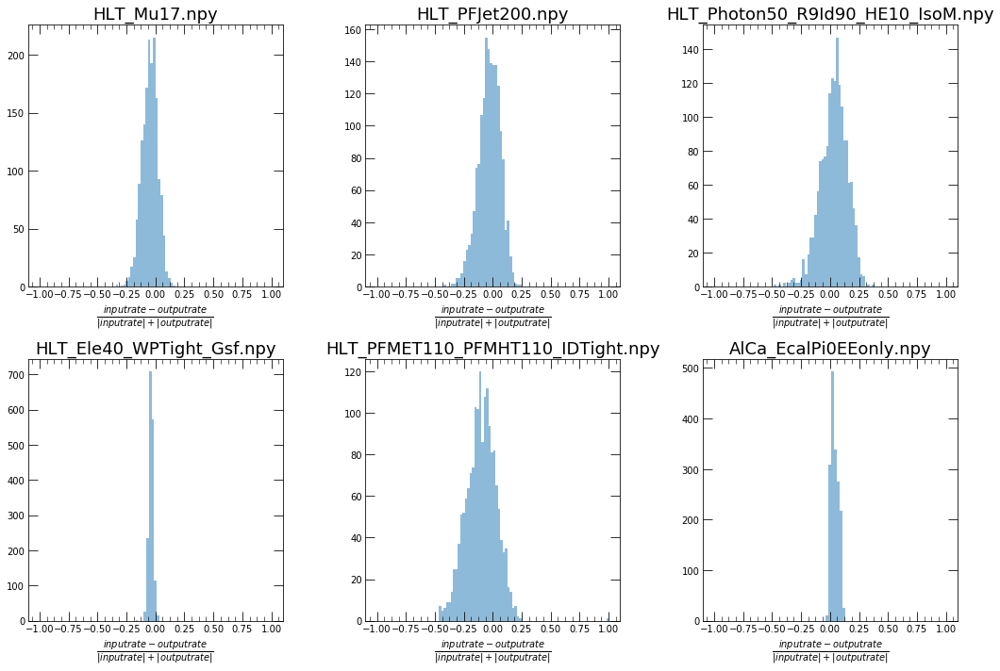

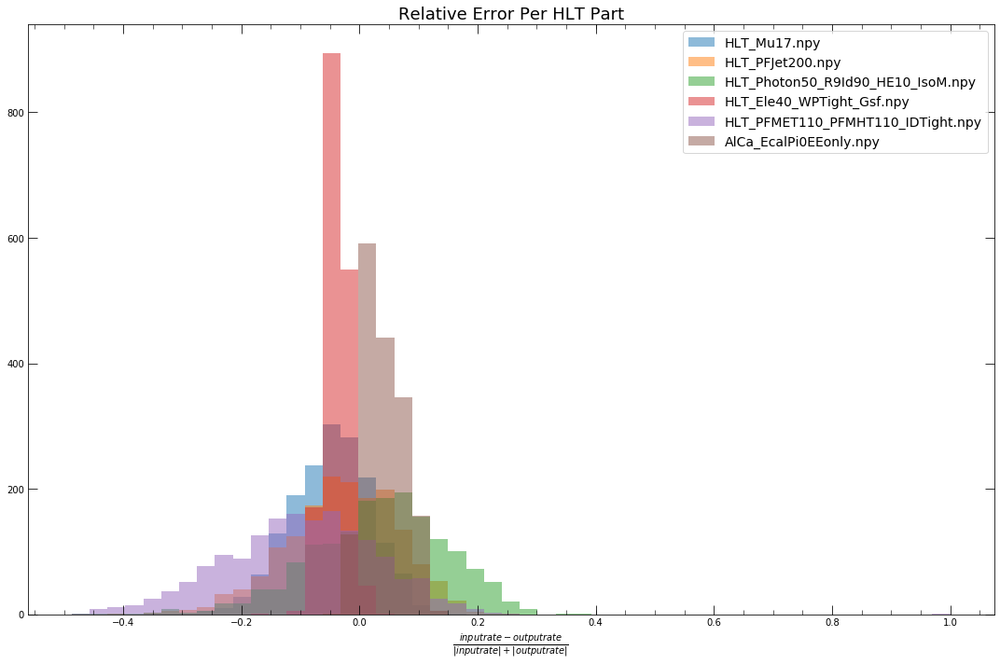

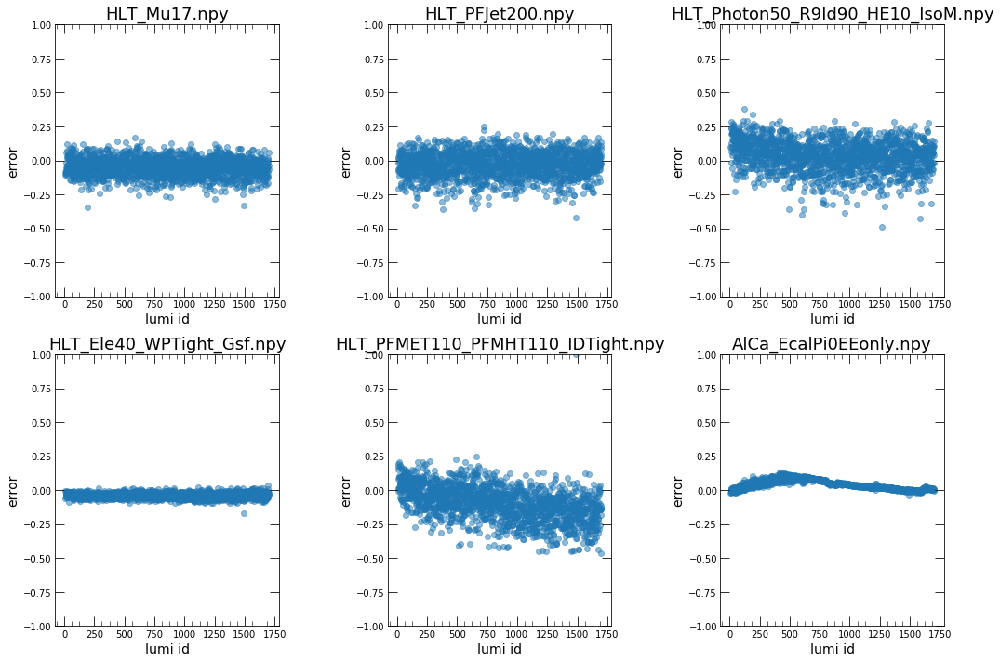

<h2>Plotting Inputs vs Outputs</h2>

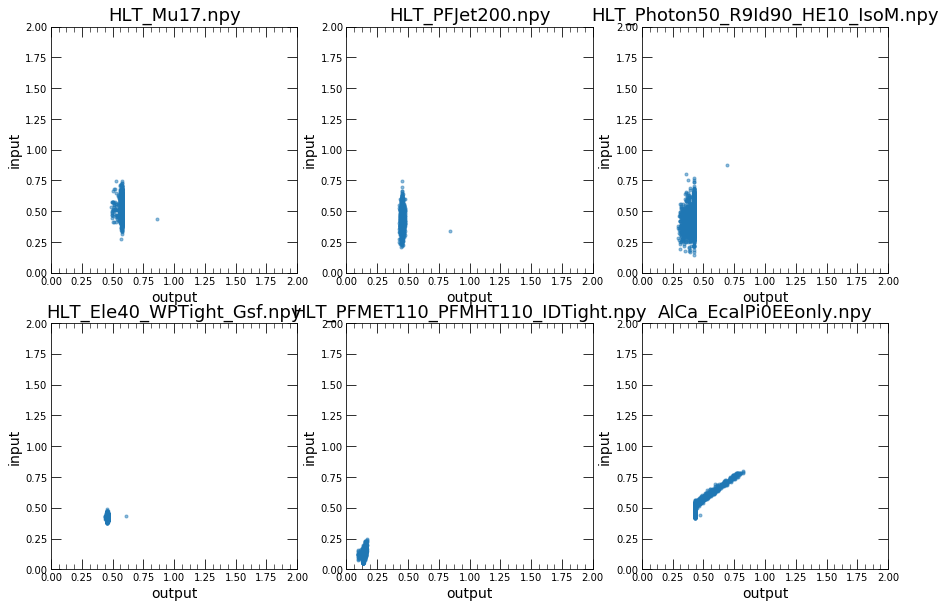

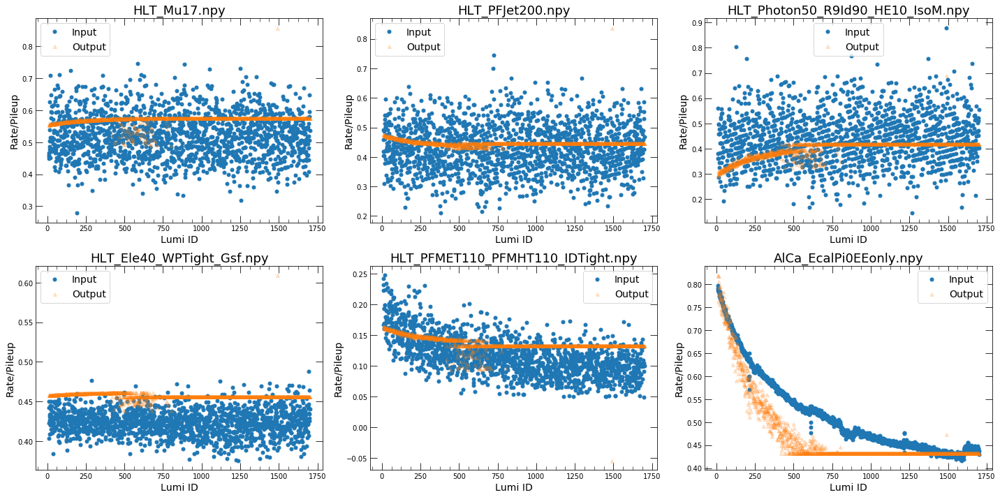

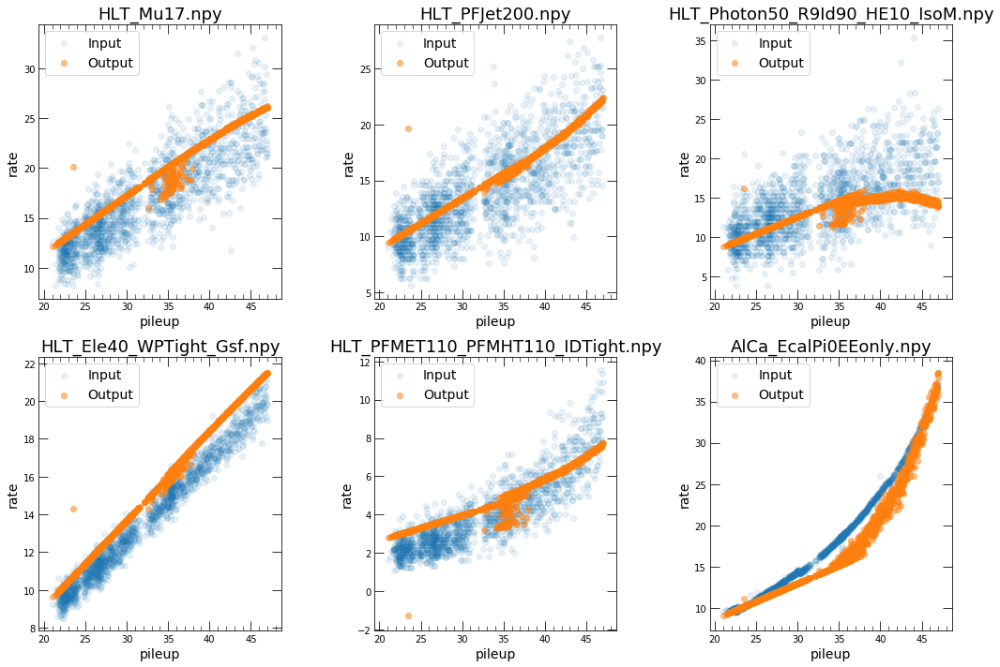

In [26]:
analyze_run(model_name,"304125")

<h1>302634</h1>

<h2>Displaying Inputs</h2>

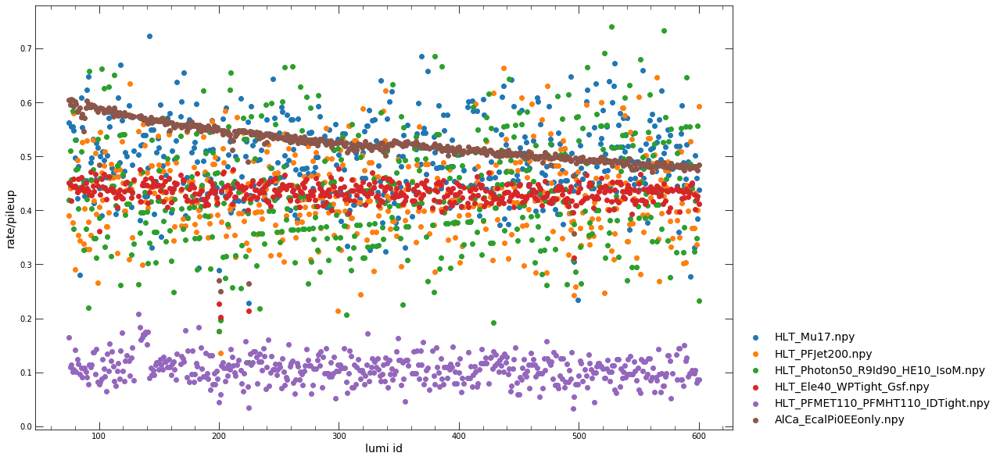

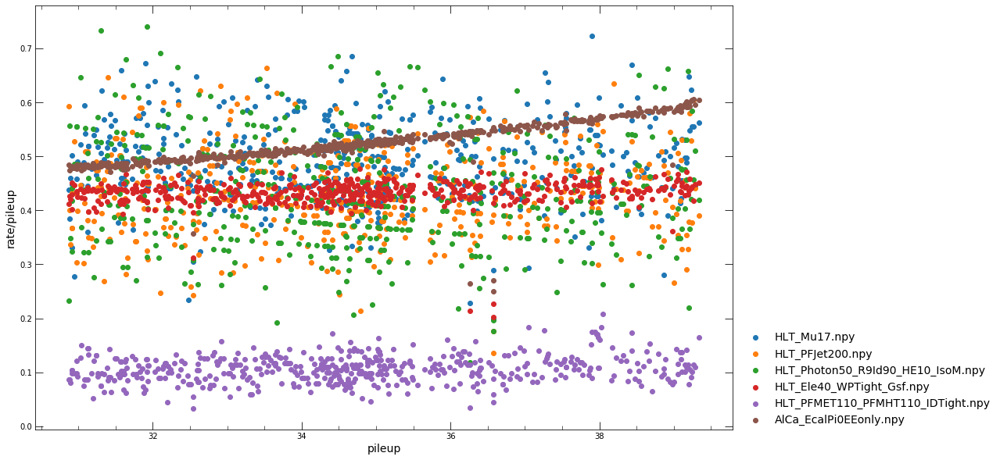

<h2>Plotting Errors</h2>

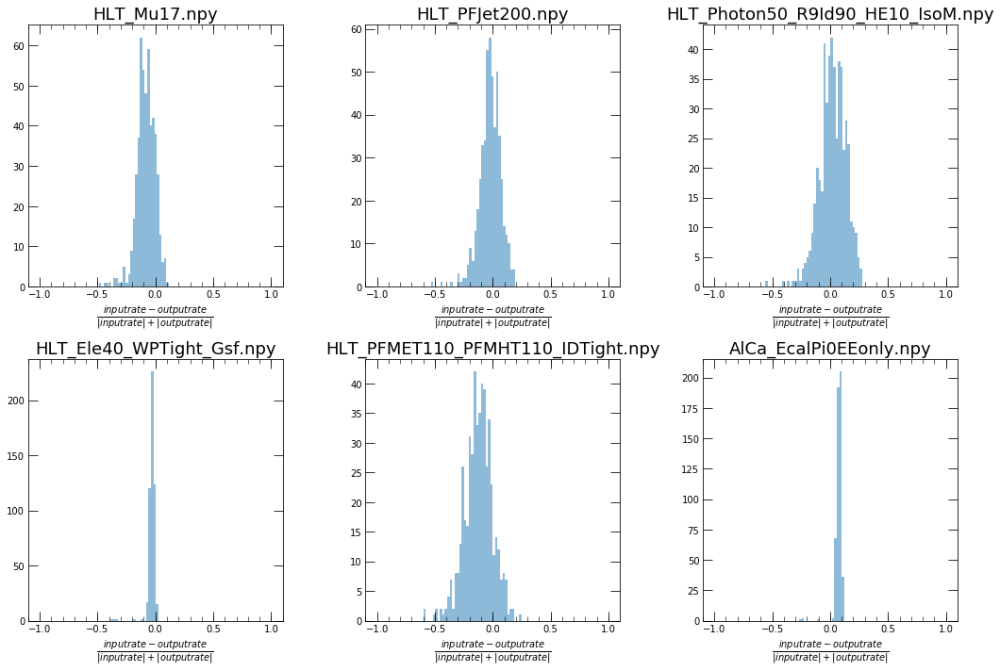

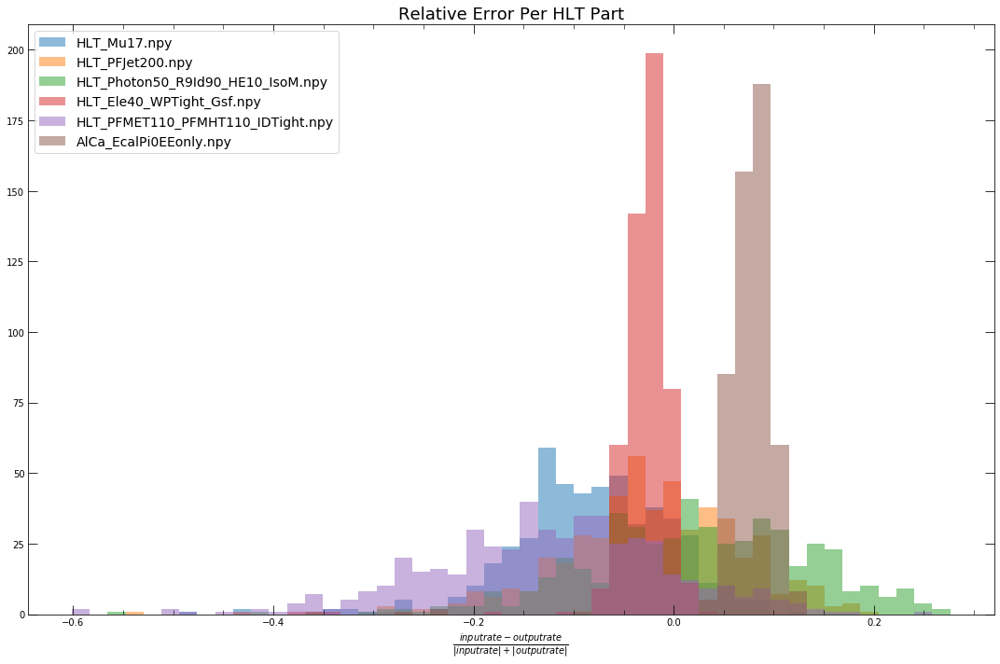

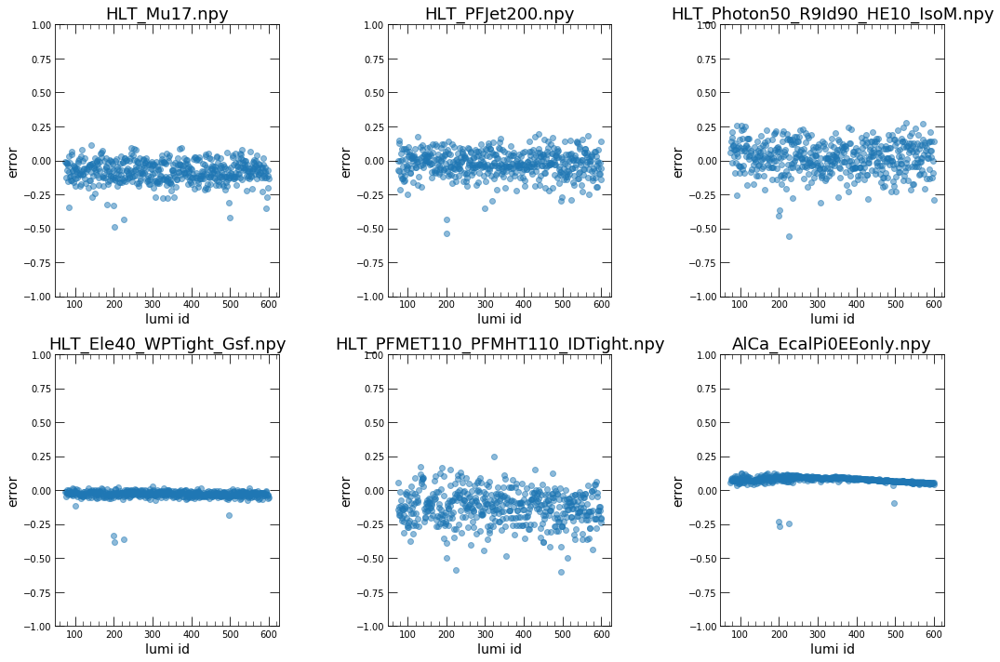

<h2>Plotting Inputs vs Outputs</h2>

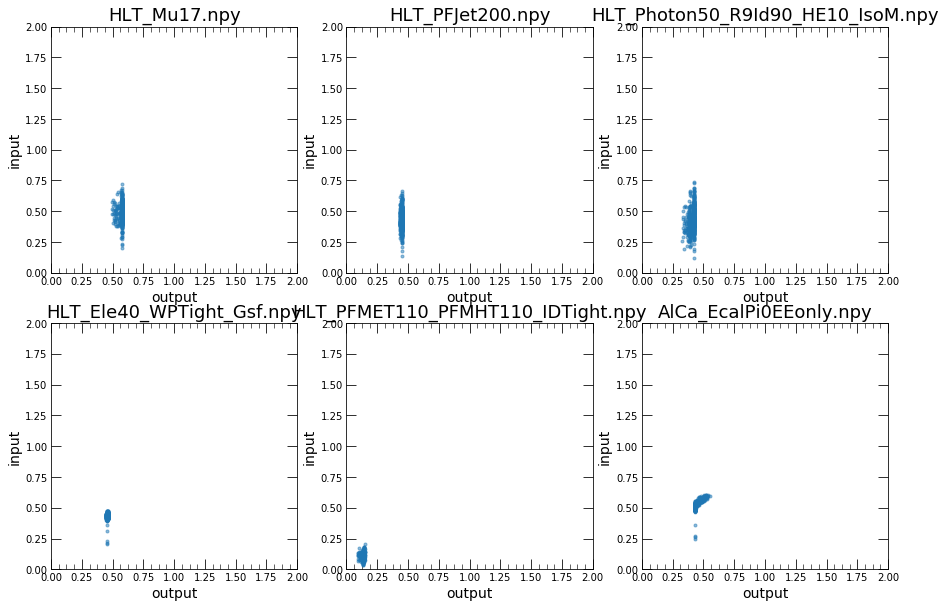

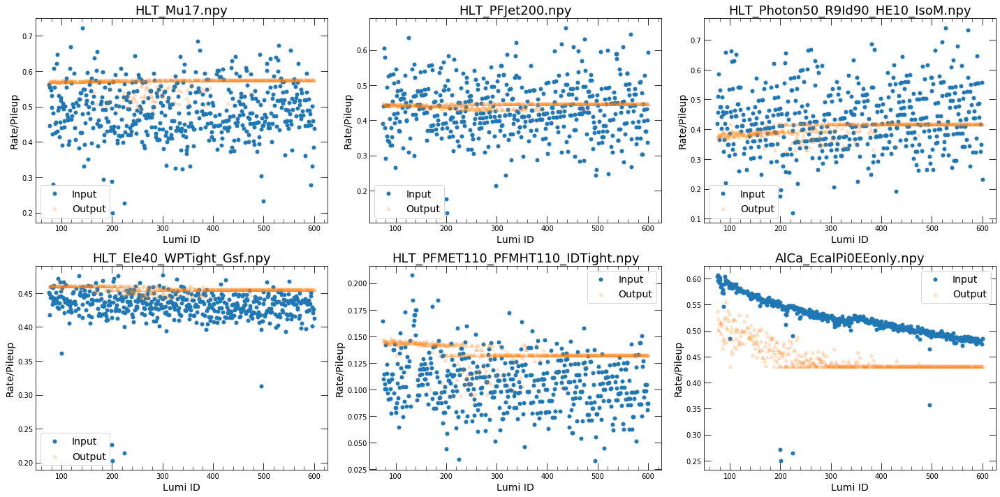

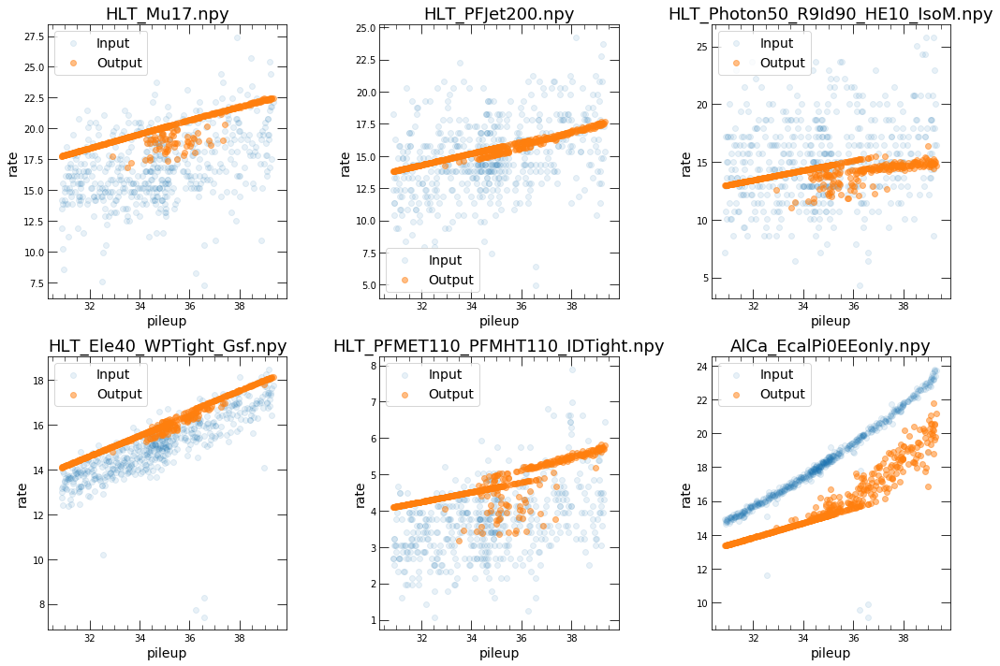

<h1>302635</h1>

<h2>Displaying Inputs</h2>

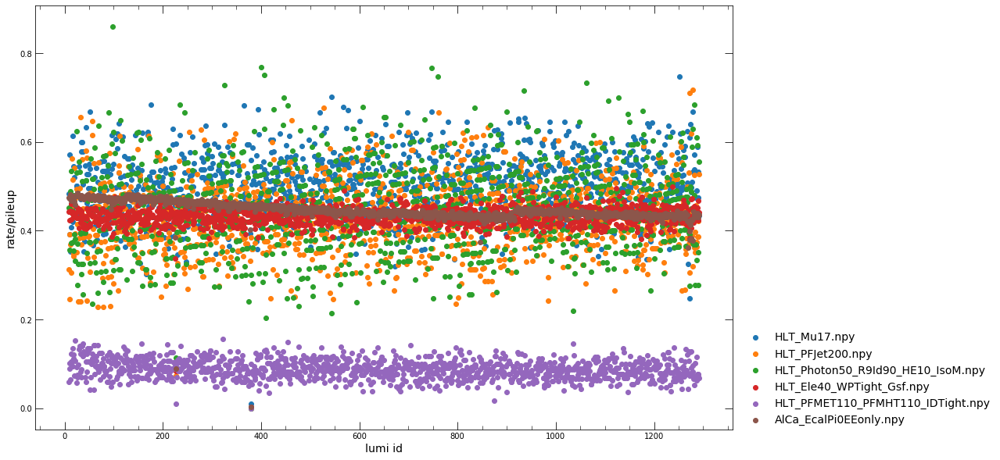

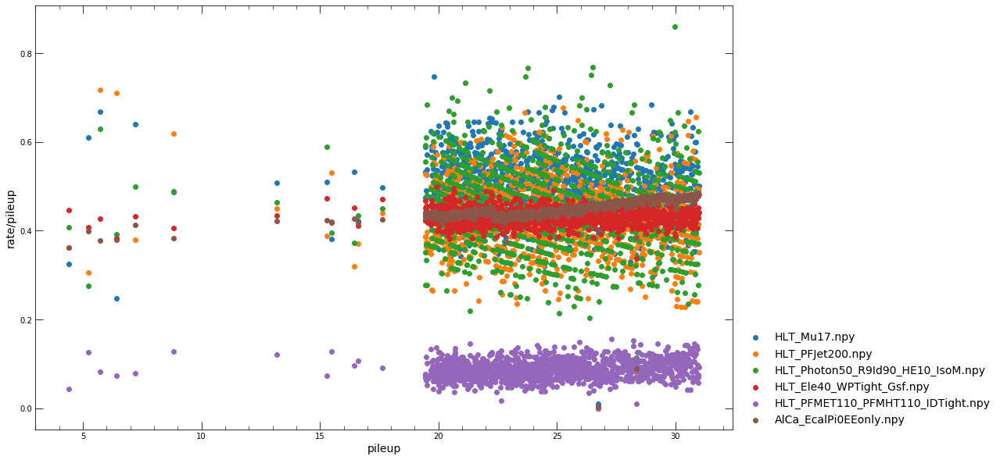

<h2>Plotting Errors</h2>

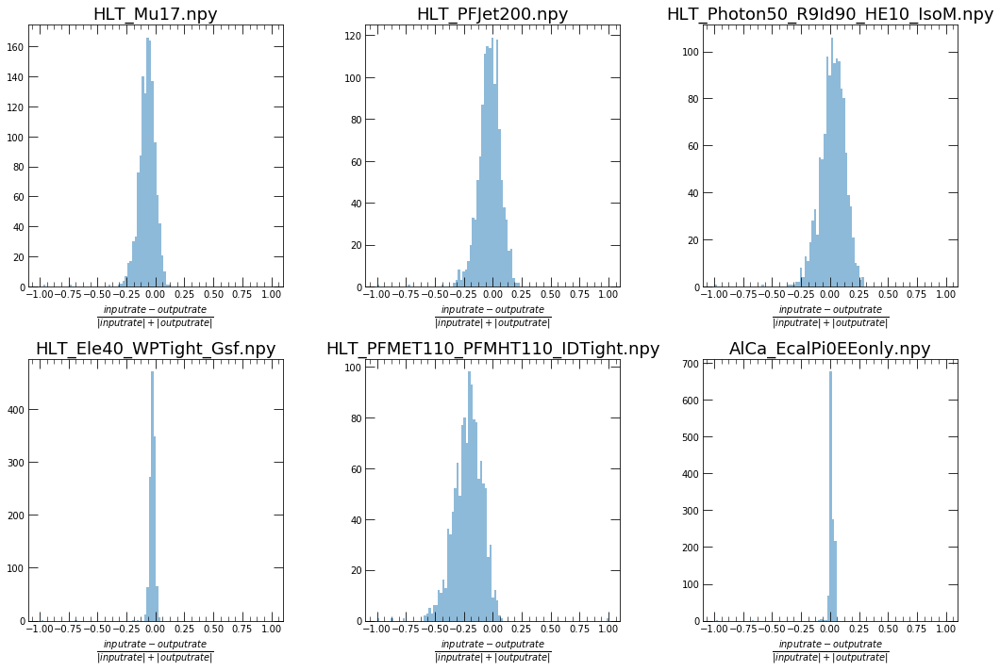

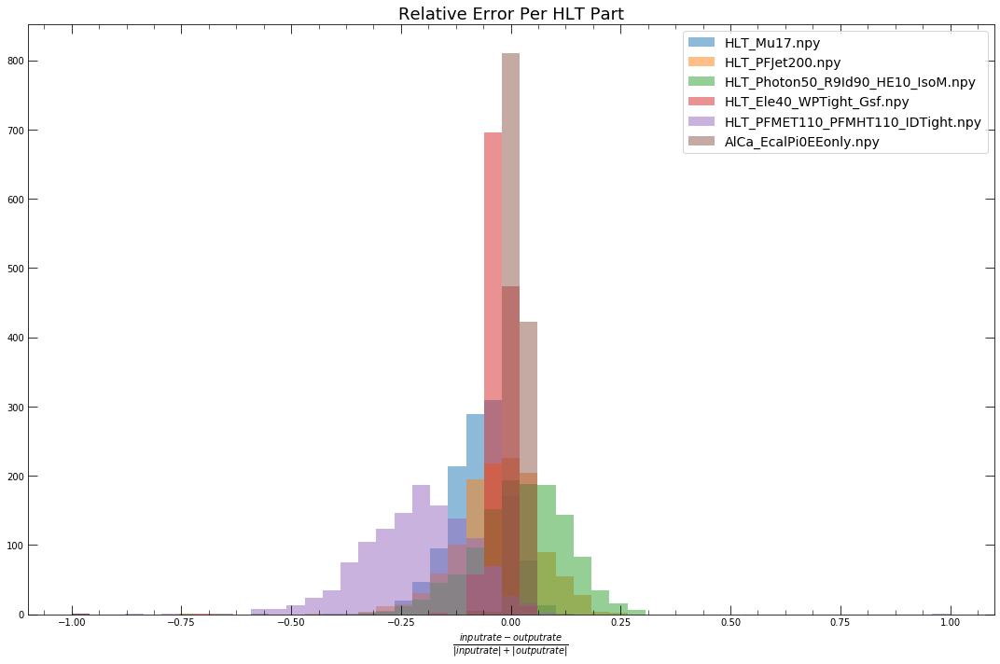

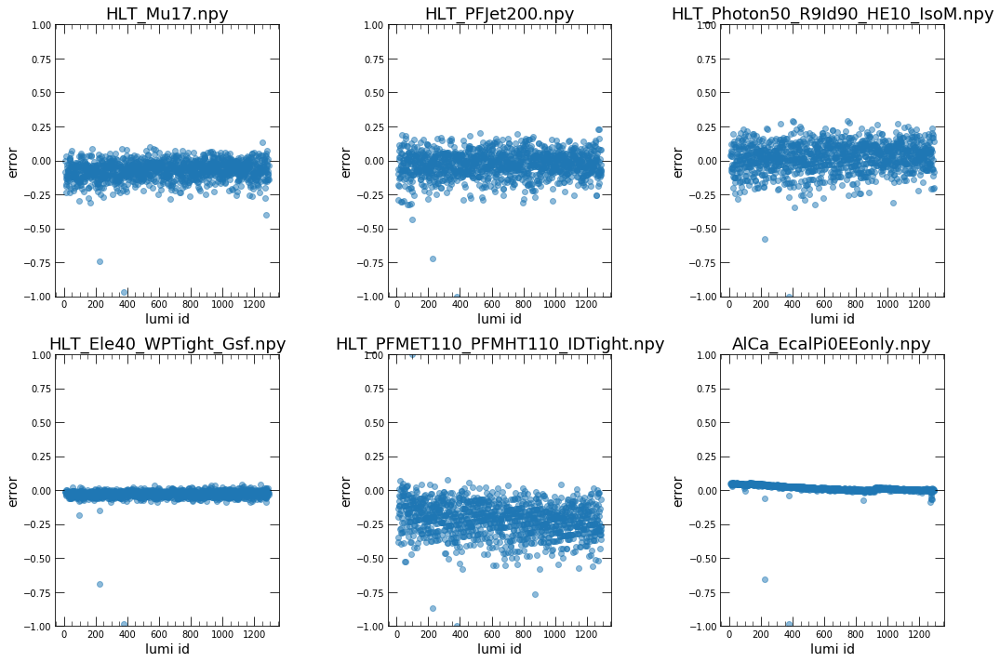

<h2>Plotting Inputs vs Outputs</h2>

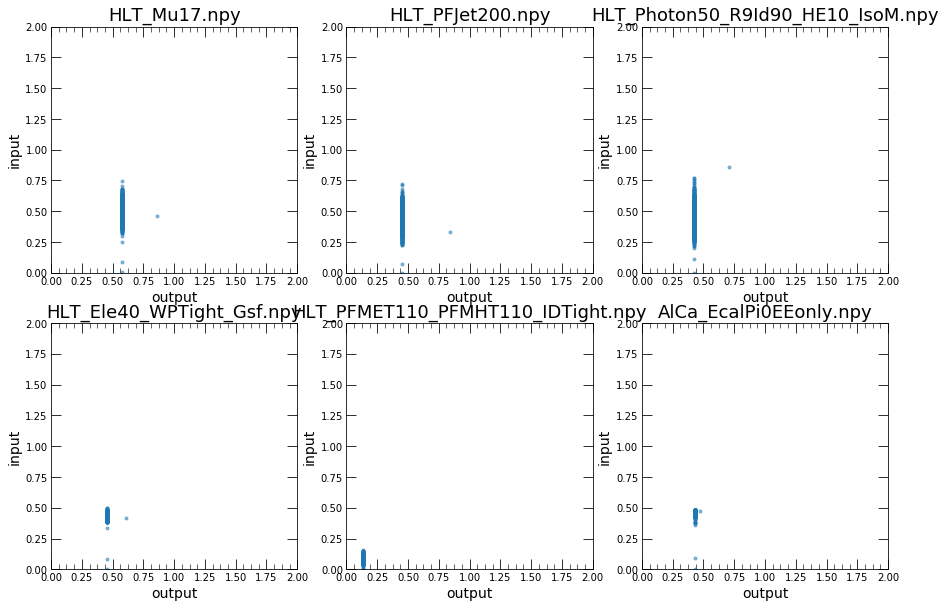

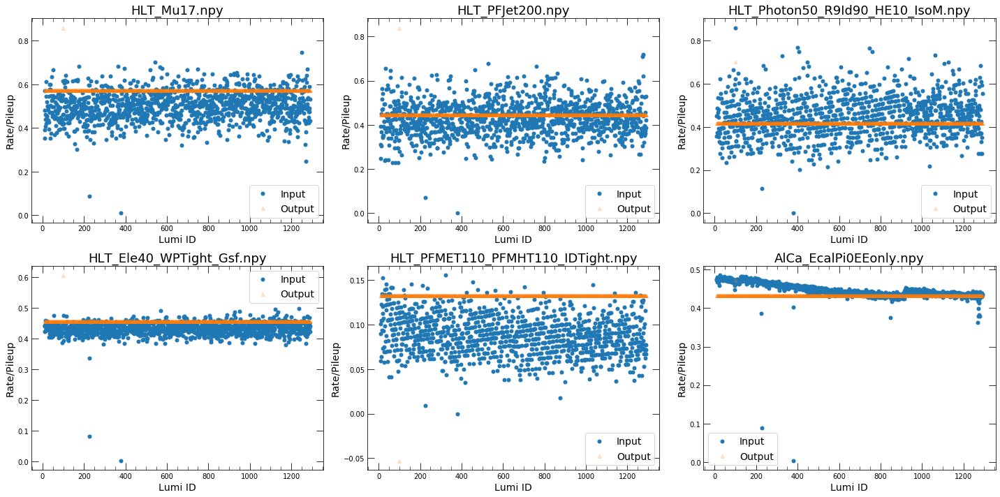

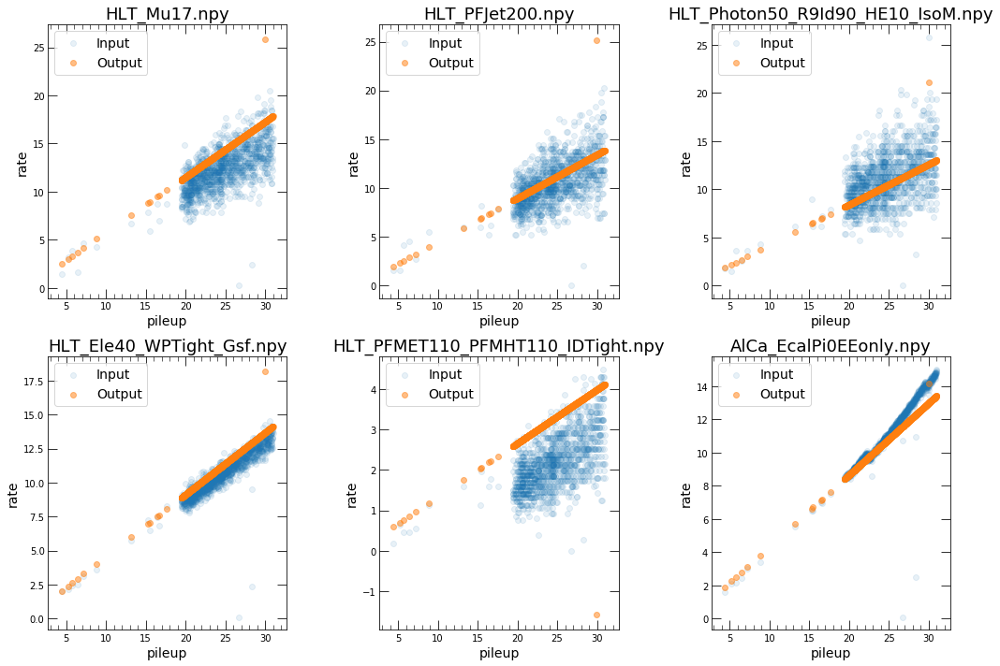

<h1>302651</h1>

<h2>Displaying Inputs</h2>

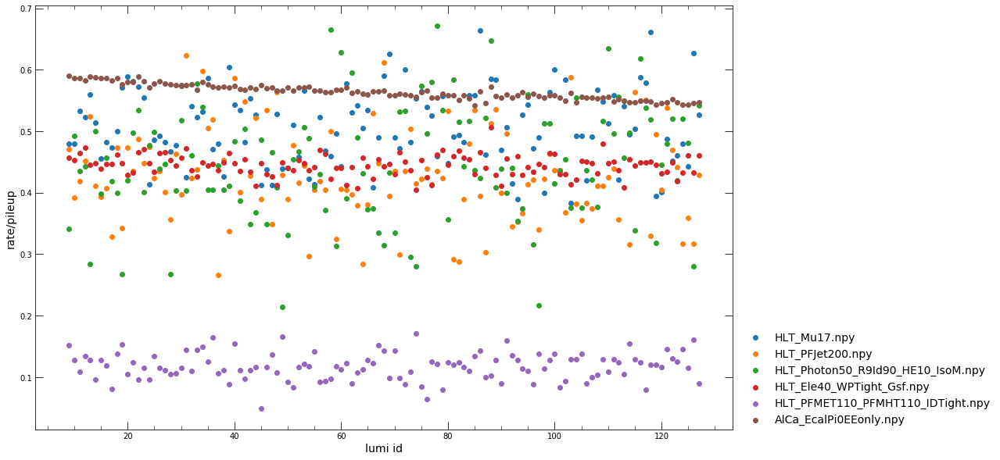

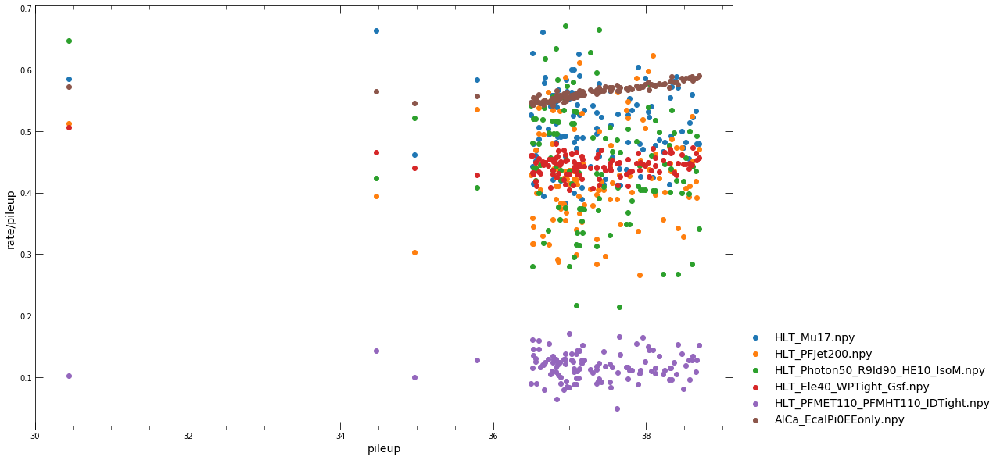

<h2>Plotting Errors</h2>

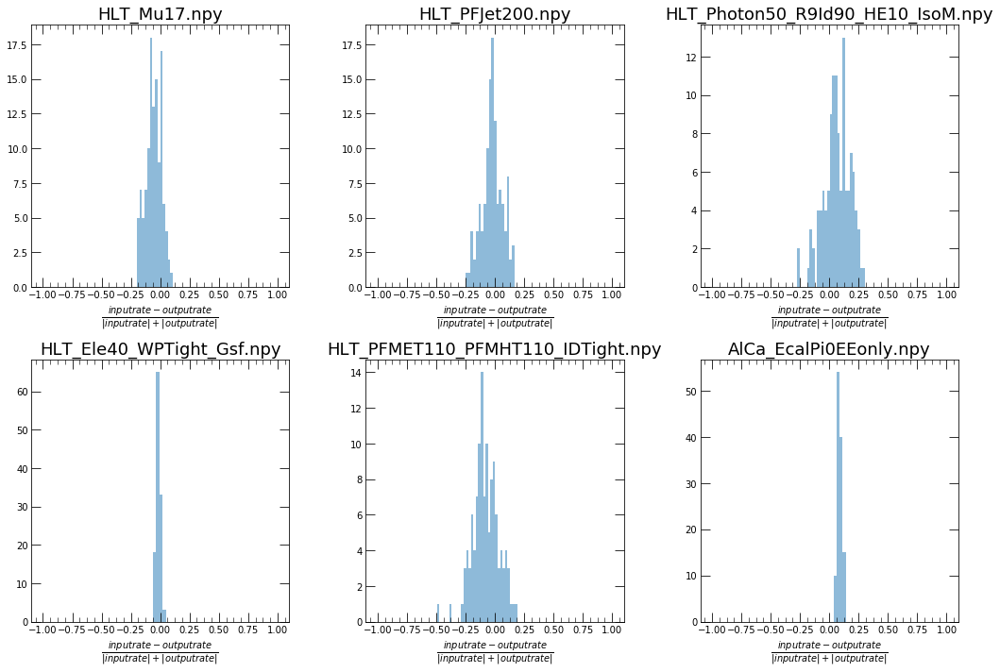

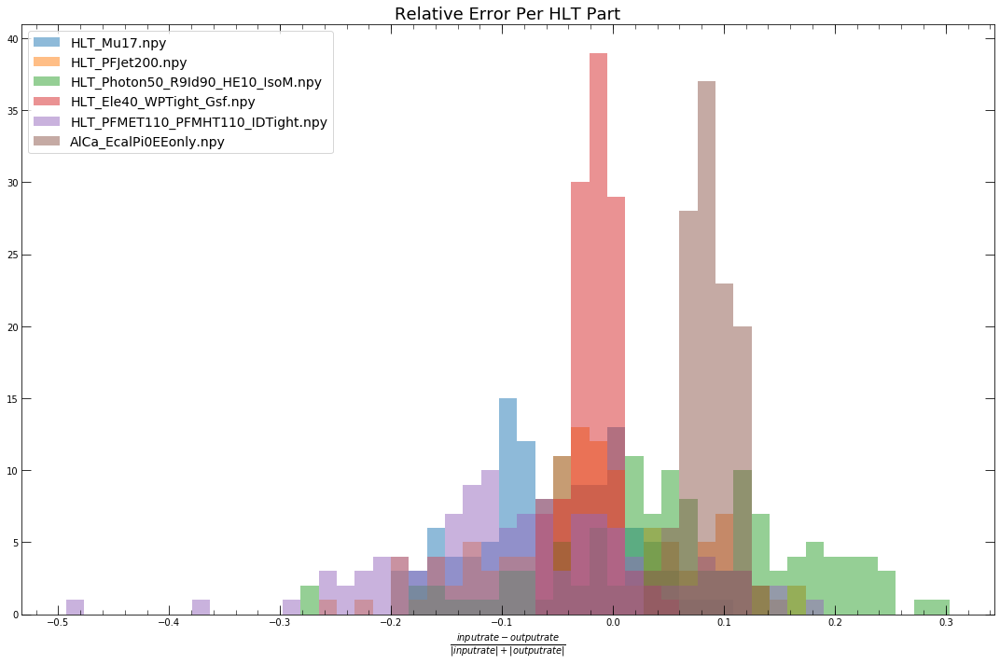

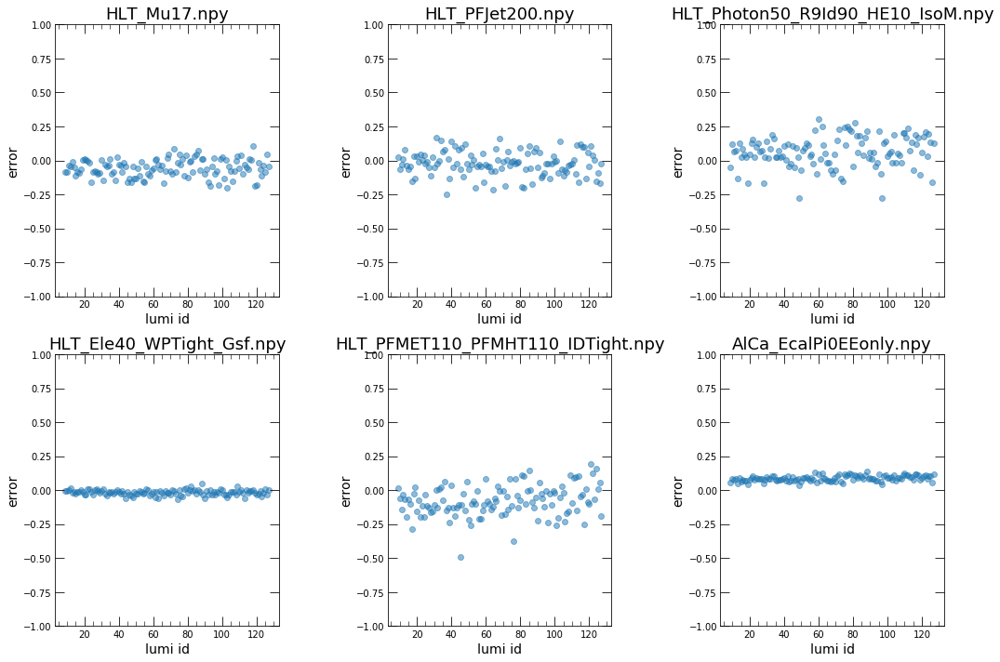

<h2>Plotting Inputs vs Outputs</h2>

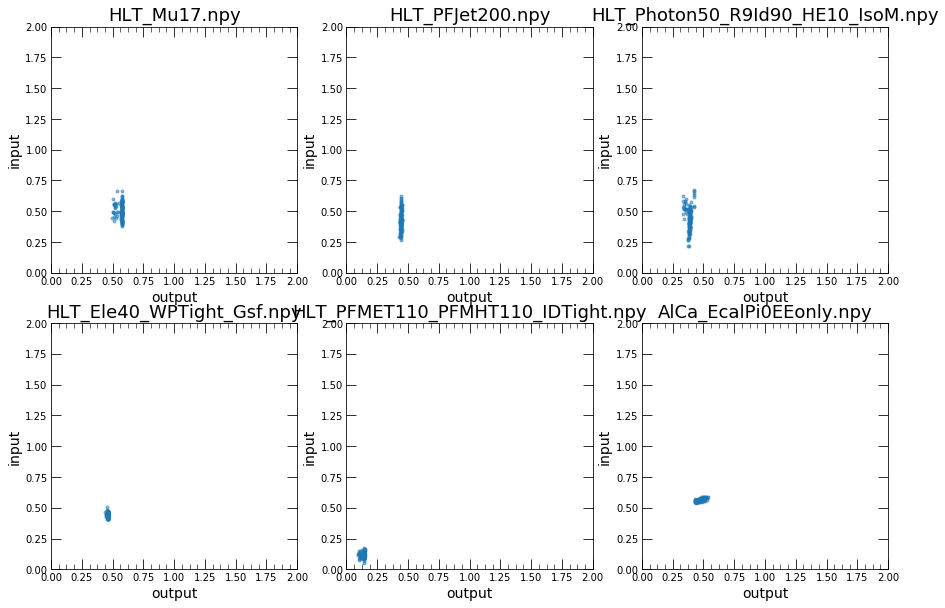

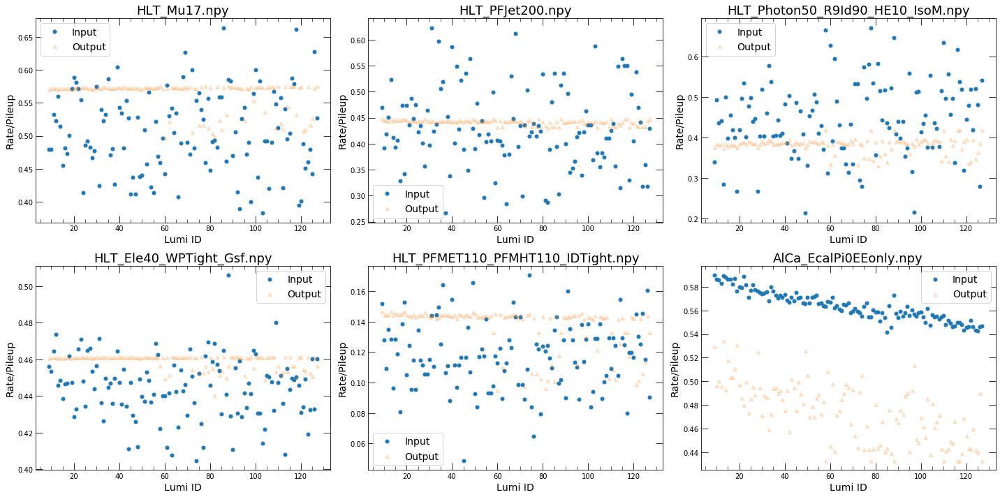

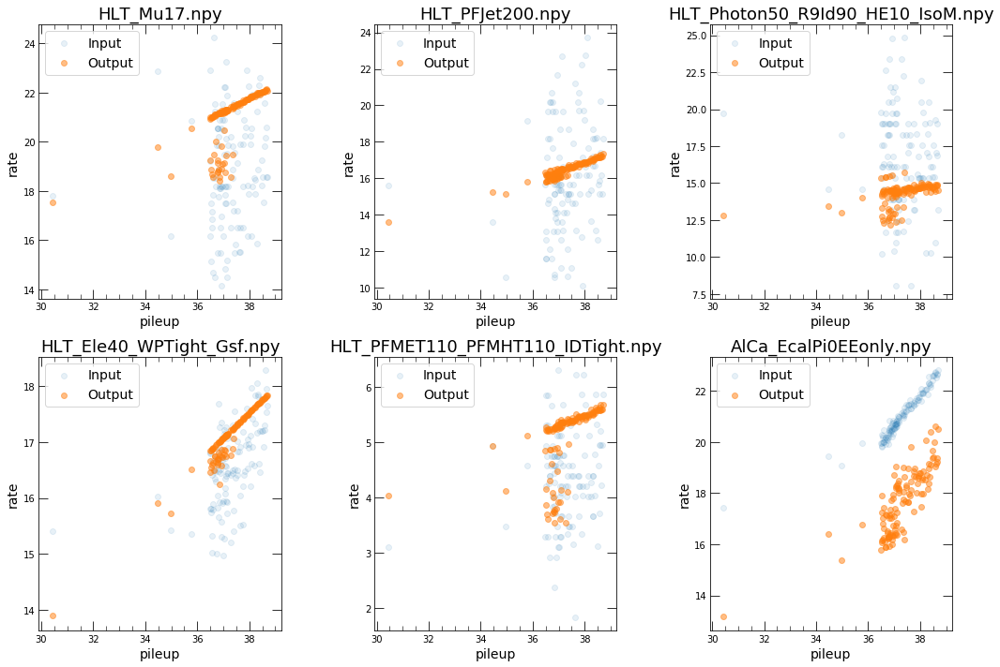

<h1>302654</h1>

<h2>Displaying Inputs</h2>

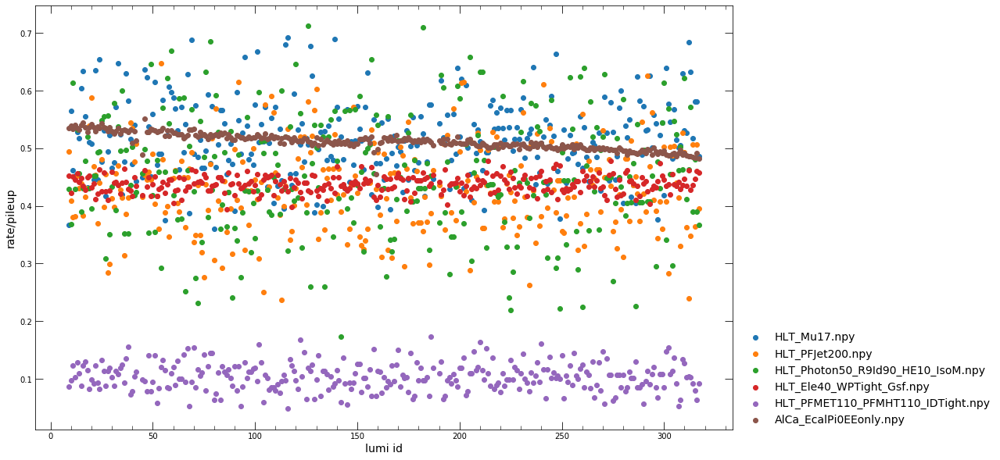

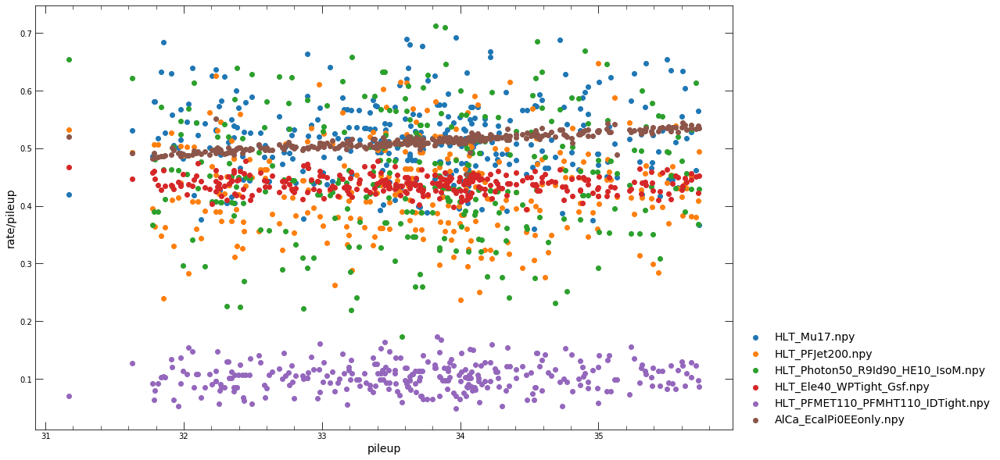

<h2>Plotting Errors</h2>

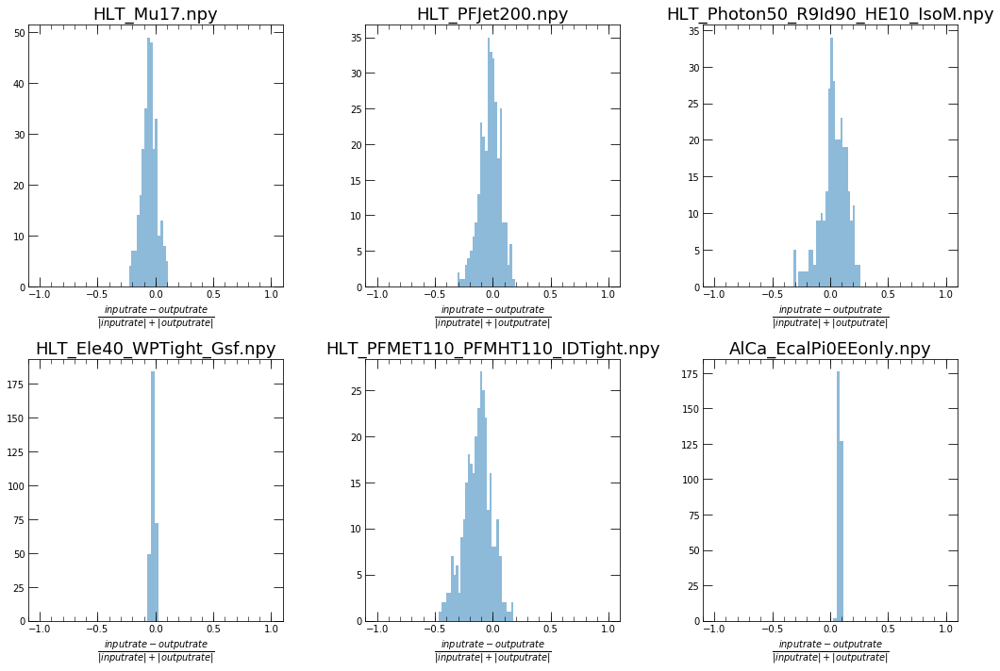

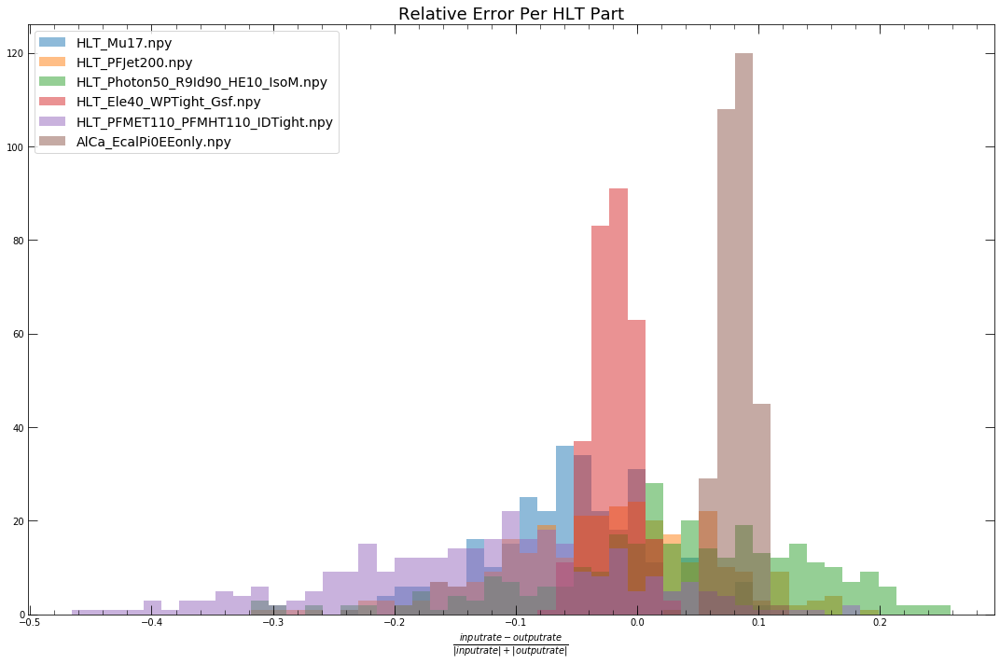

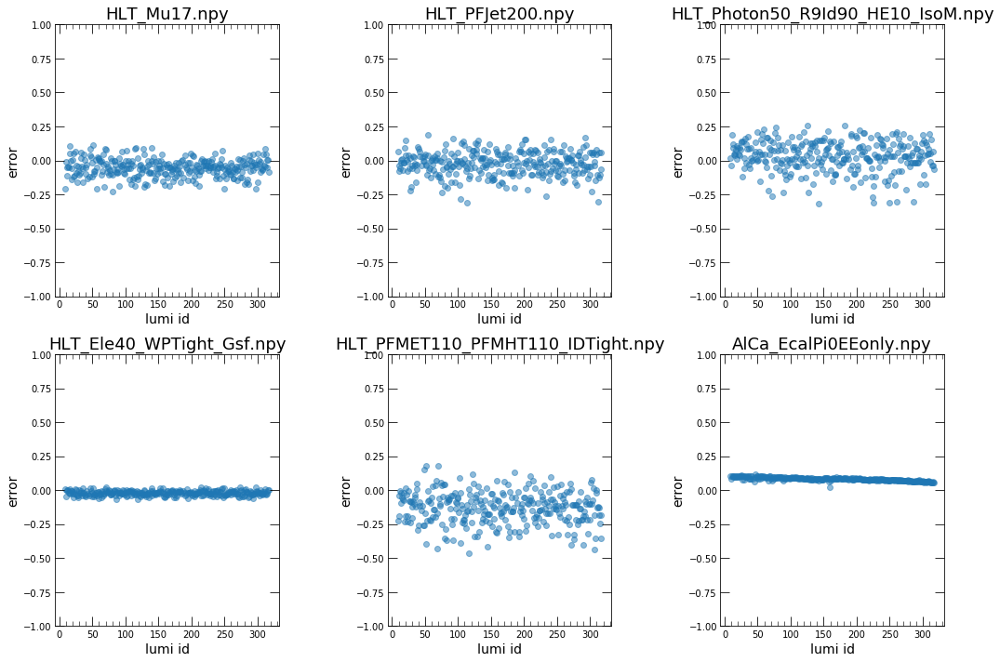

<h2>Plotting Inputs vs Outputs</h2>

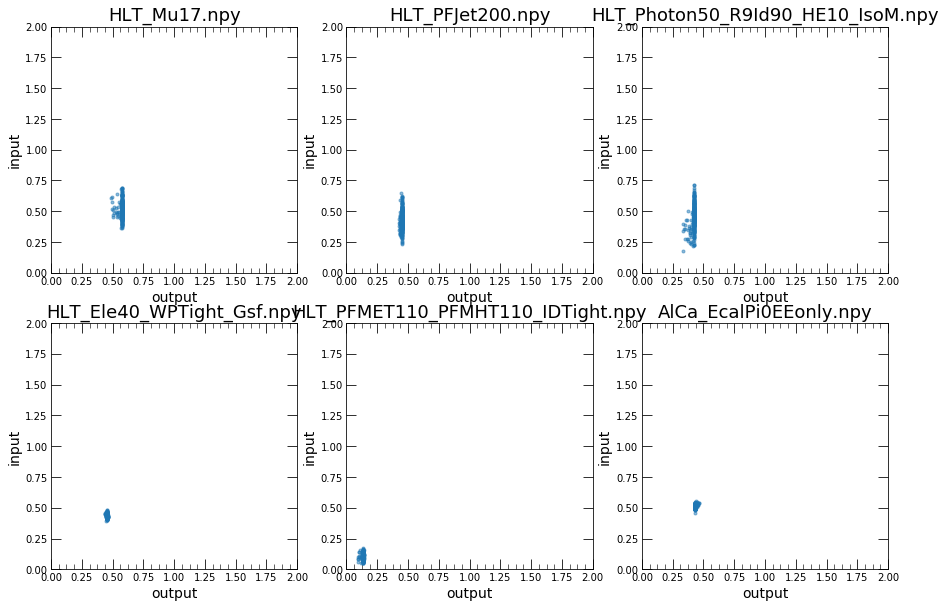

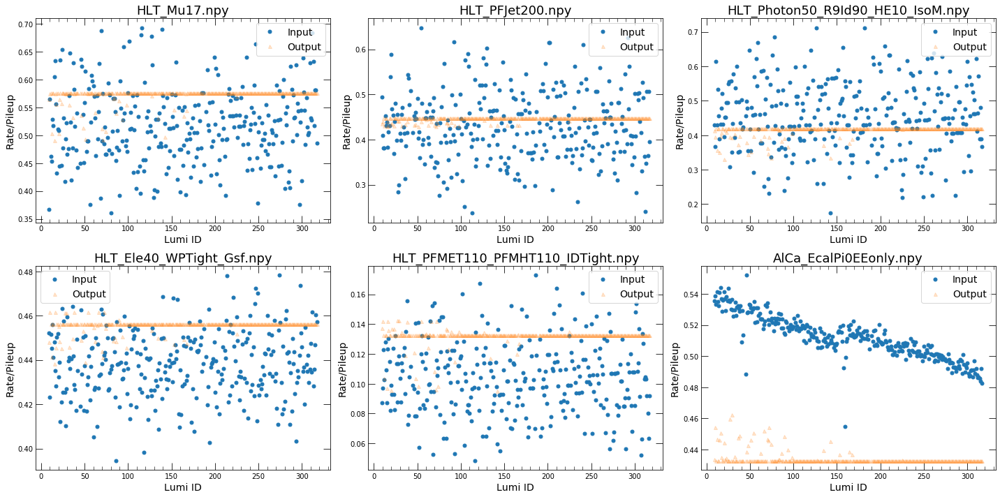

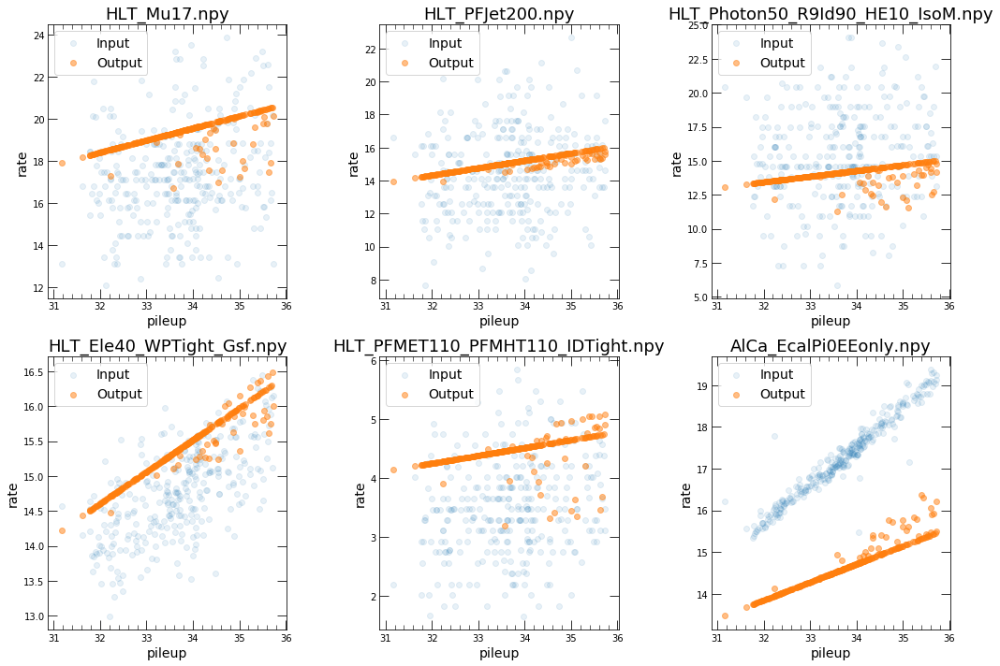

<h1>302661</h1>

<h2>Displaying Inputs</h2>

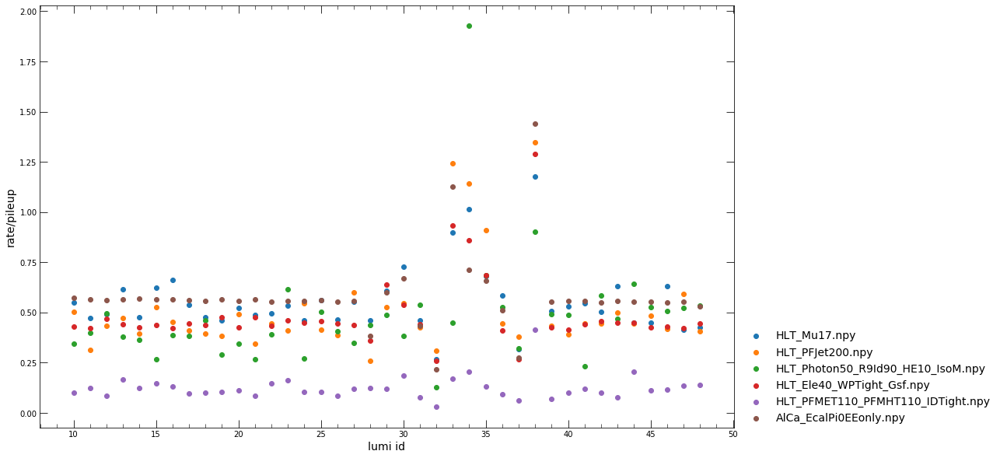

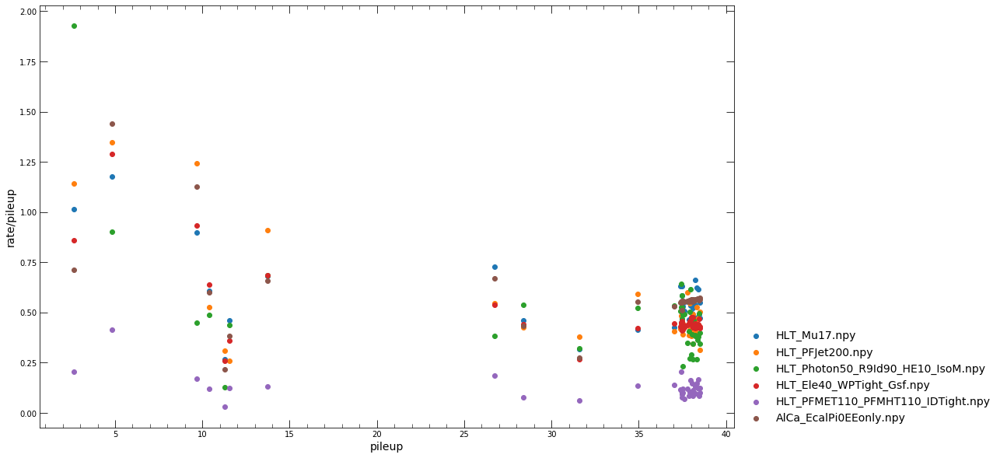

<h2>Plotting Errors</h2>

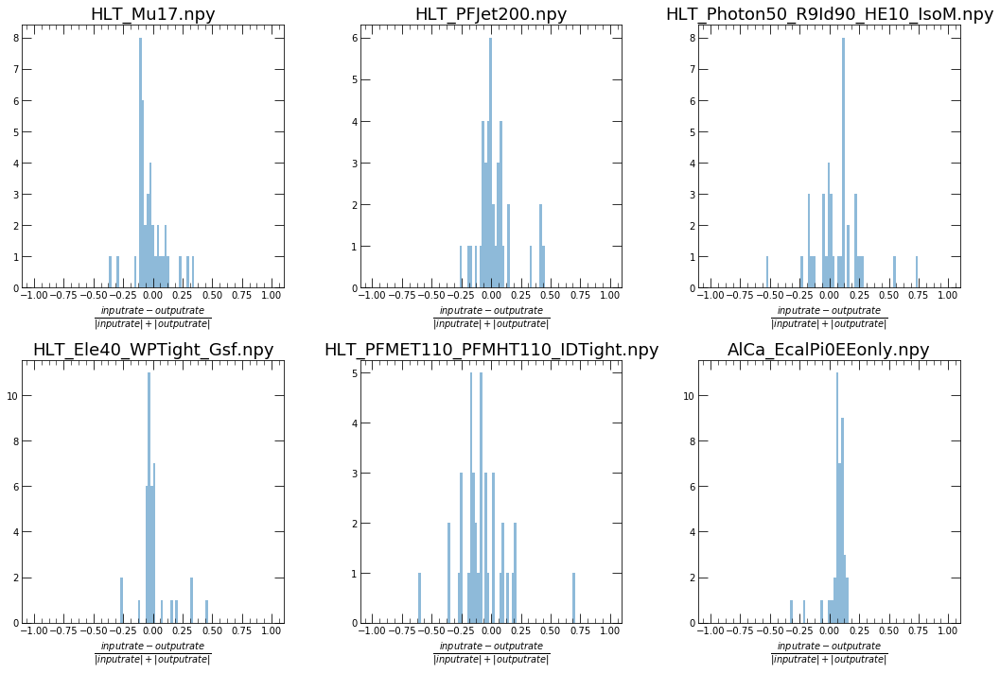

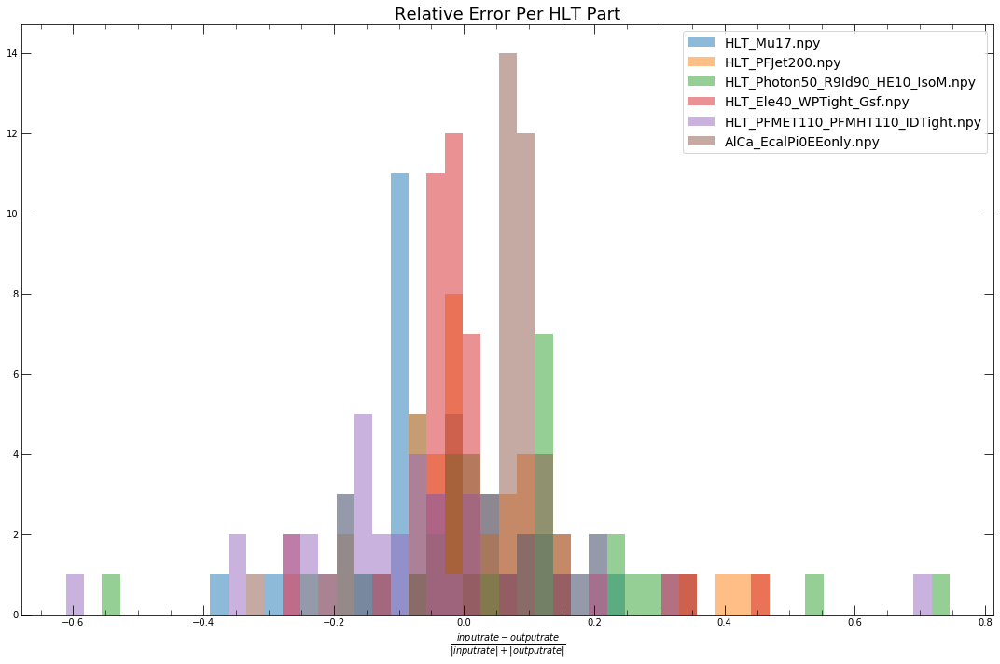

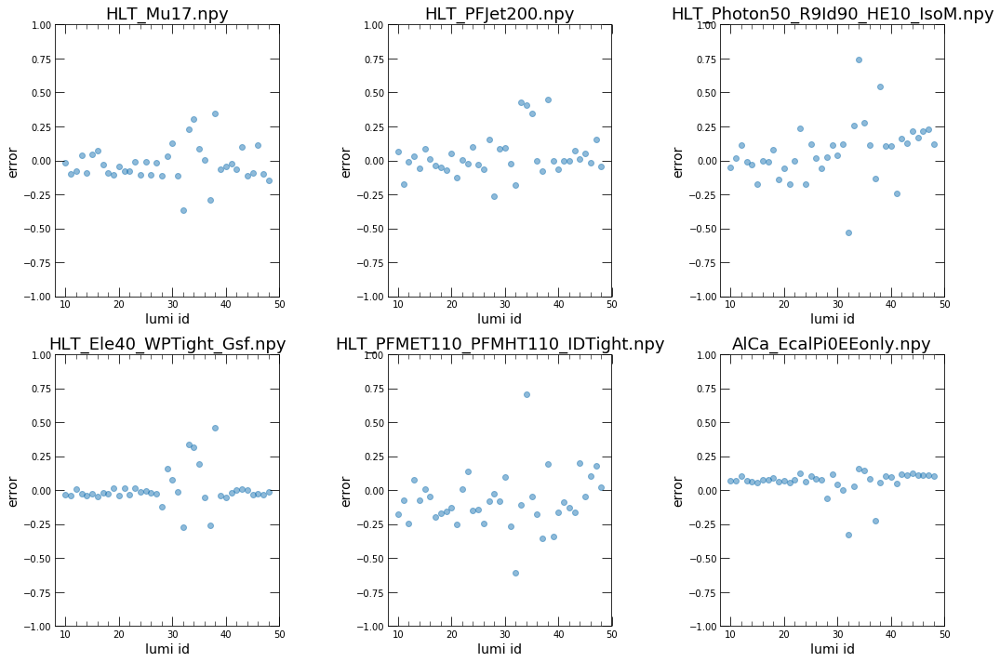

<h2>Plotting Inputs vs Outputs</h2>

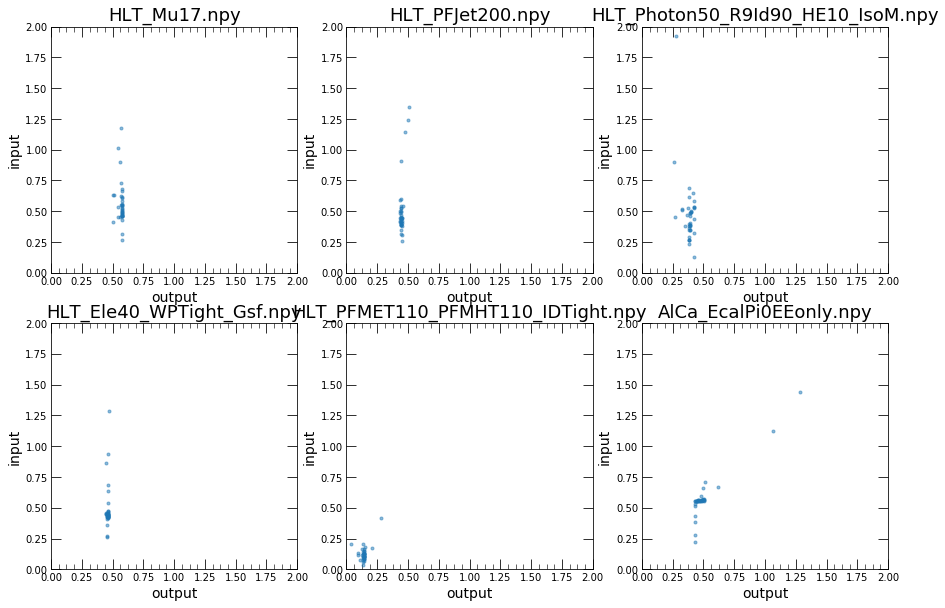

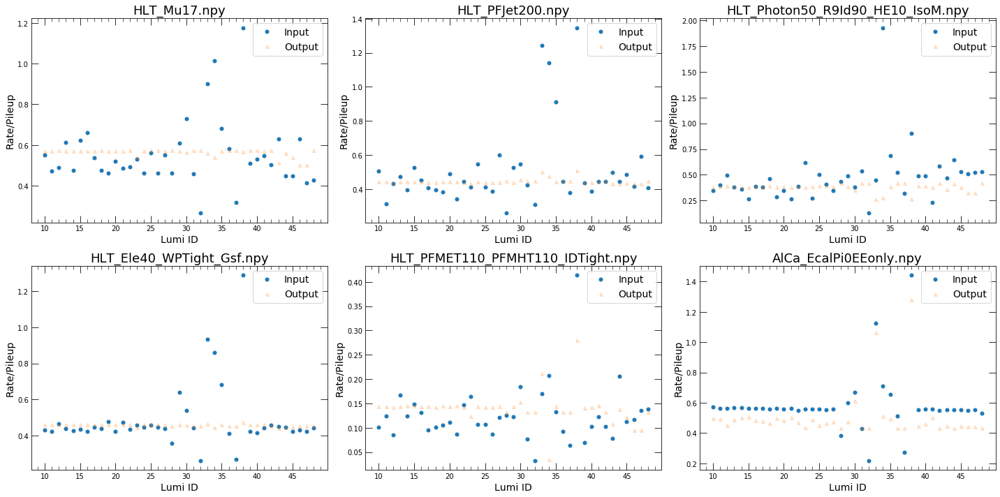

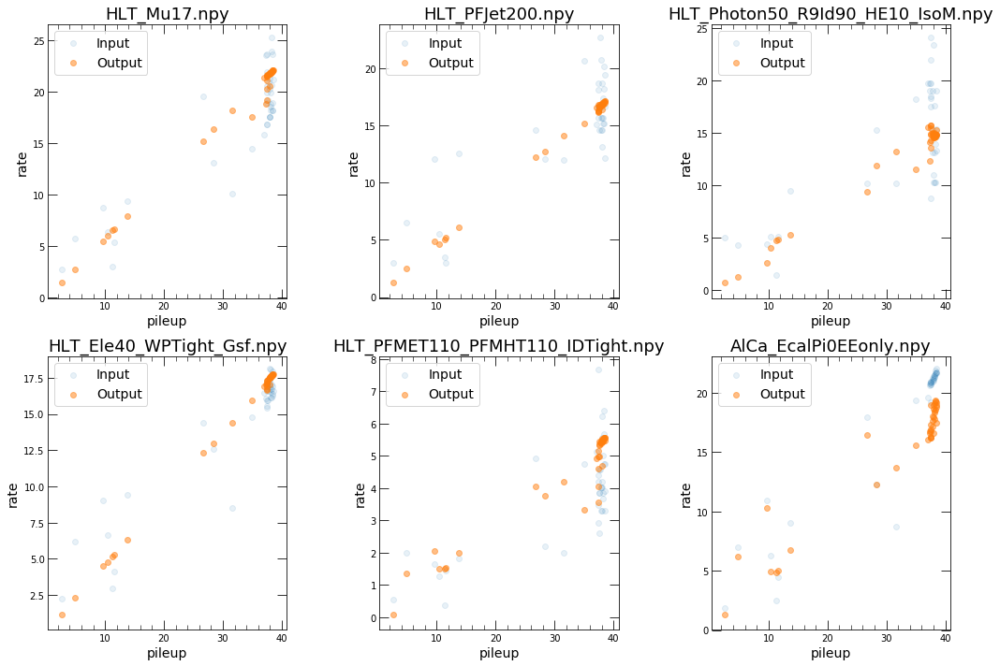

<h1>302663</h1>

<h2>Displaying Inputs</h2>

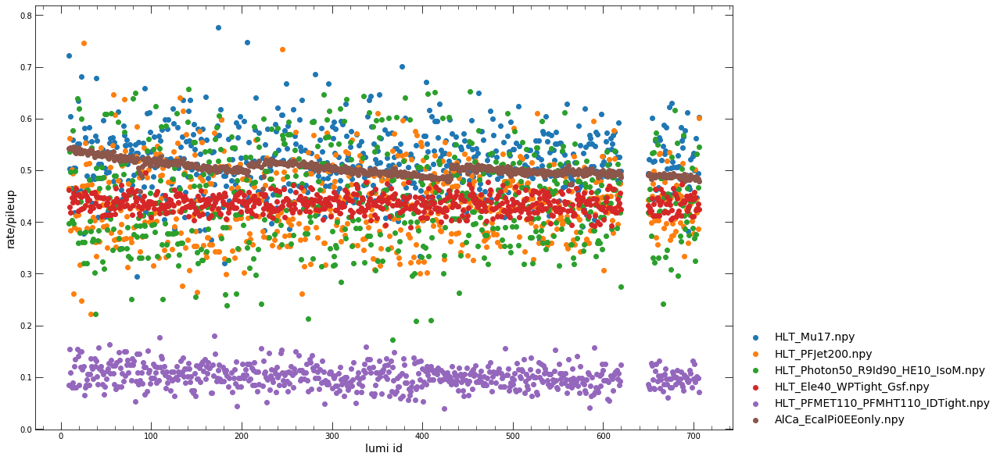

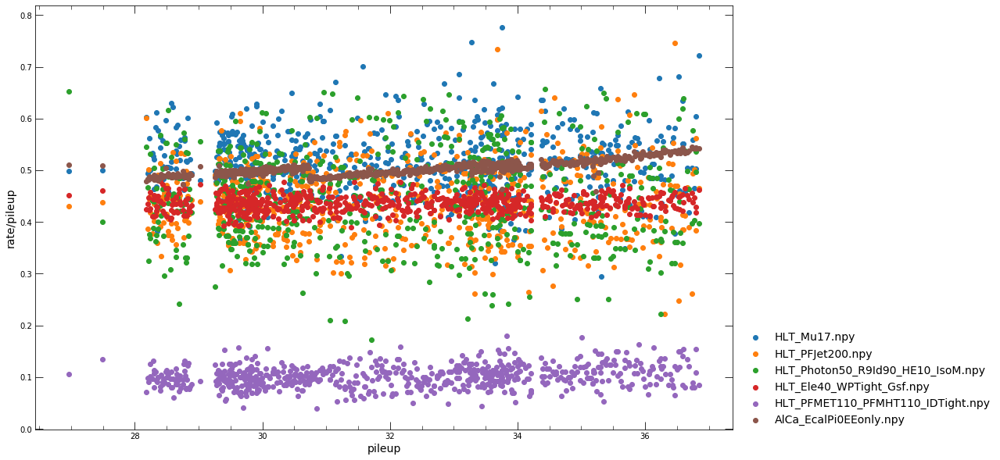

<h2>Plotting Errors</h2>

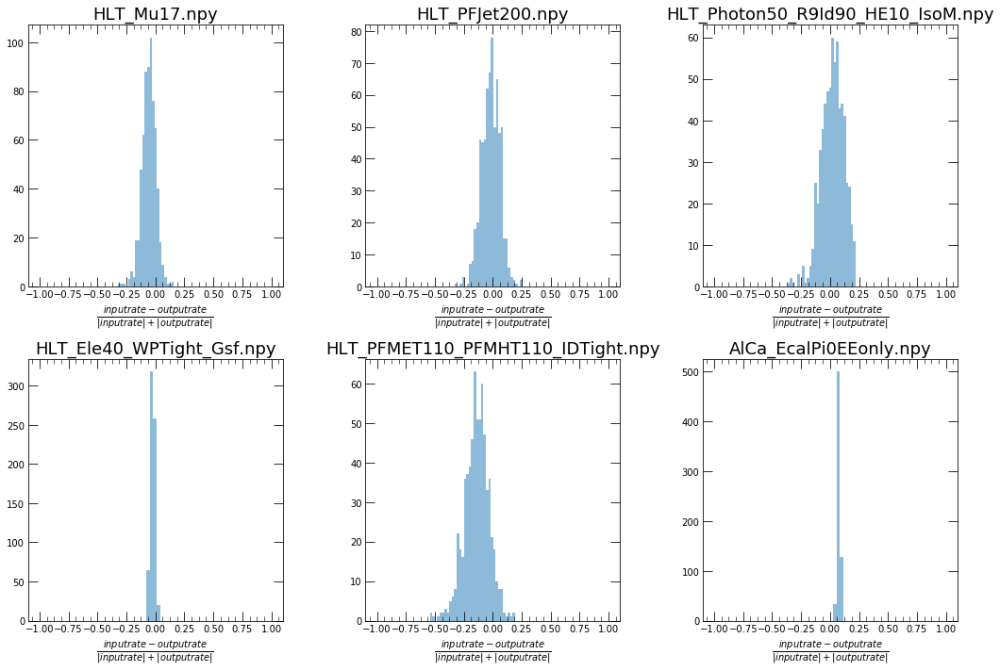

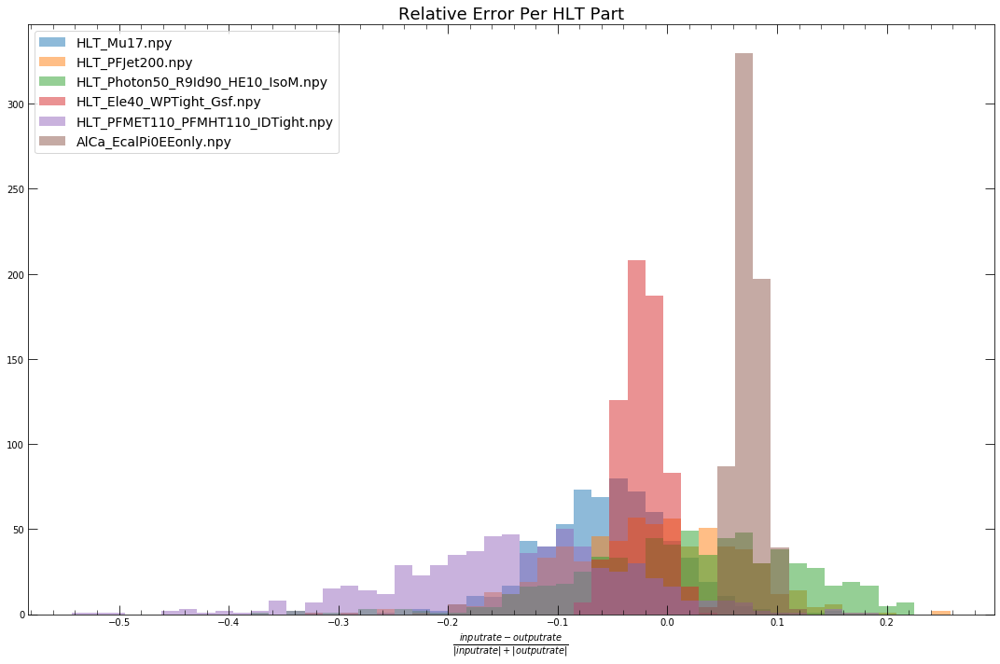

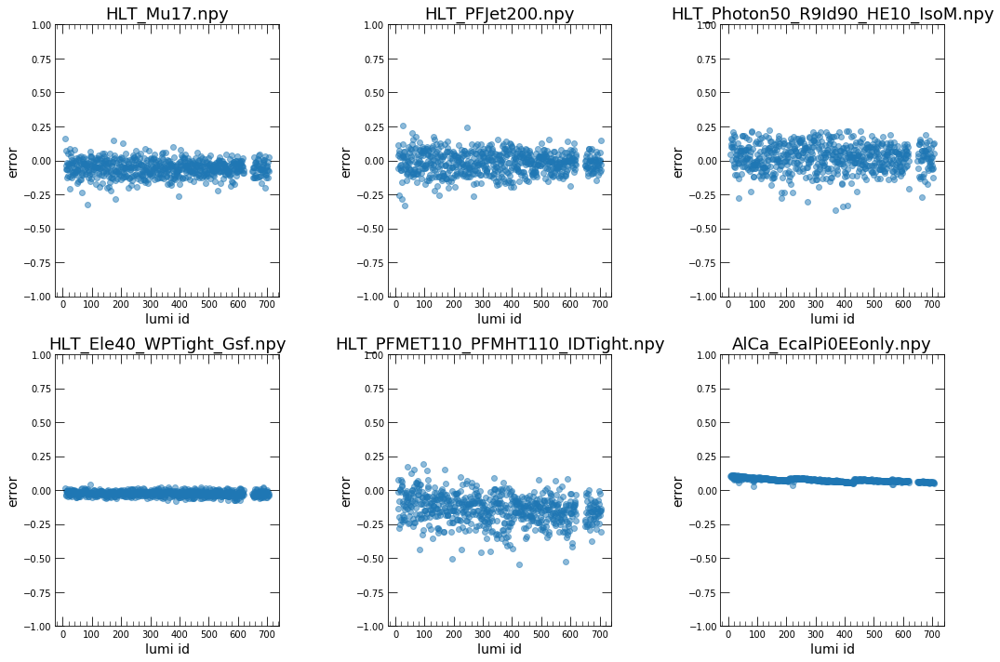

<h2>Plotting Inputs vs Outputs</h2>

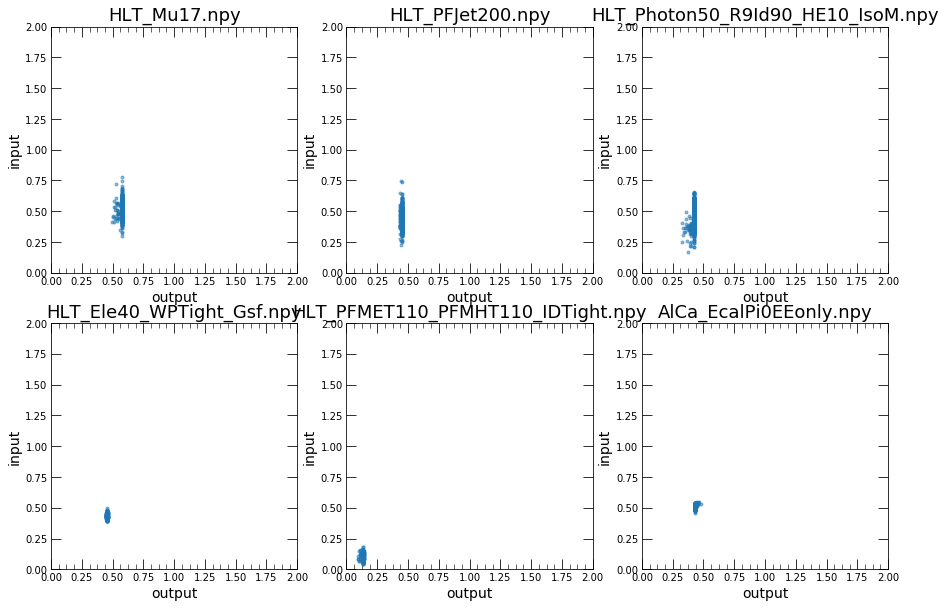

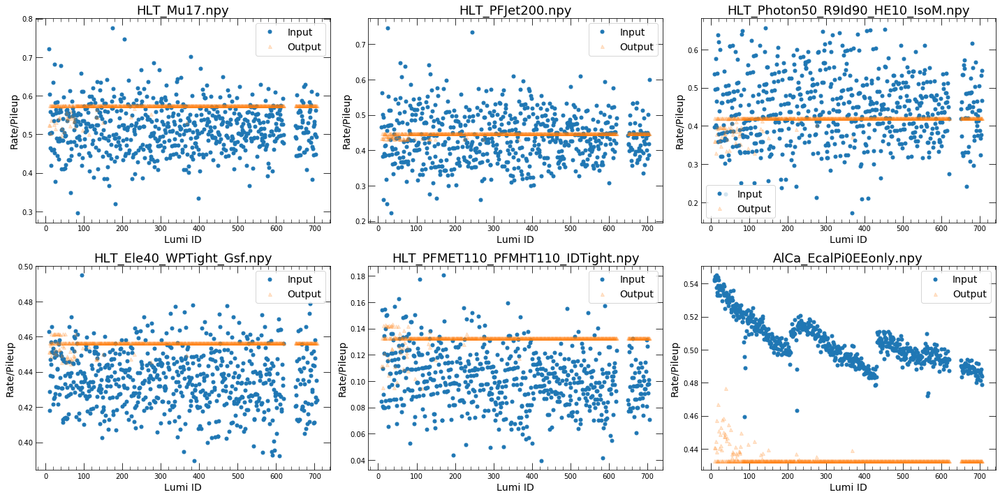

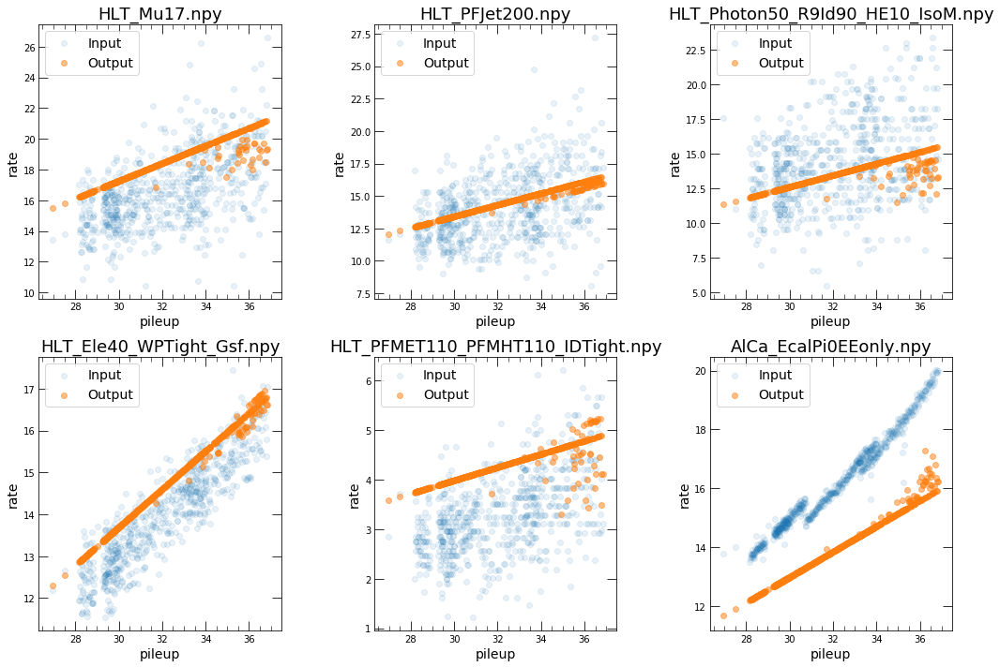

<h1>303832</h1>

<h2>Displaying Inputs</h2>

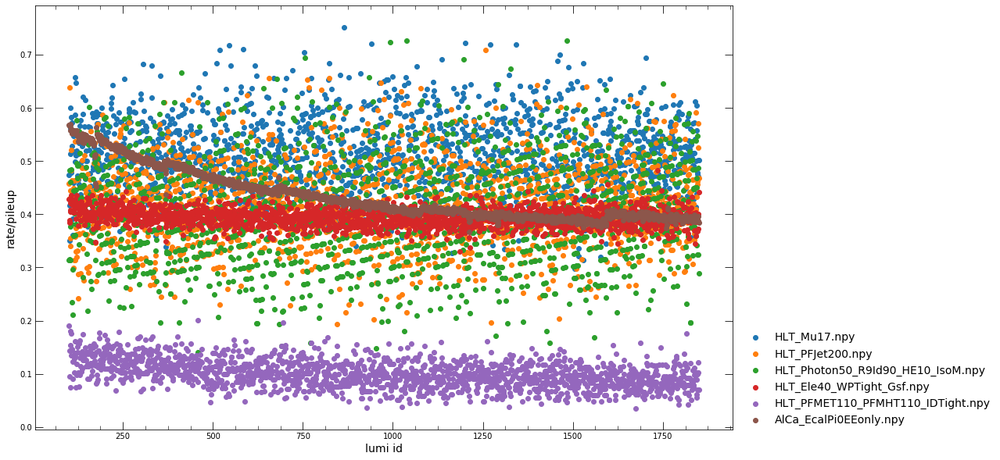

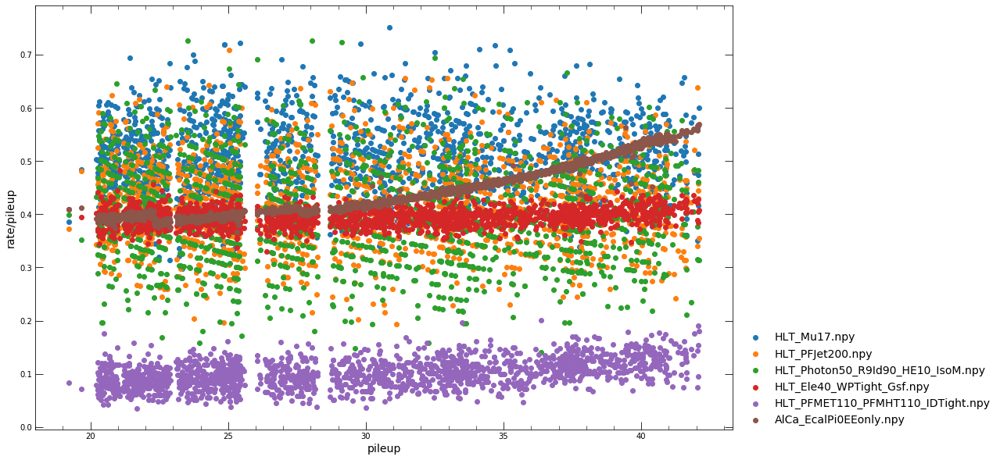

<h2>Plotting Errors</h2>

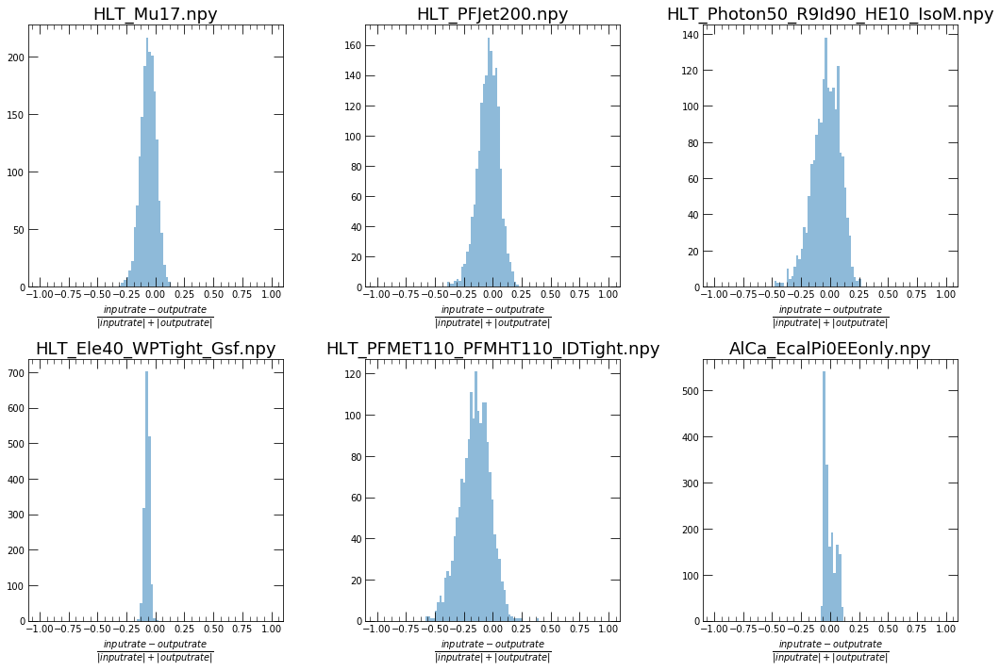

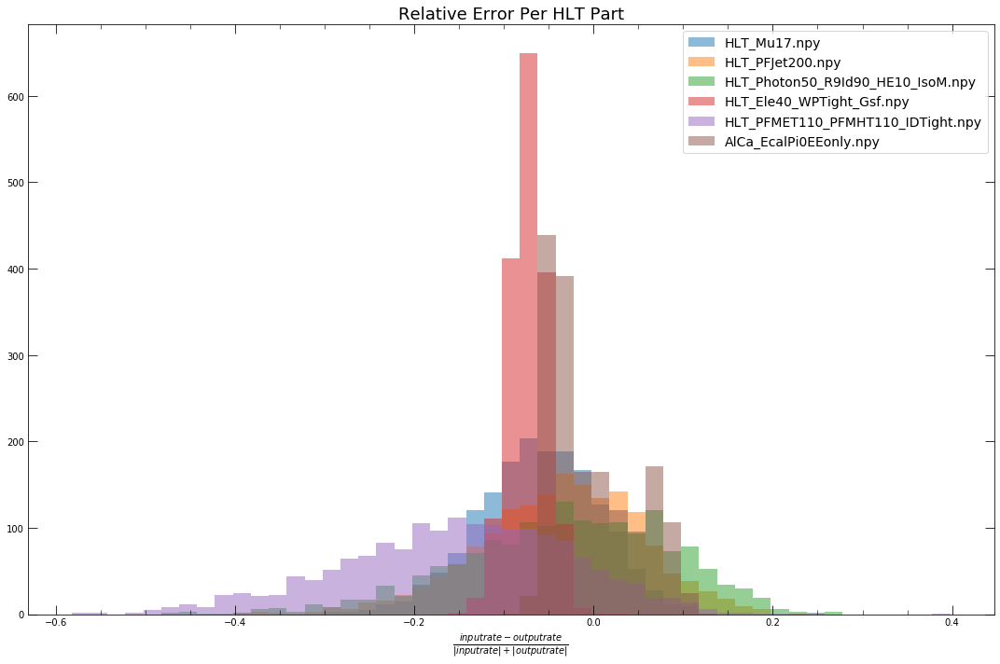

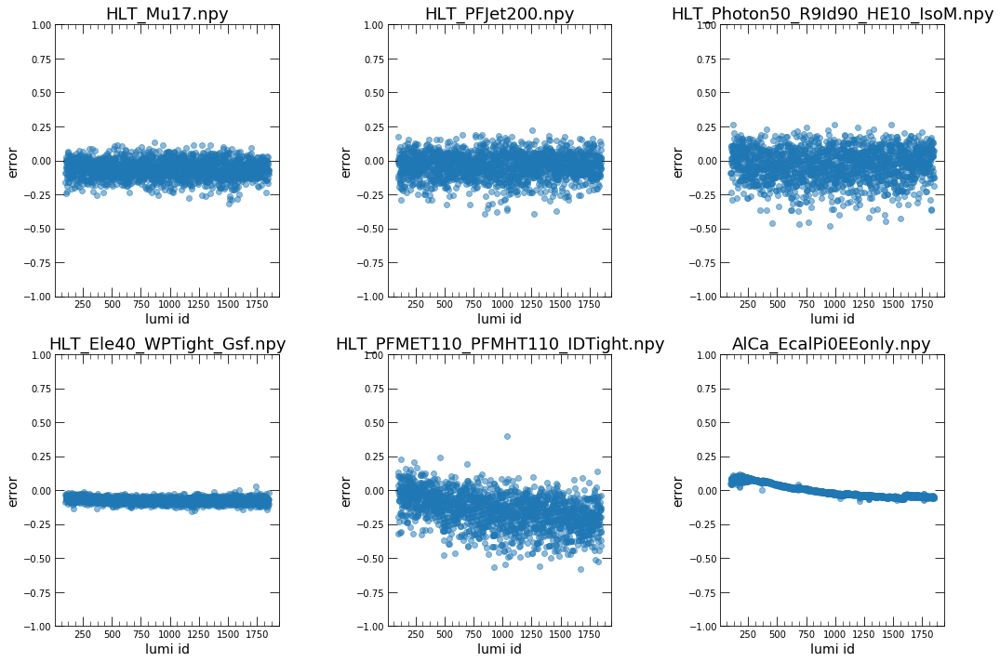

<h2>Plotting Inputs vs Outputs</h2>

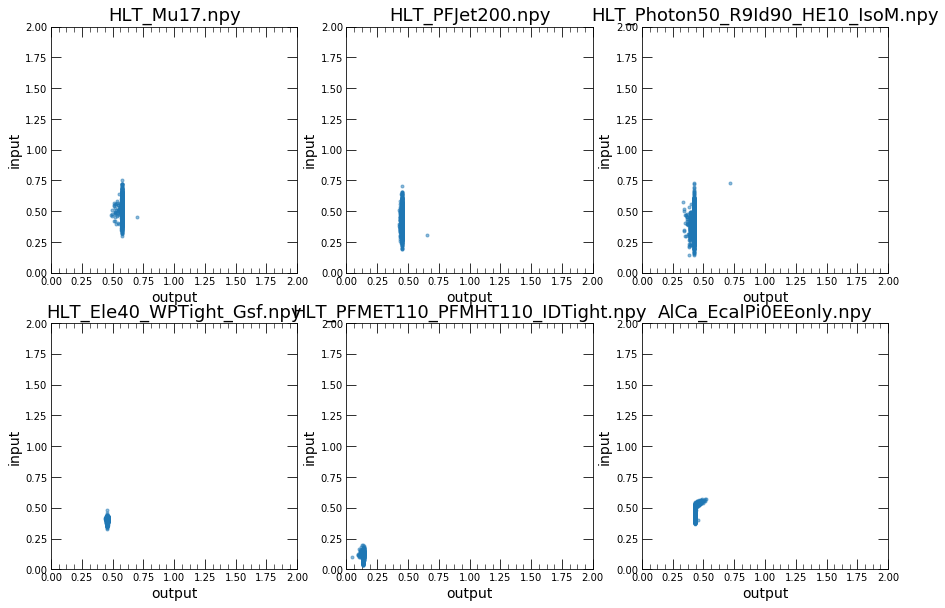

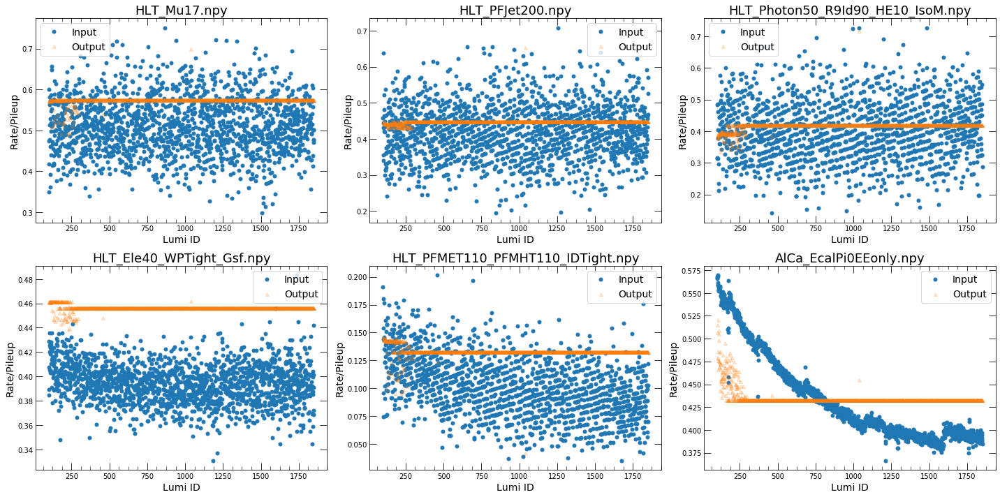

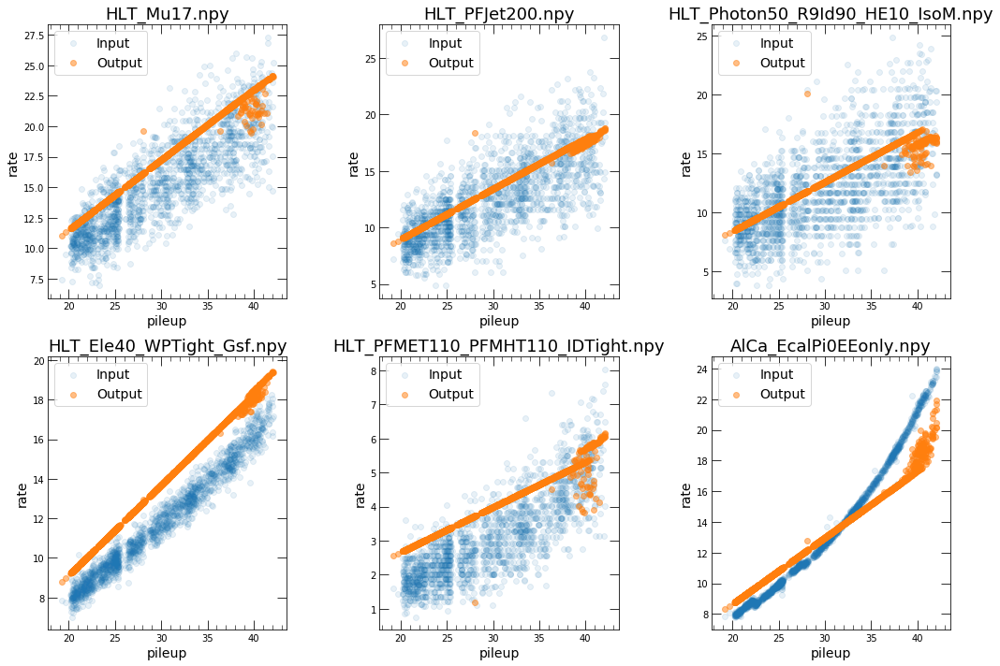

<h1>303838</h1>

<h2>Displaying Inputs</h2>

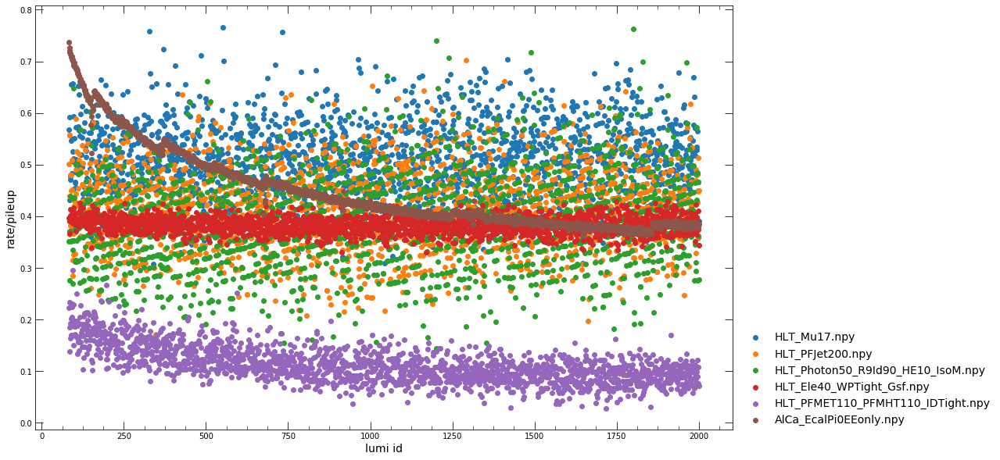

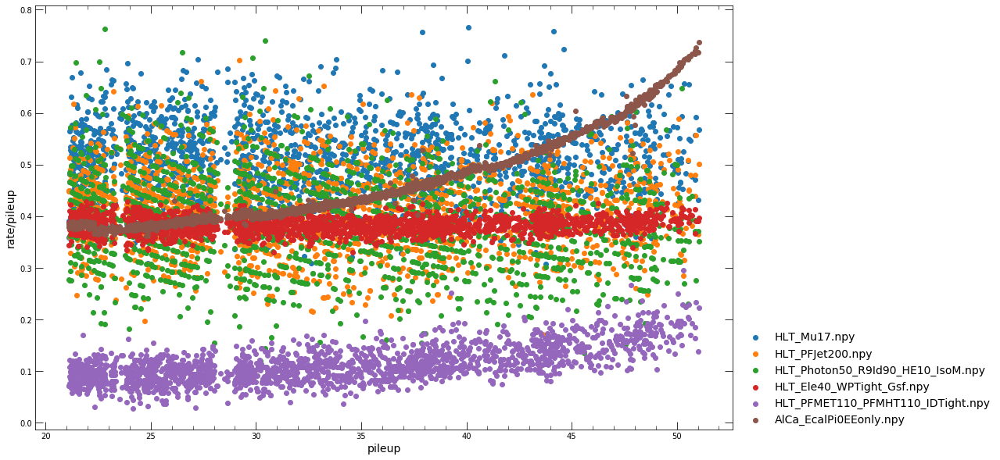

<h2>Plotting Errors</h2>

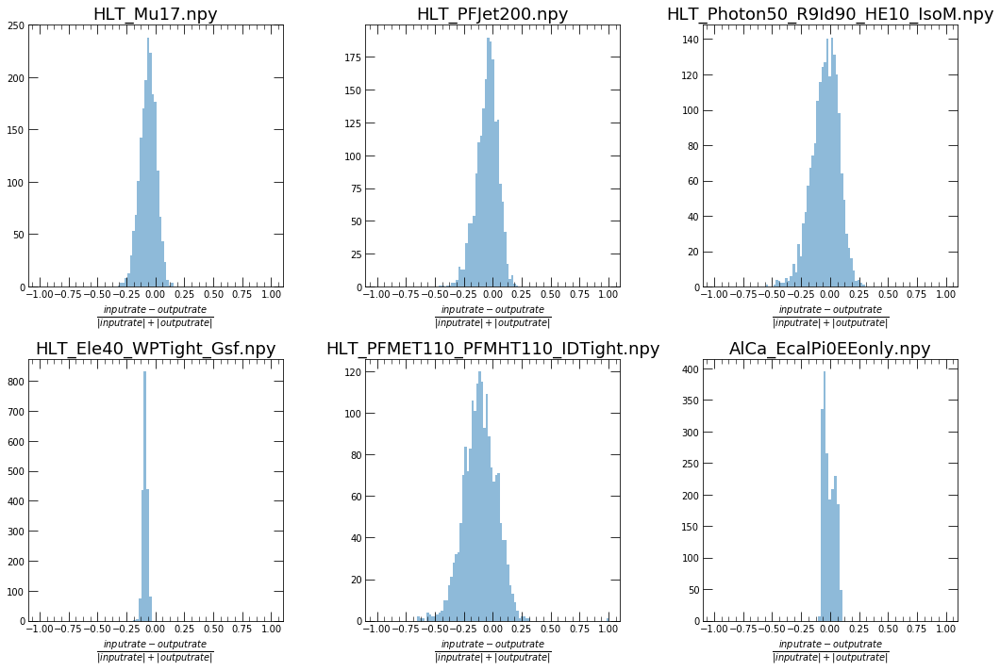

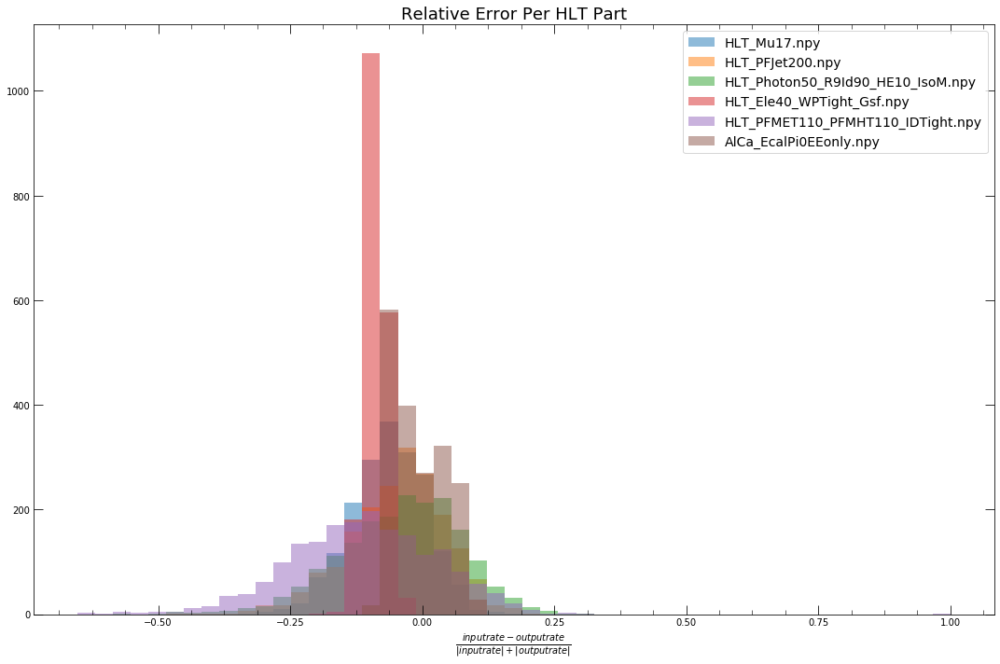

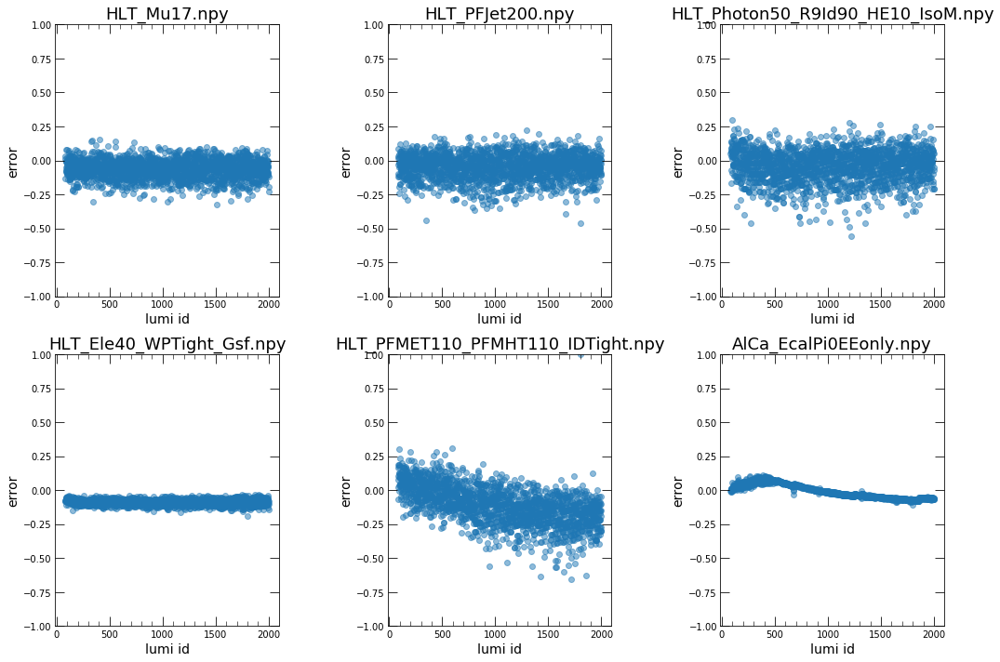

<h2>Plotting Inputs vs Outputs</h2>

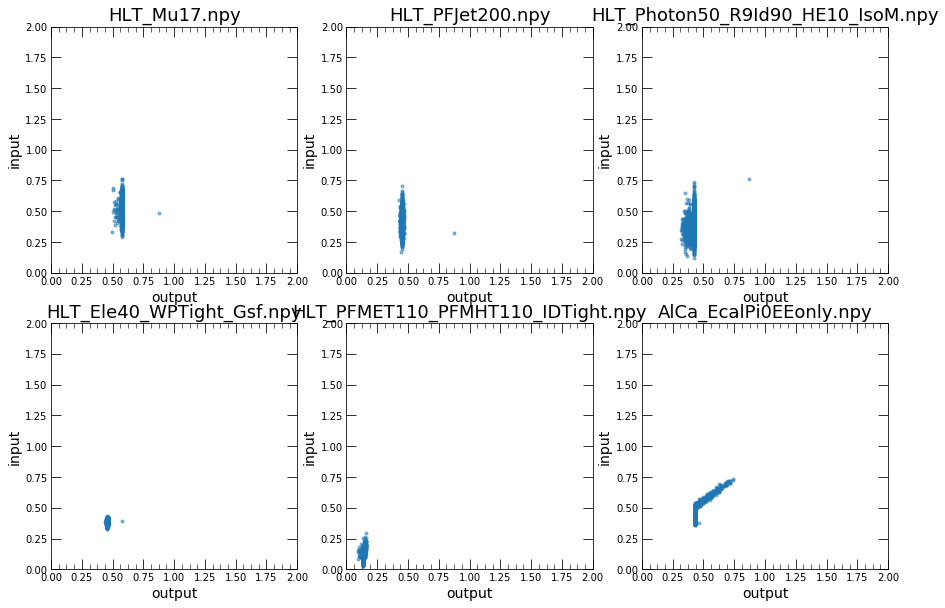

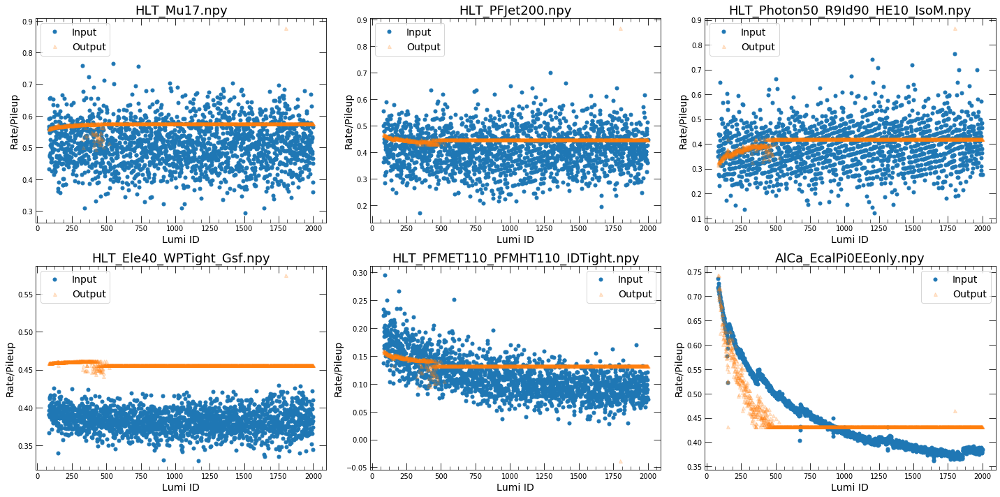

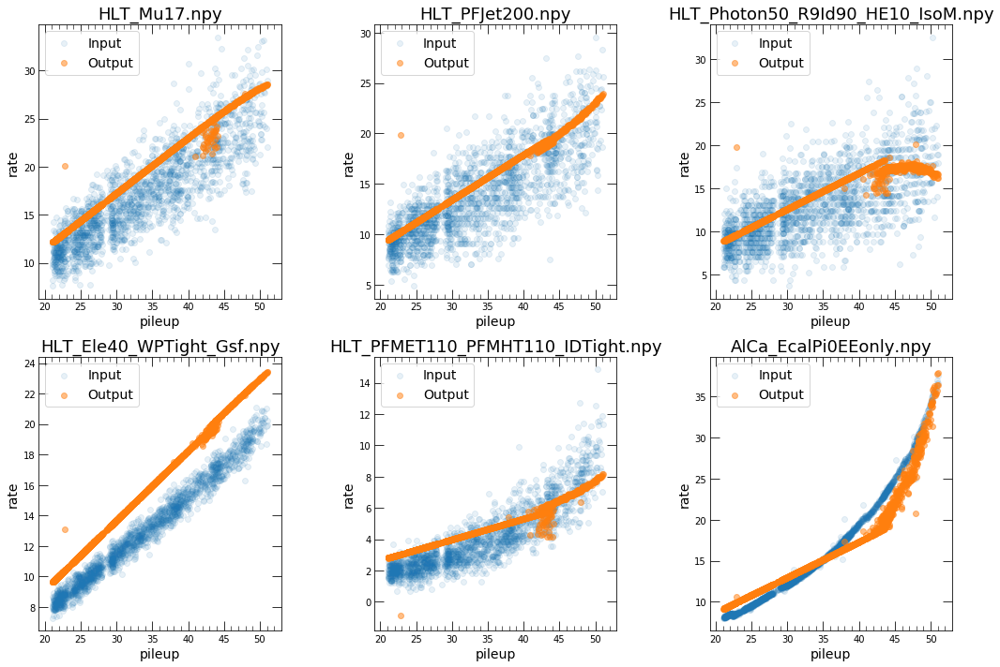

<h1>303885</h1>

<h2>Displaying Inputs</h2>

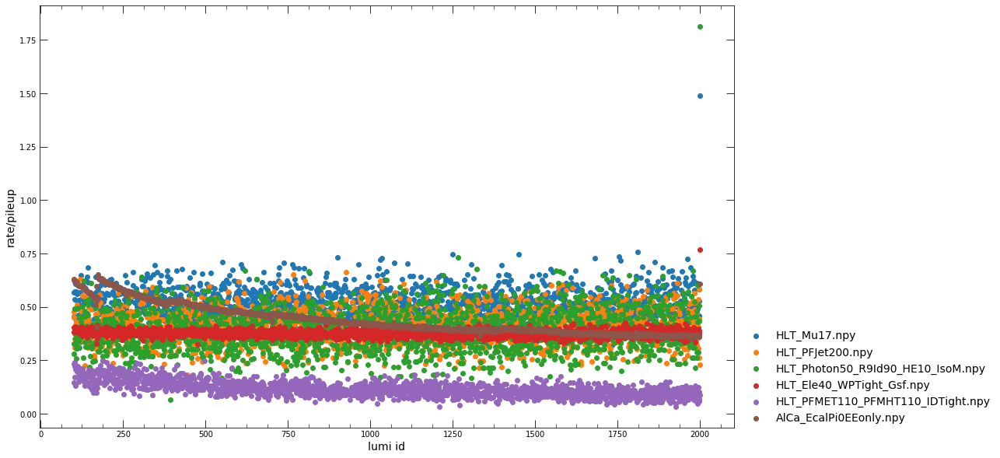

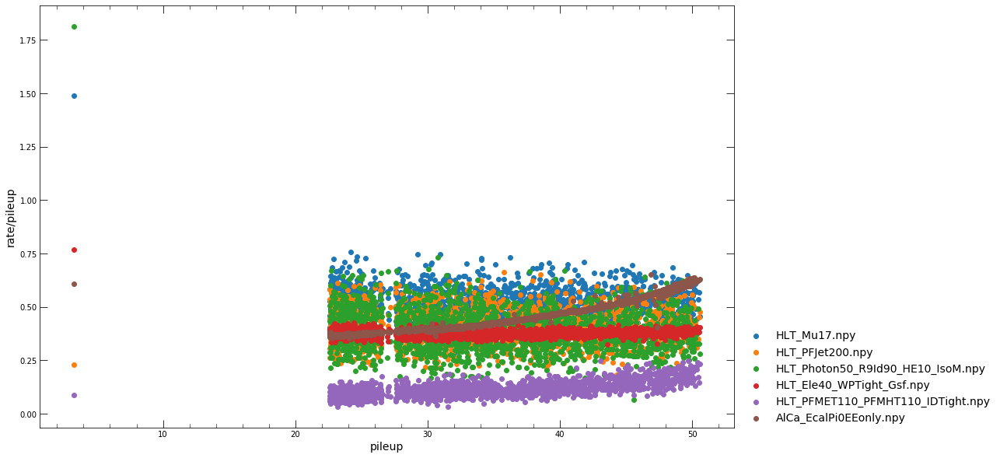

<h2>Plotting Errors</h2>

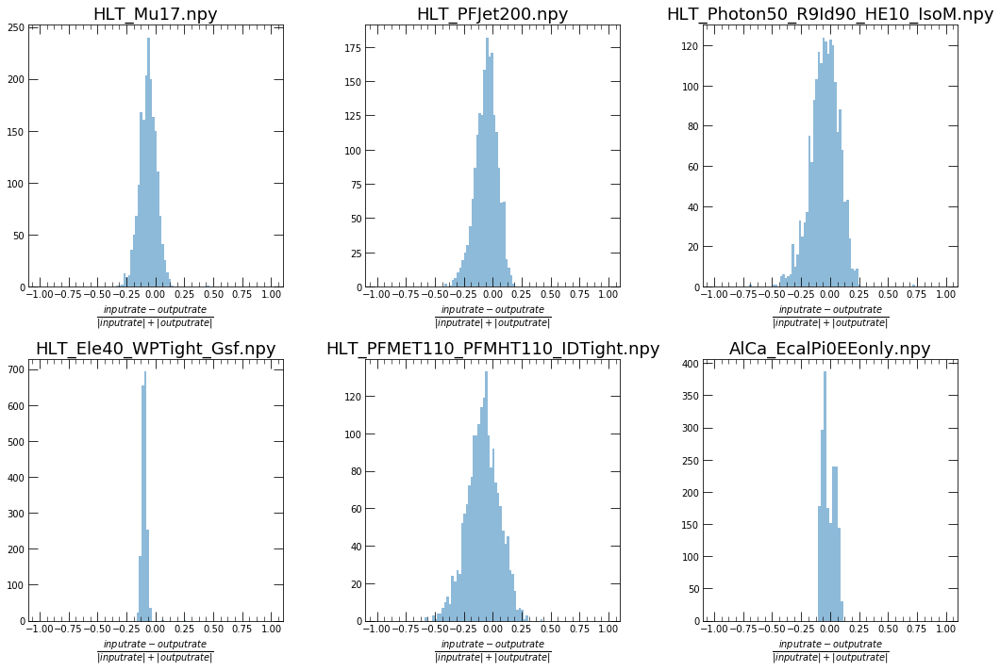

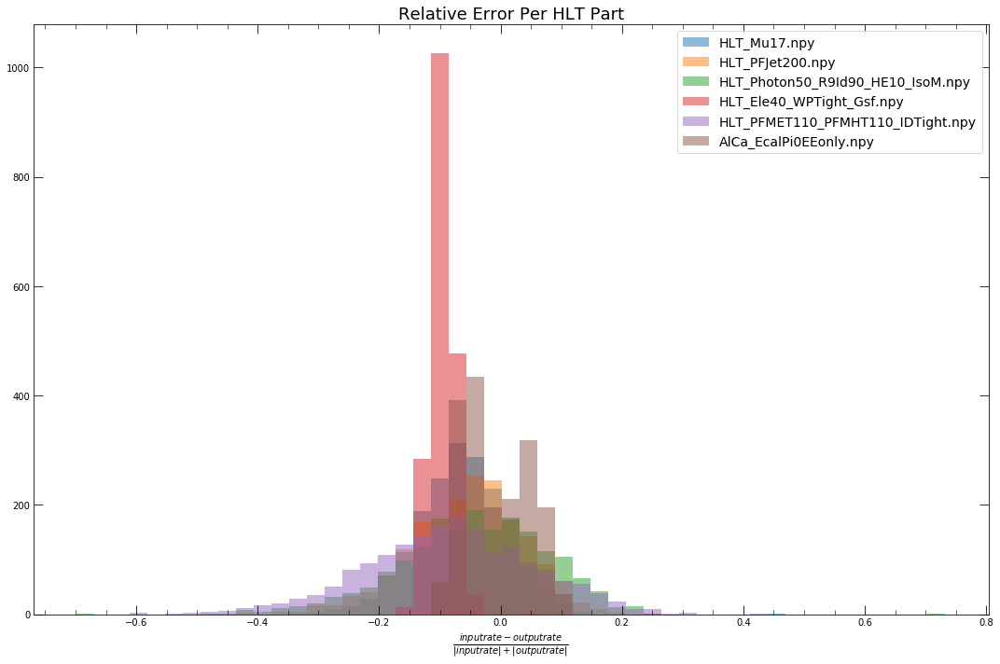

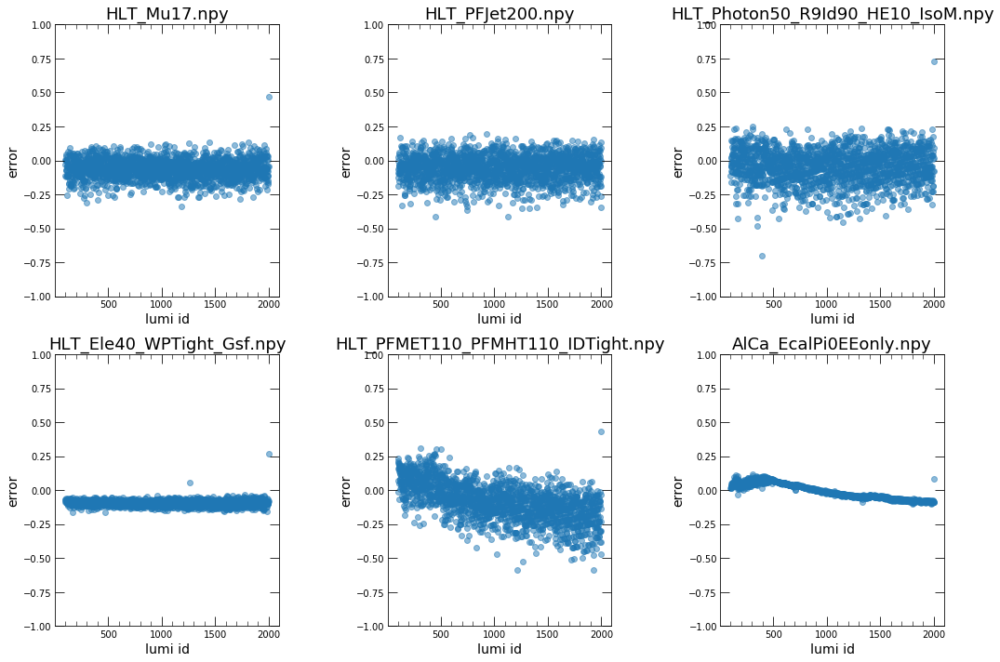

<h2>Plotting Inputs vs Outputs</h2>

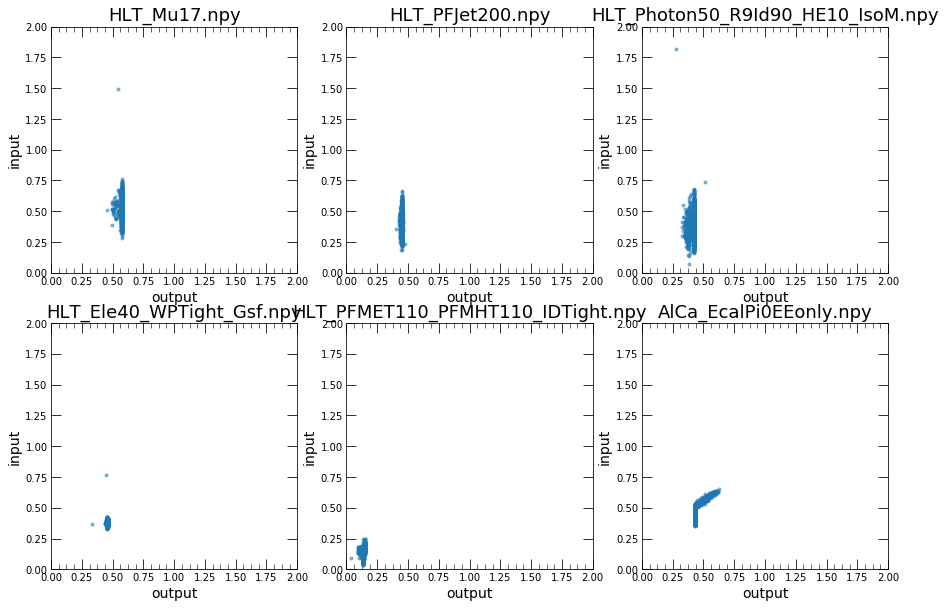

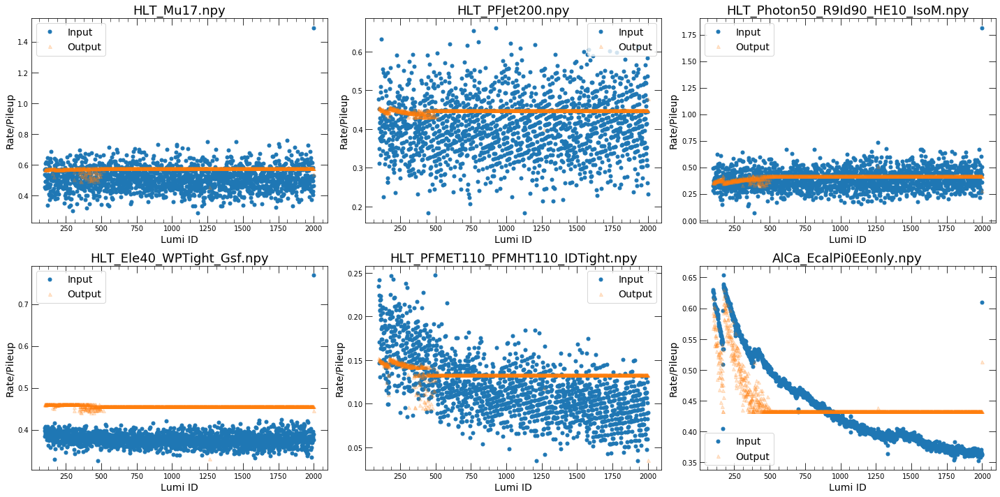

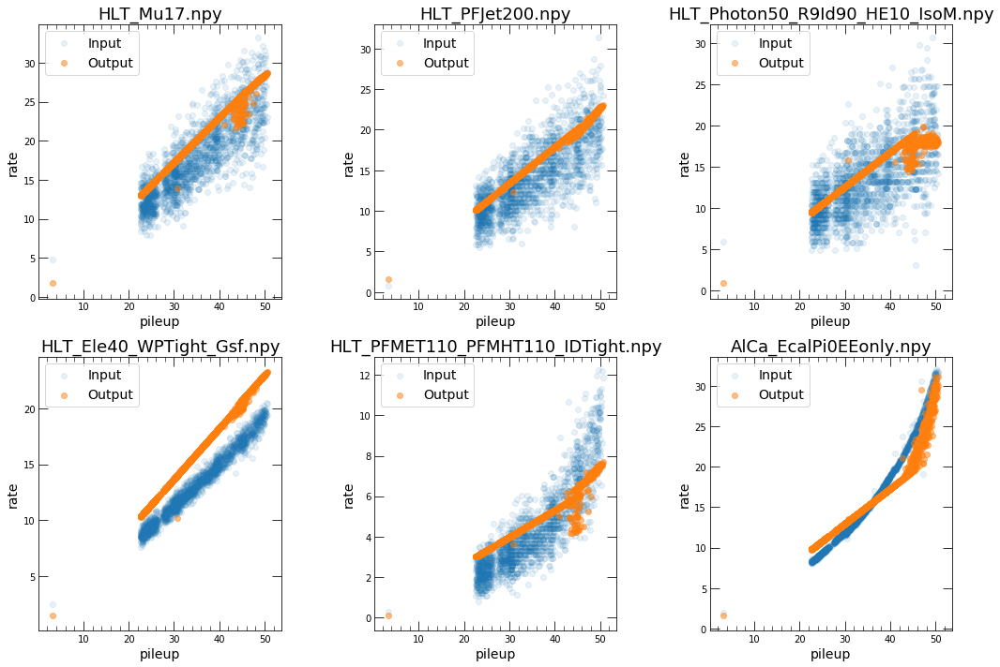

<h1>303948</h1>

<h2>Displaying Inputs</h2>

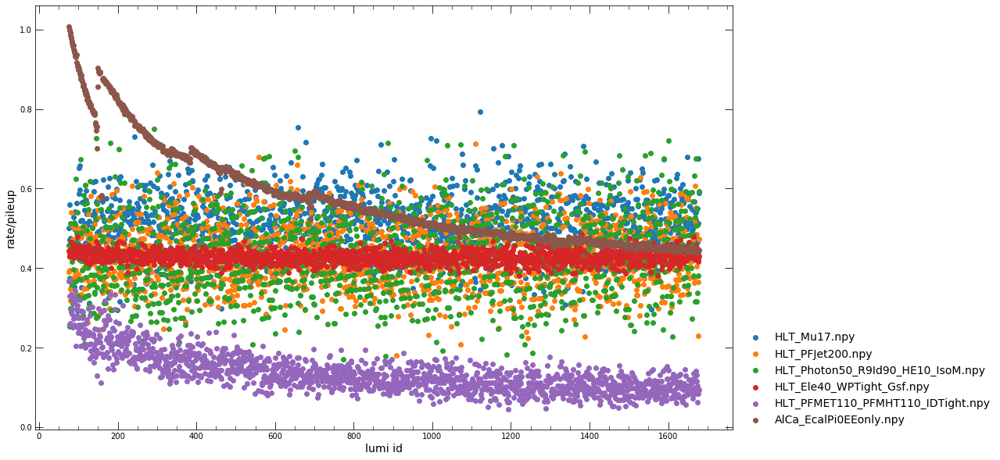

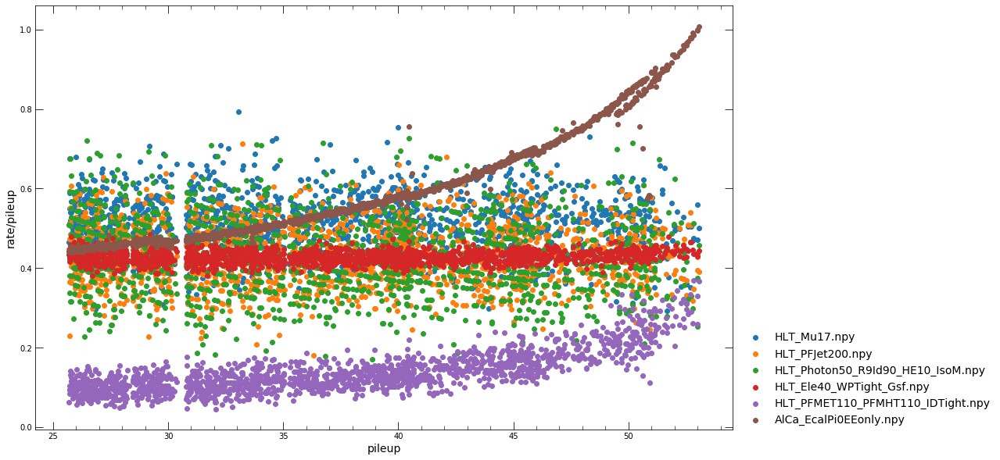

<h2>Plotting Errors</h2>

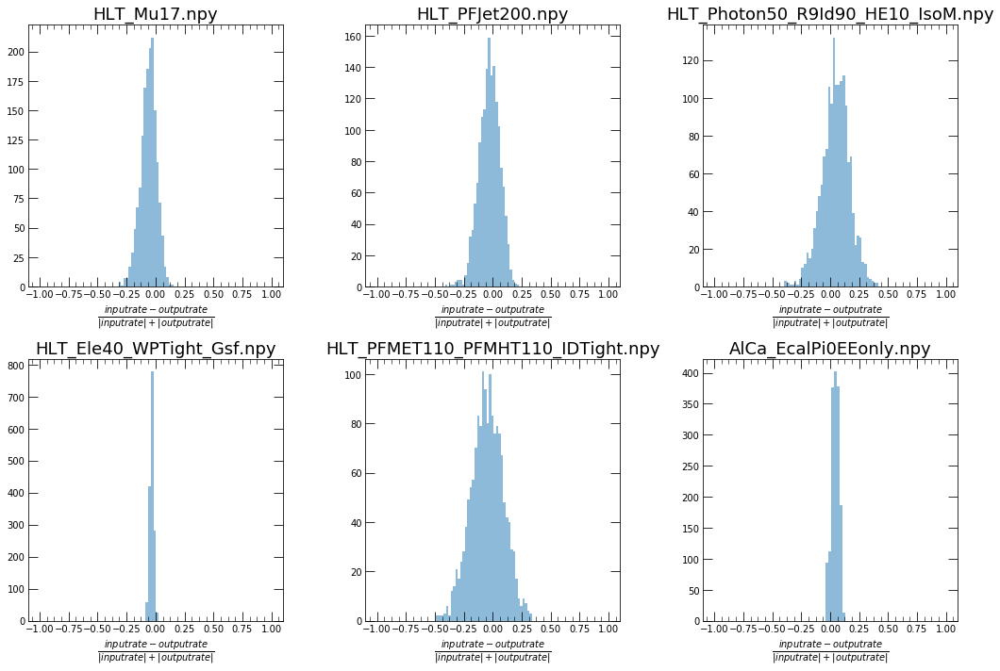

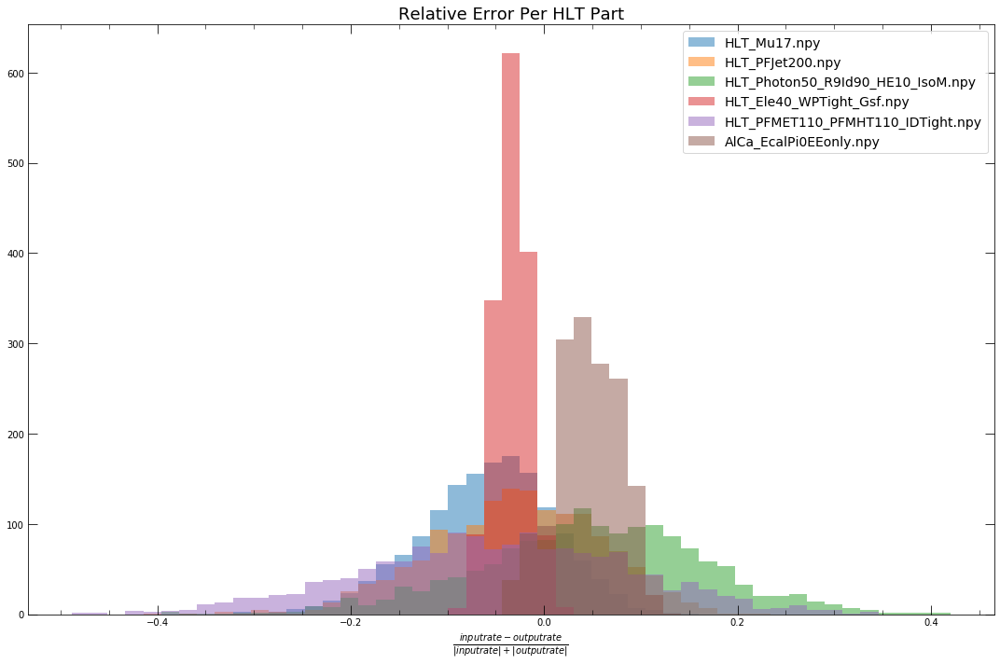

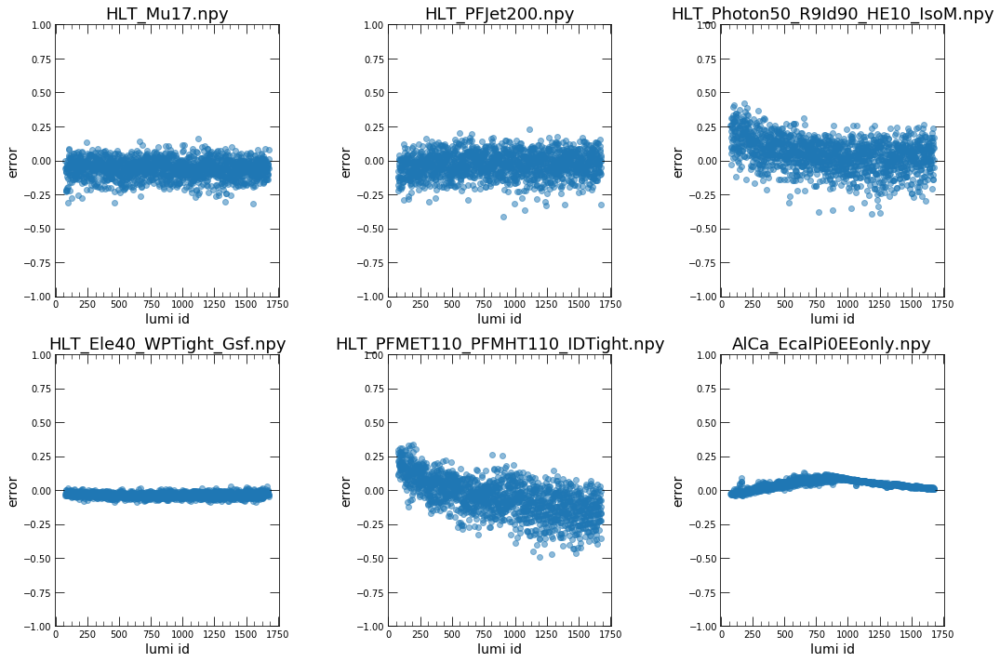

<h2>Plotting Inputs vs Outputs</h2>

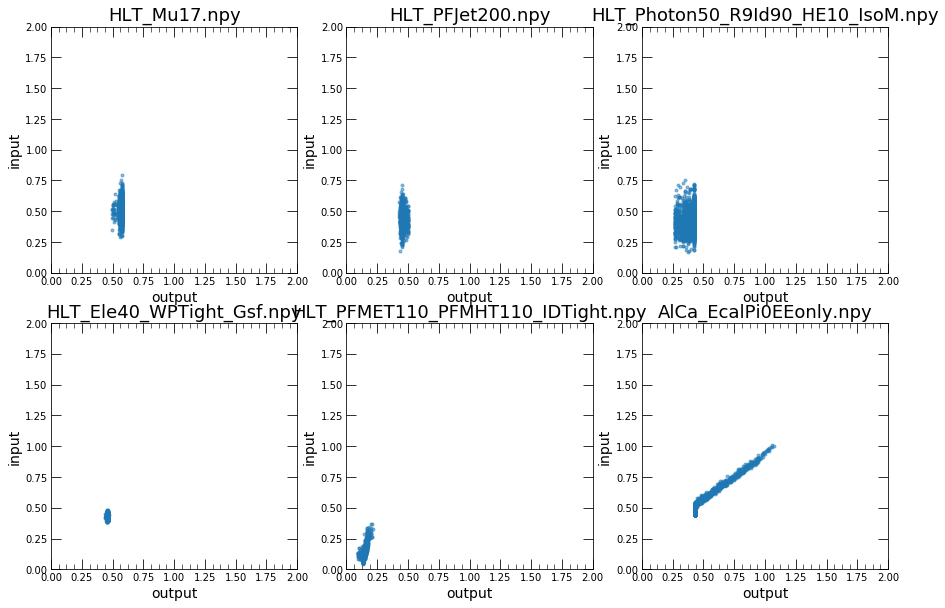

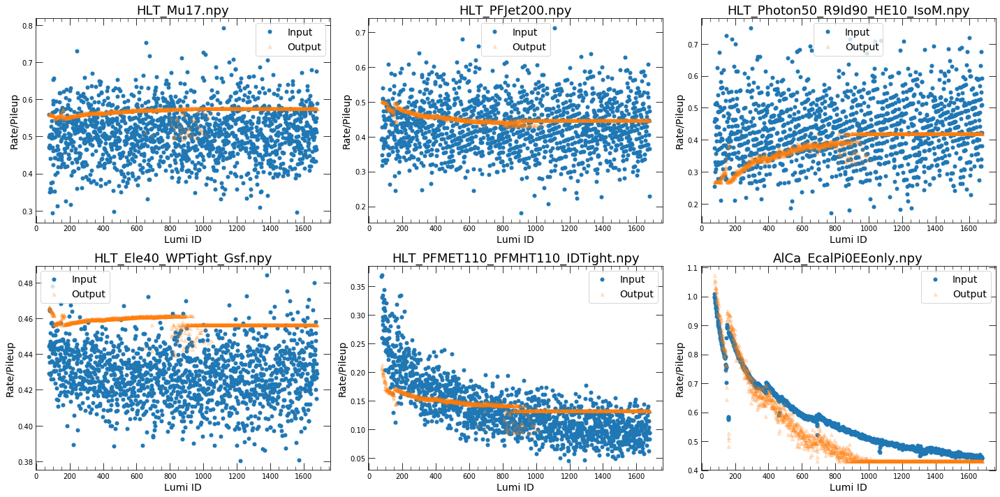

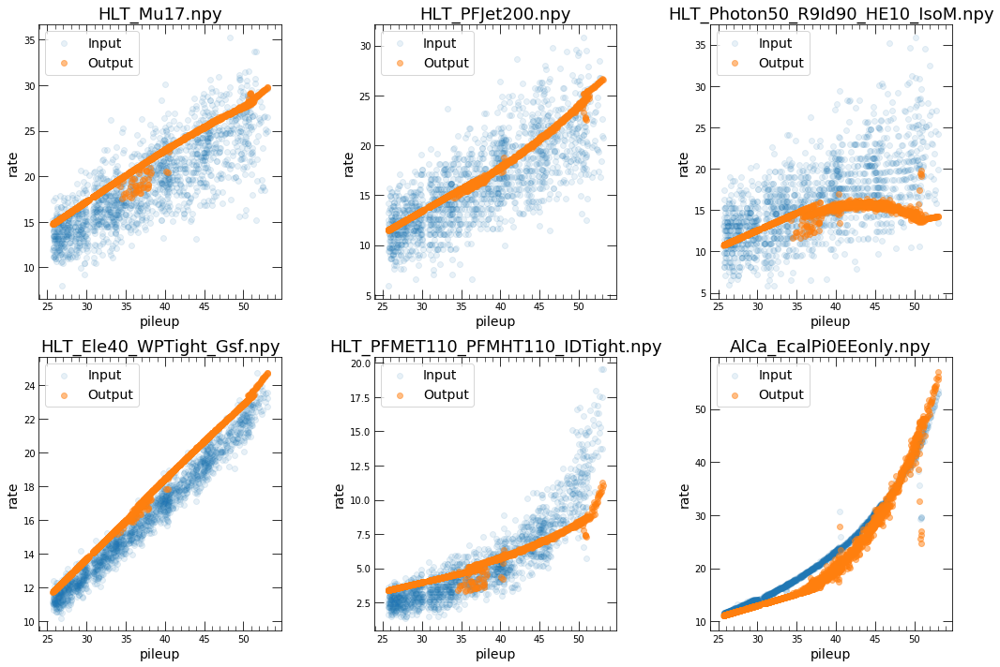

<h1>303998</h1>

<h2>Displaying Inputs</h2>

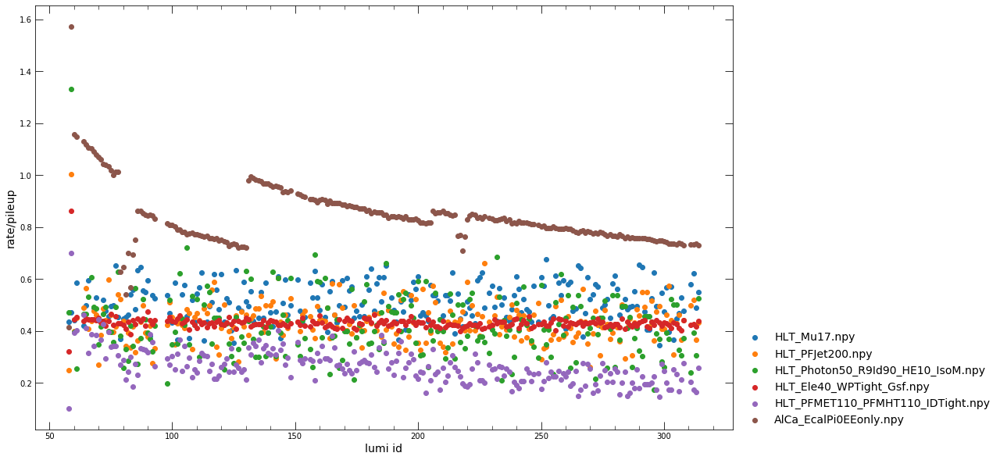

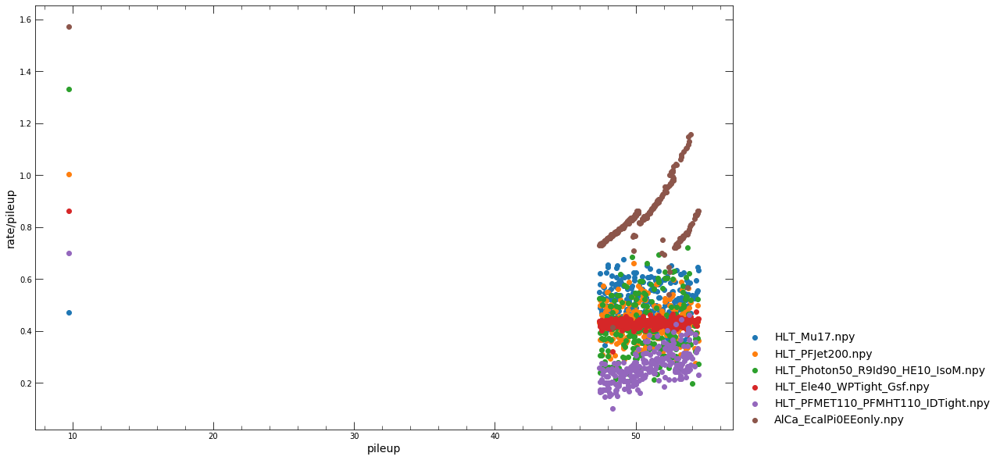

<h2>Plotting Errors</h2>

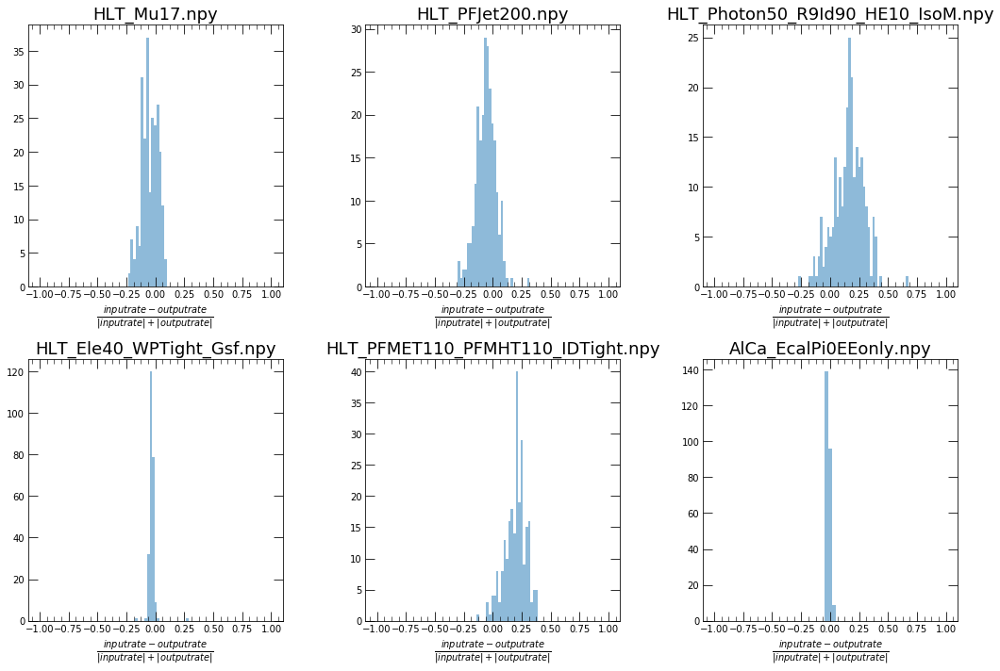

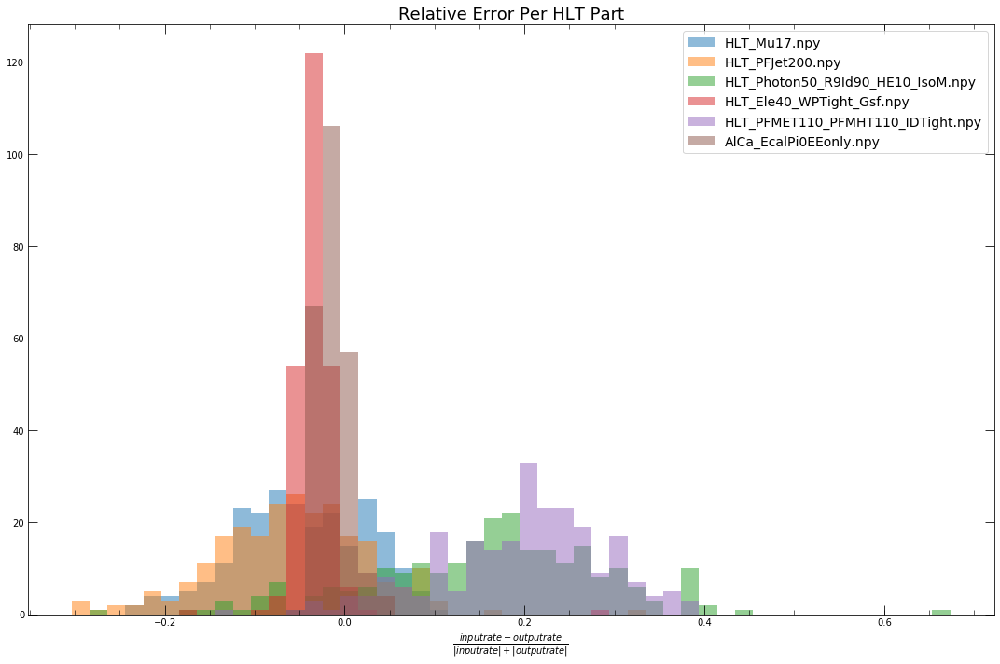

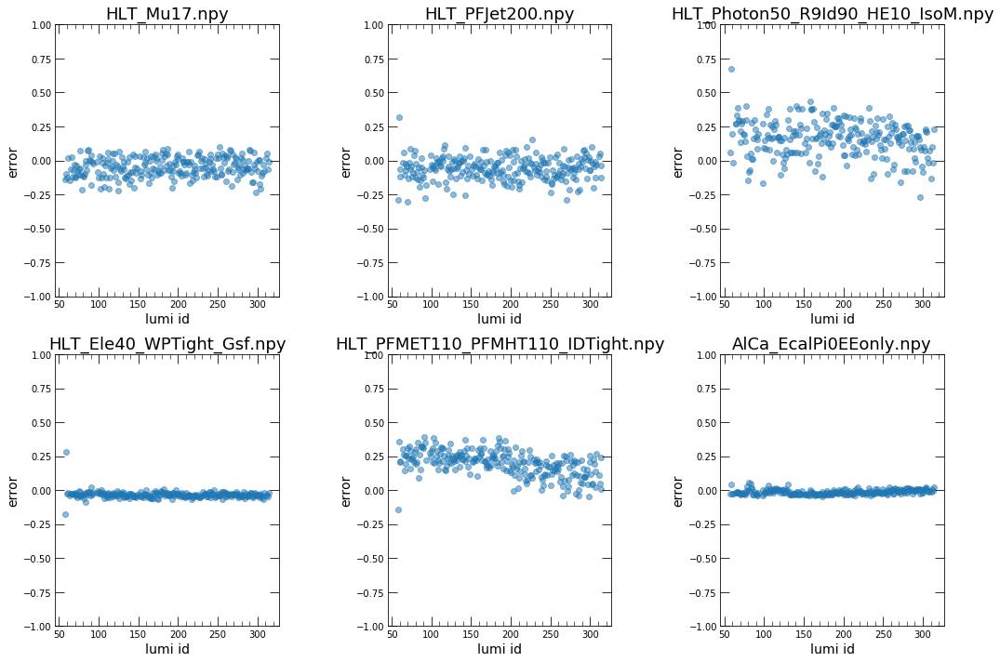

<h2>Plotting Inputs vs Outputs</h2>

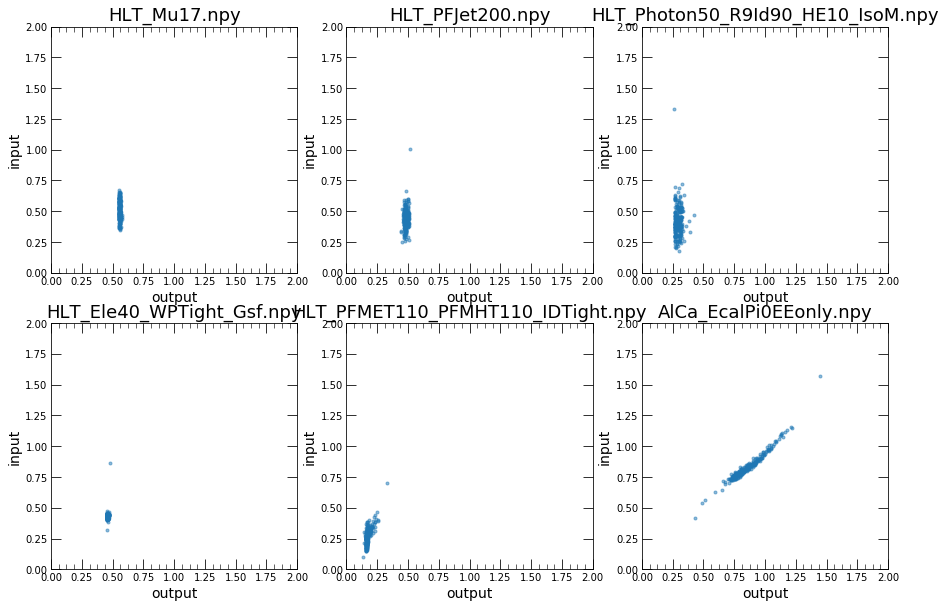

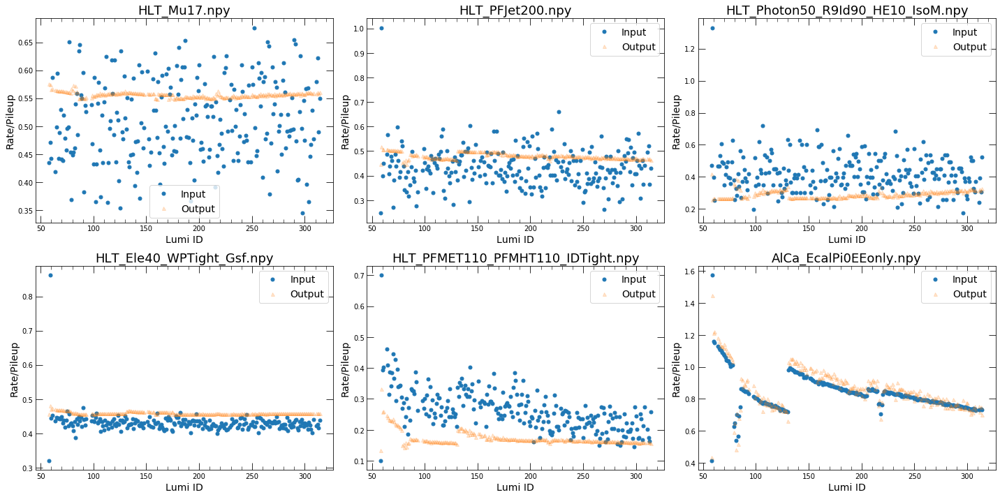

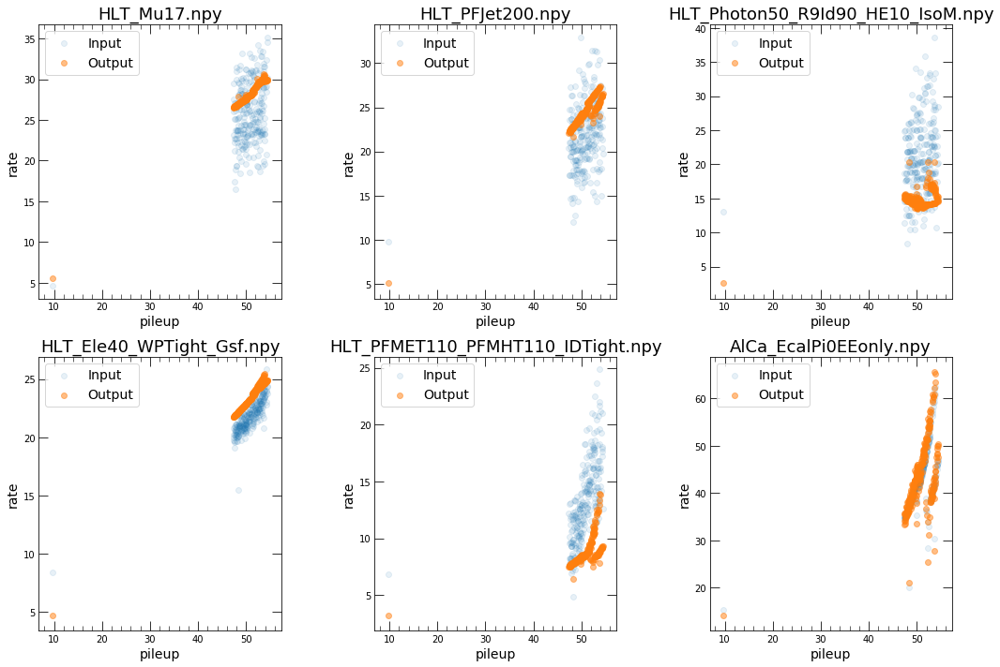

<h1>303999</h1>

<h2>Displaying Inputs</h2>

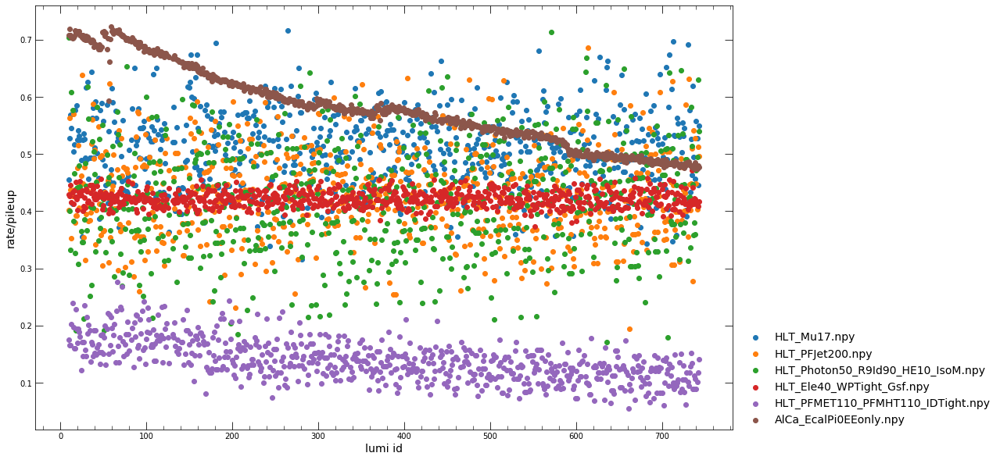

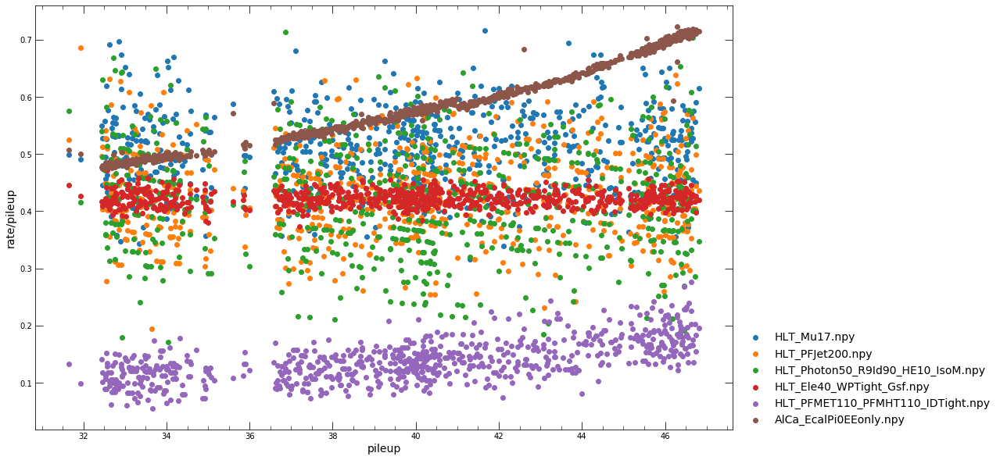

<h2>Plotting Errors</h2>

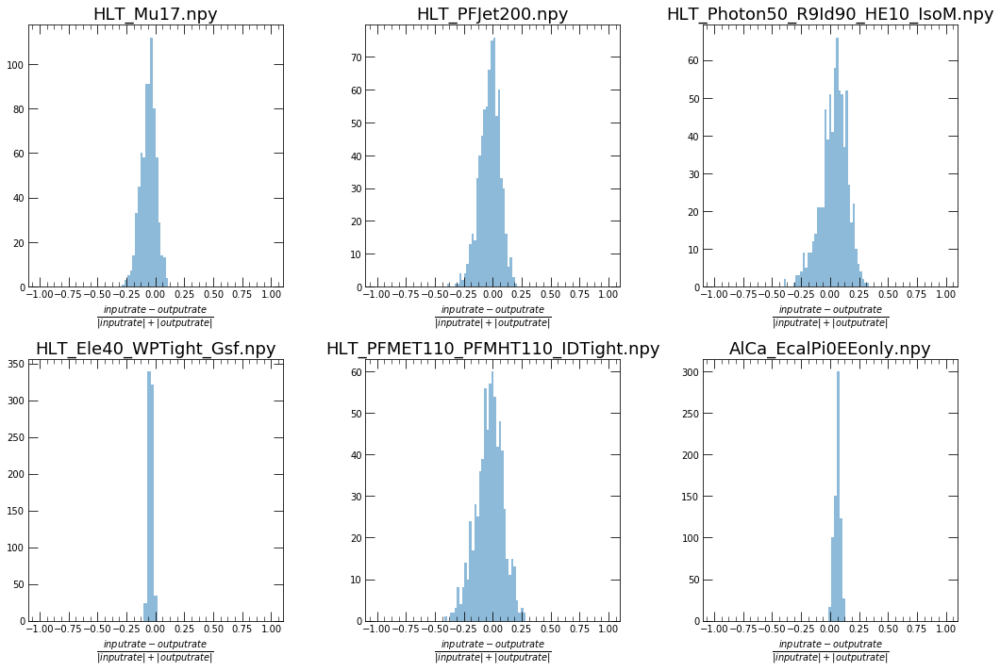

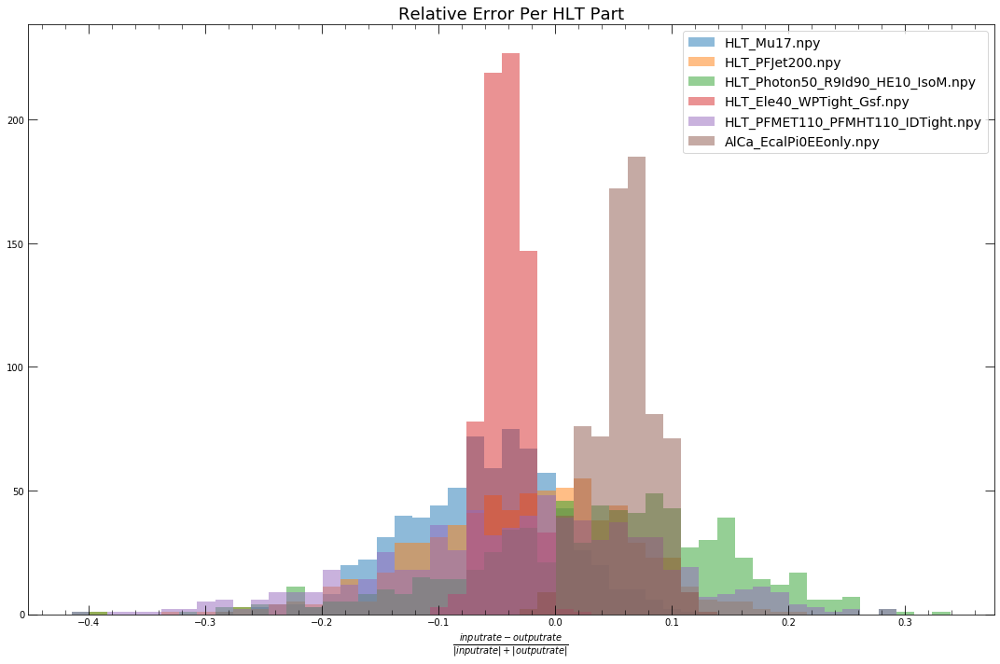

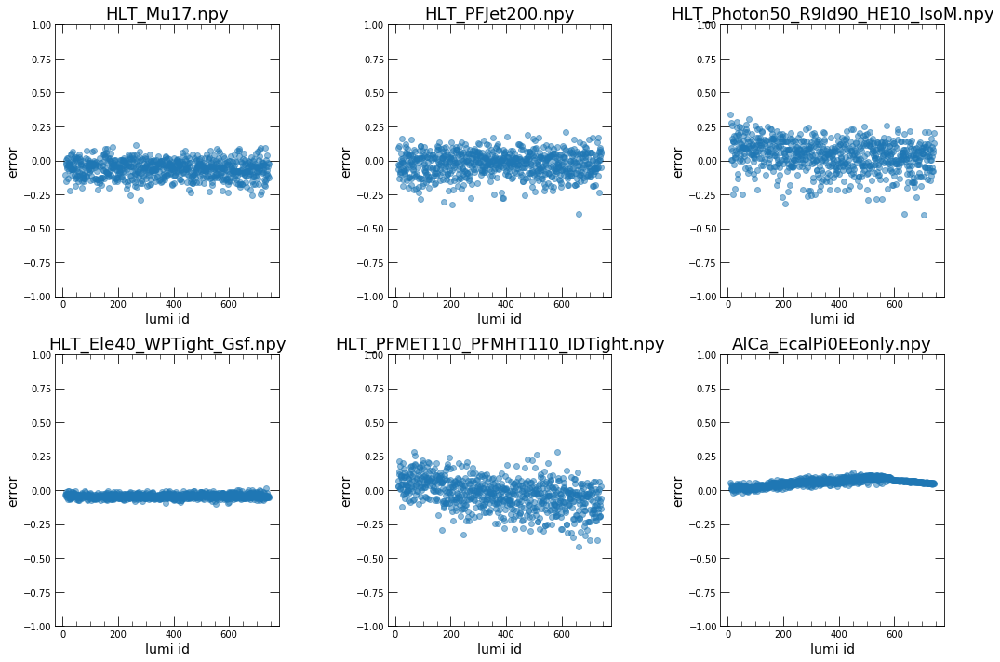

<h2>Plotting Inputs vs Outputs</h2>

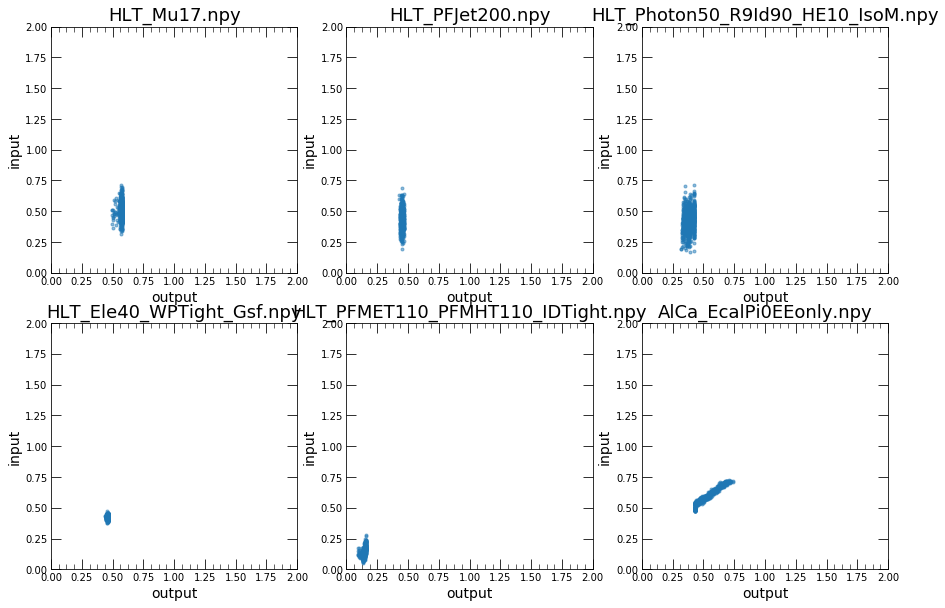

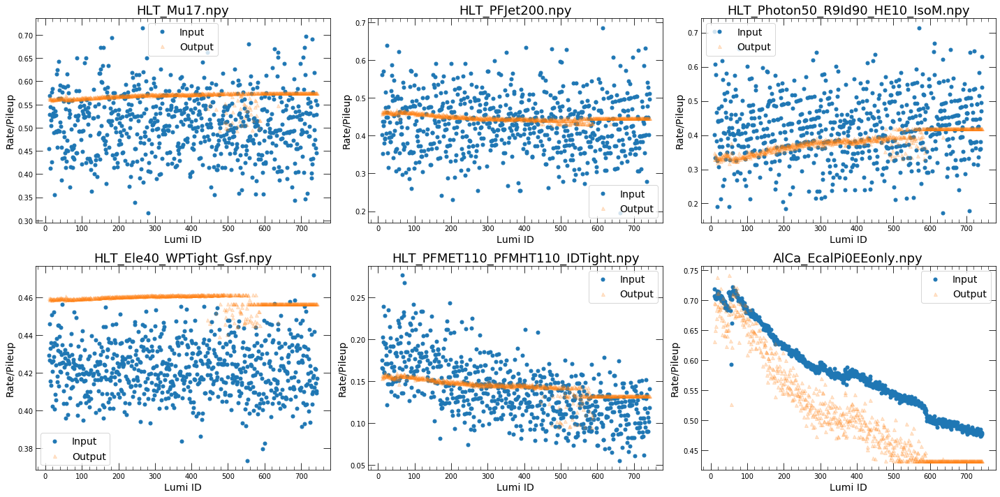

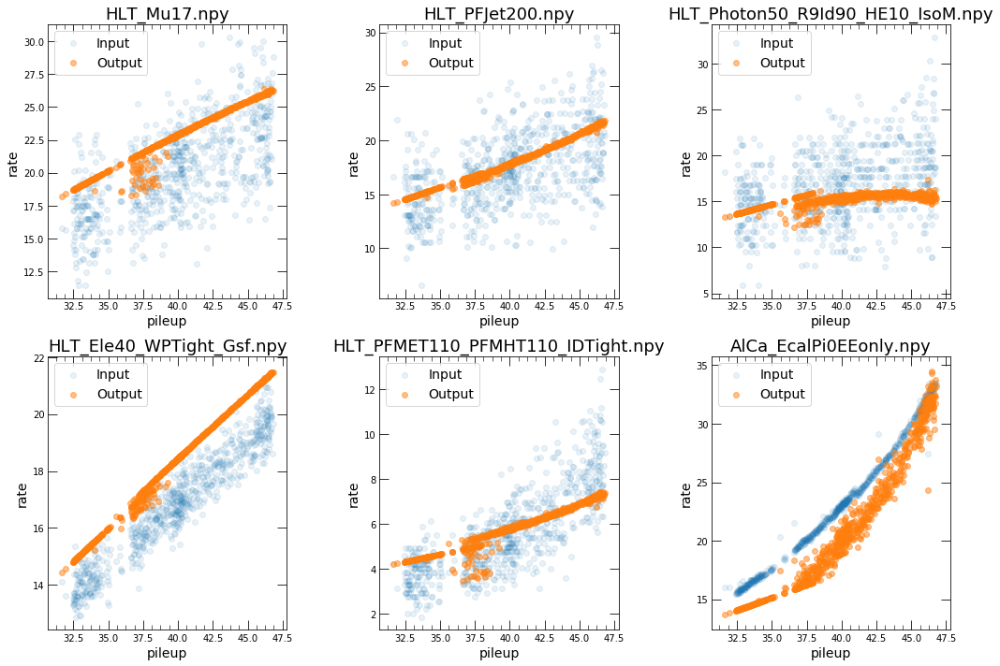

<h1>304000</h1>

<h2>Displaying Inputs</h2>

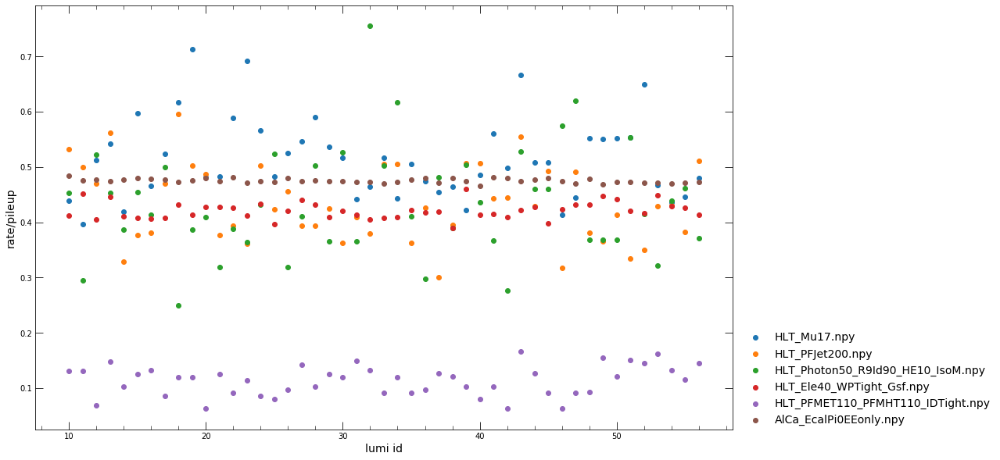

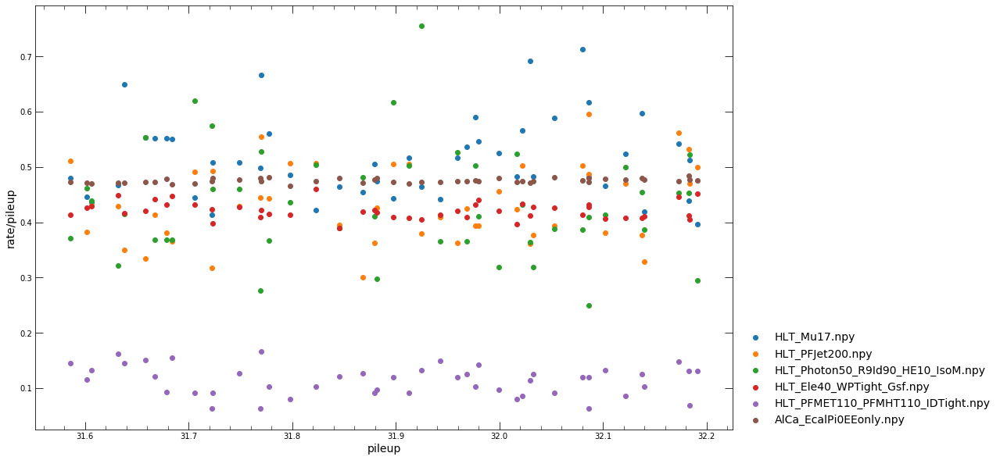

<h2>Plotting Errors</h2>

IndexError: index -1 is out of bounds for axis 0 with size 0

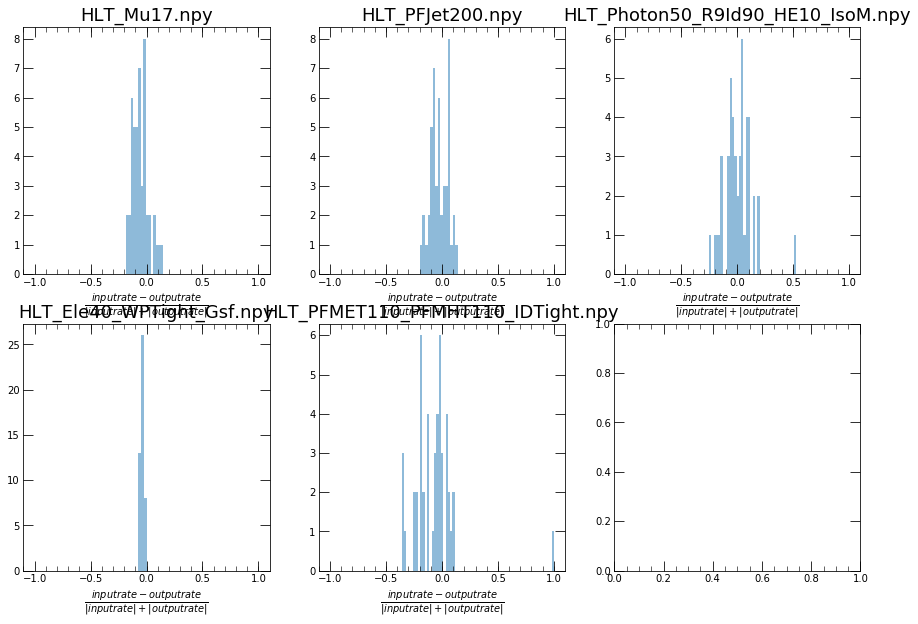

In [27]:
for key in runs_by_era[m]:
    if key != "HLT" and key != "Eras":
        analyze_run(model_name,key)